# Task

Autoencoder Compression:
- Implement a simple autoencoder for the MNIST datasets.
- Train it to compress and reconstruct input images.
- Experiment with different latent (hidden) sizes to analyze their effect on reconstruction quality and compression error.
- Plot the reconstruction error vs. latent size and visualize sample reconstructions for comparison

Variational Autoencoder (VAE):
- Implement a VAE for both MNIST Digits and Fashion-MNIST datasets.
- Train the model to achieve reasonable reconstruction quality and likelihood.
- Visualize generated samples by sampling from the latent space.
- Compare results between MNIST Digits and Fashion-MNIST.

f-VAE:
- Use VAE and RealNVP to implement NF inside VAE latent space
- Train the model to achieve reasonable reconstruction quality and likelihood.
- Visualize generated samples by sampling from the latent space.

Bonus (optional): β-VAE Exploration
- Implement a β-VAE variant by adjusting the KL divergence weight (β).
- Explore how varying β affects:
    - Latent space disentanglement
    - Reconstruction quality
    - Generation diversity
- Visualize the effect of changing individual latent dimensions on generated images.

# Disclaimer

All analytics on the results with the main plots are in the final report. This notebook contains only the training results.

# Imports

In [25]:
import math
import random
from typing import Tuple, Dict, List, Optional, Callable

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Normal
from torch.utils.data import DataLoader, random_split

import torchvision
from torchvision import datasets, transforms

# Data Preparing

In [3]:
def get_mnist_loaders(dataset: str = "mnist", data_root: str = "./data", batch_size: int = 128, val_split: float = 0.1):
  if dataset == "mnist":
      DatasetClass = datasets.MNIST
  else:
      DatasetClass = datasets.FashionMNIST

  transform = transforms.ToTensor() # normalization uint8 [0,255] to float [0,1]

  full_train = DatasetClass(
      root=data_root,
      train=True,
      download=True,
      transform=transform)

  test_ds = DatasetClass(
      root=data_root,
      train=False,
      download=True,
      transform=transform)

  n_total = len(full_train)
  n_val = int(n_total * val_split)
  n_train = n_total - n_val

  print(f"\n--- {dataset.upper()} DATASET ---")
  print(f"Total train images: {n_total}")
  print(f"  Train split:      {n_train}")
  print(f"  Validation split: {n_val}")
  print(f"Test set size:      {len(test_ds)}\n")

  train_ds, val_ds = random_split(
      full_train,
      [n_train, n_val],
      generator=torch.Generator().manual_seed(42))

  train_loader = DataLoader(
      train_ds,
      batch_size=batch_size,
      shuffle=True)

  val_loader = DataLoader(
      val_ds,
      batch_size=batch_size,
      shuffle=False)

  test_loader = DataLoader(
      test_ds,
      batch_size=batch_size,
      shuffle=False)

  return train_loader, val_loader, test_loader

def show_samples(loader, title: str):
  x, y = next(iter(loader))
  x = x[:4]
  y = y[:4]

  fig, axes = plt.subplots(1, 4, figsize=(8, 2))
  fig.suptitle(title)

  for i in range(4):
    img = x[i].squeeze(0)
    axes[i].imshow(img, cmap="gray")
    axes[i].set_title(f"label: {y[i].item()}")
    axes[i].axis("off")

  plt.tight_layout()
  plt.show()

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.58MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 131kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.27MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 7.26MB/s]



--- MNIST DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000



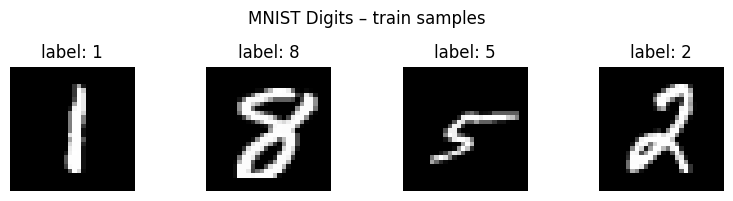

100%|██████████| 26.4M/26.4M [00:02<00:00, 11.2MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 193kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.61MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 19.7MB/s]



--- FASHION DATASET ---
Total train images: 60000
  Train split:      54000
  Validation split: 6000
Test set size:      10000



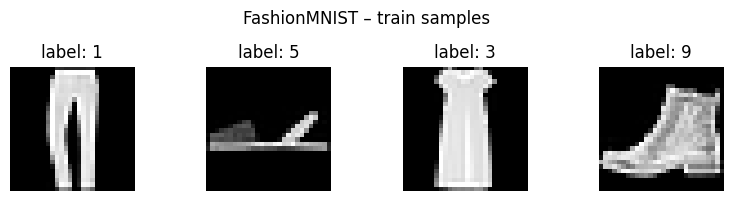

In [4]:
train_digits, val_digits, test_digits = get_mnist_loaders(
    dataset="mnist",
    batch_size=128)
show_samples(train_digits, "MNIST Digits – train samples")

train_fashion, val_fashion, test_fashion = get_mnist_loaders(
    dataset="fashion",
    batch_size=128)
show_samples(train_fashion, "FashionMNIST – train samples")

# General Helpers

In [14]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

### Training & Evaluation

In [15]:
def compute_loss(model: nn.Module, x: torch.Tensor, loss_fn: Optional[Callable] = None) -> Tuple[torch.Tensor, Dict[str, float]]:
  """Compute loss for a batch;handles both AE and VAE"""
  if loss_fn is not None:
    output = model(x)
    loss, metrics = loss_fn(x, output)
    return loss, metrics

  x_recon, _ = model(x)
  loss = F.mse_loss(x_recon, x, reduction='sum') / x.size(0)
  return loss, {'recon_loss': loss.item()}


def train_epoch(model: nn.Module, loader: DataLoader, optimizer: torch.optim.Optimizer,
                device: str, loss_fn: Optional[Callable] = None) -> Dict[str, float]:
  model.train()
  epoch_metrics = {}
  n_batches = 0

  for x, _ in loader:
    x = x.to(device)

    optimizer.zero_grad()
    loss, metrics = compute_loss(model, x, loss_fn)
    loss.backward()
    optimizer.step()

    for key, val in metrics.items():
      epoch_metrics[key] = epoch_metrics.get(key, 0) + val
    n_batches += 1

  return {key: val / n_batches for key, val in epoch_metrics.items()}


def eval_epoch(model: nn.Module, loader: DataLoader, device: str, loss_fn: Optional[Callable] = None) -> Dict[str, float]:
  model.eval()
  epoch_metrics = {}
  n_batches = 0

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)
      _, metrics = compute_loss(model, x, loss_fn)

      for key, val in metrics.items():
        epoch_metrics[key] = epoch_metrics.get(key, 0) + val
      n_batches += 1

  return {key: val / n_batches for key, val in epoch_metrics.items()}


def train_model(model: nn.Module, train_loader: DataLoader, val_loader: DataLoader, epochs: int = 20, lr: float = 1e-3,
                device: str = 'cuda', loss_fn: Optional[Callable] = None, print_every: int = 5) -> Dict[str, List[float]]:
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=lr)

  history = {'train': {}, 'val': {}}

  for epoch in range(epochs):
    train_metrics = train_epoch(model, train_loader, optimizer, device, loss_fn)
    val_metrics = eval_epoch(model, val_loader, device, loss_fn)

    for key, val in train_metrics.items():
      history['train'].setdefault(key, []).append(val)
    for key, val in val_metrics.items():
      history['val'].setdefault(key, []).append(val)

    if (epoch + 1) % print_every == 0:
      train_str = ", ".join([f"{k}: {v:.4f}" for k, v in train_metrics.items()])
      val_str = ", ".join([f"{k}: {v:.4f}" for k, v in val_metrics.items()])
      print(f"Epoch {epoch+1}/{epochs} | Train: {train_str} | Val: {val_str}")

  return history

### Visualization

In [68]:
def visualize_reconstructions(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 8):
  """Show original vs reconstructed images"""
  model.eval()
  x, _ = next(iter(loader))
  x = x[:n_samples].to(device)

  with torch.no_grad():
    output = model(x)
    x_recon = output[0] if isinstance(output, tuple) else output

  x = x.cpu().numpy()
  x_recon = x_recon.cpu().numpy()

  fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 1.5, 3))

  for i in range(n_samples):
    axes[0, i].imshow(x[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
      axes[0, i].set_ylabel('Original', fontsize=12)

    axes[1, i].imshow(x_recon[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
      axes[1, i].set_ylabel('Reconstructed', fontsize=12)

  plt.tight_layout()
  plt.show()


def plot_training_curves(history: Dict[str, Dict[str, List[float]]], title: str = "Training Progress", figsize: Tuple[int, int] = (12, 4)):
  """Plot training and validation curves for all metrics"""
  metrics = list(history['train'].keys())
  n_metrics = len(metrics)

  fig, axes = plt.subplots(1, n_metrics, figsize=figsize)
  if n_metrics == 1:
    axes = [axes]

  for i, metric in enumerate(metrics):
    axes[i].plot(history['train'][metric], label='Train')
    axes[i].plot(history['val'][metric], label='Val')
    axes[i].set_xlabel('Epoch')
    axes[i].set_ylabel(metric.replace('_', ' ').title())
    axes[i].legend()
    axes[i].grid(alpha=0.3)

  plt.suptitle(title)
  plt.tight_layout()
  plt.show()


def generate_from_latent(model: nn.Module, device: str, n_samples: int = 16, latent_range: float = 3.0):
  """Generate images by sampling random latent vectors"""
  model.eval()

  with torch.no_grad():
    z = torch.randn(n_samples, model.latent_dim).to(device) * latent_range
    x_gen = model.decoder(z)

  x_gen = x_gen.cpu().numpy()

  n_cols = 8
  n_rows = (n_samples + n_cols - 1) // n_cols

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.2, n_rows * 1.2))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i in range(n_samples):
    axes[i].imshow(x_gen[i].squeeze(), cmap='gray')
    axes[i].axis('off')

  for i in range(n_samples, len(axes)):
    axes[i].axis('off')

  plt.suptitle('Generated Images from Random Latent Samples', fontsize=14)
  plt.tight_layout()
  plt.show()


def visualize_latent_space_2d(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000):
  """Visualize 2D latent space (only for latent_dim=2)"""
  if model.latent_dim != 2:
    print(f"Latent space visualization only works for 2D, got {model.latent_dim}D")
    return

  model.eval()
  latents, labels_list = [], []

  with torch.no_grad():
    for x, y in loader:
      x = x.to(device)
      encoder_output = model.encoder(x)
      if isinstance(encoder_output, tuple):
        z = encoder_output[0]
      else:
        z = encoder_output
      latents.append(z.cpu().numpy())
      labels_list.append(y.numpy())

      if len(latents) * x.size(0) >= n_samples:
        break

  latents = np.concatenate(latents, axis=0)[:n_samples]
  labels_array = np.concatenate(labels_list, axis=0)[:n_samples]

  plt.figure(figsize=(10, 8))
  scatter = plt.scatter(
      latents[:, 0], latents[:, 1],
      c=labels_array, cmap='tab10', alpha=0.6, s=10)
  plt.colorbar(scatter, label='Digit Class')
  plt.xlabel('Latent Dimension 1')
  plt.ylabel('Latent Dimension 2')
  plt.title('2D Latent Space Visualization')
  plt.grid(alpha=0.3)
  plt.tight_layout()
  plt.show()


def interpolate_between_images(model: nn.Module, loader: DataLoader, device: str, n_steps: int = 10):
  """Interpolate between two images in latent space"""
  model.eval()

  ds = loader.dataset
  i1, i2 = random.sample(range(len(ds)), 2)
  x1, _ = ds[i1]
  x2, _ = ds[i2]
  x1 = x1.unsqueeze(0).to(device)
  x2 = x2.unsqueeze(0).to(device)

  with torch.no_grad():
    encoder_output1 = model.encoder(x1)
    encoder_output2 = model.encoder(x2)

    if isinstance(encoder_output1, tuple):
      z1, z2 = encoder_output1[0], encoder_output2[0]
    else:
      z1, z2 = encoder_output1, encoder_output2

    alphas = torch.linspace(0, 1, n_steps, device=device)
    interpolated = []

    for alpha in alphas:
        z_interp = (1 - alpha) * z1 + alpha * z2
        x_interp = model.decoder(z_interp)
        interpolated.append(x_interp.cpu().numpy())

  fig, axes = plt.subplots(1, n_steps, figsize=(n_steps * 1.2, 1.5))

  for i in range(n_steps):
    axes[i].imshow(interpolated[i].squeeze(), cmap='gray')
    axes[i].axis('off')
    axes[i].set_title(f'α={alphas[i]:.1f}', fontsize=8)

  plt.suptitle('Latent Space Interpolation', fontsize=12)
  plt.tight_layout()
  plt.show()


def compare_training_progress(results_dict: Dict[str, Dict[int, Dict]], latent_dims: List[int], metric: str = 'recon_loss'):
  """Compare training progress across architectures"""
  print("\nTraining Progress Comparison")
  print("-"*70)

  n_archs = len(results_dict)
  fig, axes = plt.subplots(1, n_archs, figsize=(8 * n_archs, 6))
  if n_archs == 1:
    axes = [axes]

  for idx, (arch_name, results) in enumerate(results_dict.items()):
    for latent_dim in latent_dims:
      val_losses = results[latent_dim]['history']['val'][metric]
      axes[idx].plot(val_losses, label=f'latent_dim={latent_dim}', linewidth=2)

    axes[idx].set_xlabel('Epoch', fontsize=12)
    axes[idx].set_ylabel(f'Validation {metric.replace("_", " ").title()}', fontsize=12)
    axes[idx].set_title(f'{arch_name} - Training Progress', fontsize=14)
    axes[idx].legend()
    axes[idx].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()


def visualize_reconstruction_comparison(results_dict: Dict[str, Dict[int, Dict]], latent_dims: List[int], loader: DataLoader,
                                        device: str, n_samples: int = 8):
  """Compare reconstructions across architectures and latent dimensions"""
  print("\nReconstruction Quality Comparison")
  print("-"*70)

  for latent_dim in latent_dims:
    print(f"\nLatent Dimension: {latent_dim}")

    for arch_name, results in results_dict.items():
      print(f"\n{arch_name} Architecture:")
      visualize_reconstructions(results[latent_dim]['model'],
                                loader, device, n_samples=n_samples)

### Experiments

In [17]:
def run_architecture_experiment(model_class: type, train_loader: DataLoader, val_loader: DataLoader, latent_dims: List[int],
                                device: str, epochs: int = 20, loss_fn: Optional[Callable] = None, **model_kwargs) -> Dict[int, Dict]:
  results = {}
  arch_name = model_class.__name__

  print(f"\n{arch_name}")
  print("-"*70)

  for latent_dim in latent_dims:
    print(f"Training with latent_dim = {latent_dim}")

    model = model_class(latent_dim=latent_dim, **model_kwargs)

    history = train_model(model, train_loader, val_loader, epochs=epochs, device=device, loss_fn=loss_fn)

    primary_metric = 'recon_loss' if 'recon_loss' in history['val'] else 'total_loss'
    final_val_loss = history['val'][primary_metric][-1]

    results[latent_dim] = {'model': model,
                            'history': history,
                            'final_val_loss': final_val_loss}

    print(f"Final validation loss: {final_val_loss:.4f}")

  return results


def analyze_single_architecture(results: Dict[int, Dict], arch_name: str, metric: str = 'final_val_loss'):
  print(f"\n{arch_name} Archictecture Analysis")
  print("-"*70)

  latent_sizes = sorted(results.keys())
  val_errors = [results[ld][metric] for ld in latent_sizes]

  plt.figure(figsize=(10, 5))
  plt.plot(latent_sizes, val_errors, marker='o', linewidth=2, markersize=8, color='steelblue')
  plt.xlabel('Latent Dimension Size', fontsize=12)
  plt.ylabel('Reconstruction Error (MSE)', fontsize=12)
  plt.title(f'{arch_name} Reconstruction Error vs Latent Dimension', fontsize=14)
  plt.grid(alpha=0.3)
  plt.xscale('log', base=2)
  plt.xticks(latent_sizes, latent_sizes)
  plt.tight_layout()
  plt.show()

  print(f"\n{arch_name} Summary:")
  print(f"{'Latent Dim':<12} {'Val Loss':<12}")
  print("-" * 24)
  for ld in latent_sizes:
    print(f"{ld:<12} {results[ld][metric]:<12.4f}")


def compare_architectures(results_dict: Dict[str, Dict[int, Dict]], latent_dims: List[int], metric: str = 'final_val_loss'):
  print("\nArchitecture Comparison")
  print("-"*70)

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  # all architectures on same plot
  for arch_name, results in results_dict.items():
    losses = [results[ld][metric] for ld in latent_dims]
    axes[0].plot(latent_dims, losses, marker='o', linewidth=2, markersize=8, label=arch_name)

  axes[0].set_xlabel('Latent Dimension Size', fontsize=12)
  axes[0].set_ylabel('Reconstruction Error (MSE)', fontsize=12)
  axes[0].set_title('Reconstruction Error vs Latent Size', fontsize=14)
  axes[0].legend()
  axes[0].grid(alpha=0.3)
  axes[0].set_xscale('log', base=2)
  axes[0].set_xticks(latent_dims)
  axes[0].set_xticklabels(latent_dims)

  # improvement over baseline (first architecture)
  if len(results_dict) >= 2:
    arch_names = list(results_dict.keys())
    baseline_losses = [results_dict[arch_names[0]][ld][metric] for ld in latent_dims]

    for arch_name in arch_names[1:]:
      losses = [results_dict[arch_name][ld][metric] for ld in latent_dims]
      improvement = [(b - l) / b * 100 for b, l in zip(baseline_losses, losses)]
      axes[1].plot(latent_dims, improvement, marker='s', linewidth=2, markersize=8, label=f'{arch_name} vs {arch_names[0]}')

    axes[1].set_xlabel('Latent Dimension', fontsize=12)
    axes[1].set_ylabel('Improvement (%)', fontsize=12)
    axes[1].set_title('Relative Improvement over Baseline', fontsize=14)
    axes[1].legend()
    axes[1].grid(alpha=0.3)
    axes[1].axhline(y=0, color='red', linestyle='--', linewidth=1)
    axes[1].set_xscale('log', base=2)
    axes[1].set_xticks(latent_dims)
    axes[1].set_xticklabels(latent_dims)

  plt.tight_layout()
  plt.show()

  print("\nSummary Table:")
  header = f"{'Latent Dim':<12} " + " ".join([f"{name:<15}" for name in results_dict.keys()])
  print(header)
  print("-" * len(header))

  for ld in latent_dims:
    row = f"{ld:<12} "
    for results in results_dict.values():
      row += f"{results[ld][metric]:<15.4f} "
    print(row)

# Autoencoder Compression

## Linear Autoencoder Architecture

In [9]:
class LinearEncoder(nn.Module):
  """Fully connected encoder (batch, 1, 28, 28) -> (batch, latent_dim)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.fc1 = nn.Linear(784, 512)
    self.fc2 = nn.Linear(512, 256)
    self.fc3 = nn.Linear(256, latent_dim)
    self.latent_dim = latent_dim

  def forward(self, x):
    x = x.view(x.size(0), -1) # flatten to (batch, 784)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    z = self.fc3(x)
    return z


class LinearDecoder(nn.Module):
  """Fully connected decoder (batch, latent_dim) -> (batch, 1, 28, 28)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.fc1 = nn.Linear(latent_dim, 256)
    self.fc2 = nn.Linear(256, 512)
    self.fc3 = nn.Linear(512, 784)
    self.latent_dim = latent_dim

  def forward(self, z):
    x = F.relu(self.fc1(z))
    x = F.relu(self.fc2(x))
    x = torch.sigmoid(self.fc3(x))
    x = x.view(x.size(0), 1, 28, 28)
    return x


class LinearAutoencoder(nn.Module):
  """Simple fully connected autoencoder"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.encoder = LinearEncoder(latent_dim=latent_dim)
    self.decoder = LinearDecoder(latent_dim=latent_dim)
    self.latent_dim = latent_dim

  def forward(self, x):
    z = self.encoder(x)
    x_recon = self.decoder(z)
    return x_recon, z

## Convolutional Autoencoder Architecture

In [10]:
class ConvEncoder(nn.Module):
  """Convolutional encoder (batch, 1, 28, 28) -> (batch, latent_dim)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()

    self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1) # 28x28 -> 14x14
    self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1) # 14x14 -> 7x7
    self.conv3 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1) # 7x7 -> 7x7

    self.bn1 = nn.BatchNorm2d(32)
    self.bn2 = nn.BatchNorm2d(64)
    self.bn3 = nn.BatchNorm2d(64)

    # fully connected to latent: 64*7*7 = 3136
    self.fc = nn.Linear(64 * 7 * 7, latent_dim)
    self.latent_dim = latent_dim

  def forward(self, x):
    x = F.relu(self.bn1(self.conv1(x)))
    x = F.relu(self.bn2(self.conv2(x)))
    x = F.relu(self.bn3(self.conv3(x)))
    x = x.view(x.size(0), -1)
    z = self.fc(x)
    return z


class ConvDecoder(nn.Module):
  """Convolutional decoder: (batch, latent_dim) -> (batch, 1, 28, 28)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()

    # fully connected from latent to feature map
    self.fc = nn.Linear(latent_dim, 64 * 7 * 7)

    self.deconv1 = nn.ConvTranspose2d(64, 64, kernel_size=3, stride=1, padding=1) # 7x7 -> 7x7
    self.deconv2 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1) # 7x7 -> 14x14
    self.deconv3 = nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1) # 14x14 -> 28x28

    self.bn1 = nn.BatchNorm2d(64)
    self.bn2 = nn.BatchNorm2d(32)
    self.latent_dim = latent_dim

  def forward(self, z):
    x = self.fc(z)
    x = x.view(x.size(0), 64, 7, 7)
    x = F.relu(self.bn1(self.deconv1(x)))
    x = F.relu(self.bn2(self.deconv2(x)))
    x = torch.sigmoid(self.deconv3(x))
    return x


class ConvAutoencoder(nn.Module):
  """Convolutional autoencoder with spatial hierarchy"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.encoder = ConvEncoder(latent_dim=latent_dim)
    self.decoder = ConvDecoder(latent_dim=latent_dim)
    self.latent_dim = latent_dim

  def forward(self, x):
    z = self.encoder(x)
    x_recon = self.decoder(z)
    return x_recon, z

## Experiments

In [24]:
latent_dims = [2, 8, 32, 64]

linear_results = run_architecture_experiment(
    model_class=LinearAutoencoder,
    train_loader=train_digits,
    val_loader=val_digits,
    latent_dims=latent_dims,
    device=device,
    epochs=10)

conv_results = run_architecture_experiment(
    model_class=ConvAutoencoder,
    train_loader=train_digits,
    val_loader=val_digits,
    latent_dims=latent_dims,
    device=device,
    epochs=10)



LinearAutoencoder
----------------------------------------------------------------------
Training with latent_dim = 2
Epoch 5/10 | Train: recon_loss: 31.4440 | Val: recon_loss: 31.4551
Epoch 10/10 | Train: recon_loss: 29.4856 | Val: recon_loss: 29.7079
Final validation loss: 29.7079
Training with latent_dim = 8
Epoch 5/10 | Train: recon_loss: 14.0769 | Val: recon_loss: 14.0488
Epoch 10/10 | Train: recon_loss: 12.1486 | Val: recon_loss: 12.5549
Final validation loss: 12.5549
Training with latent_dim = 32
Epoch 5/10 | Train: recon_loss: 7.8672 | Val: recon_loss: 7.5059
Epoch 10/10 | Train: recon_loss: 5.2015 | Val: recon_loss: 5.4037
Final validation loss: 5.4037
Training with latent_dim = 64
Epoch 5/10 | Train: recon_loss: 7.4745 | Val: recon_loss: 7.1014
Epoch 10/10 | Train: recon_loss: 4.9650 | Val: recon_loss: 5.1269
Final validation loss: 5.1269

ConvAutoencoder
----------------------------------------------------------------------
Training with latent_dim = 2
Epoch 5/10 | Train: r


Architecture Comparison
----------------------------------------------------------------------


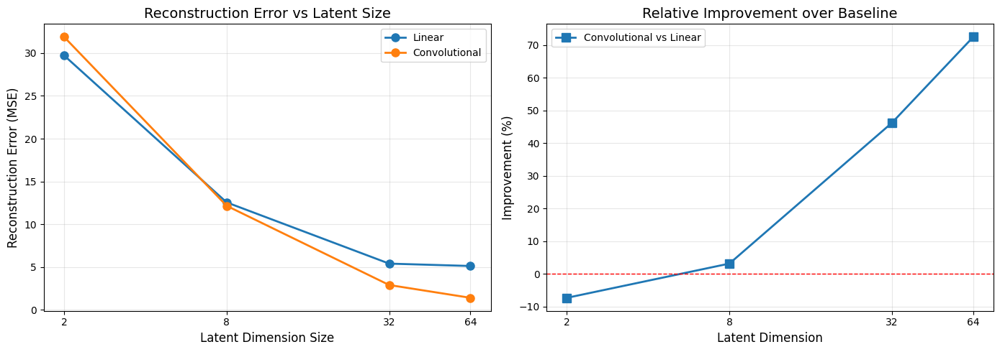


Summary Table:
Latent Dim   Linear          Convolutional  
--------------------------------------------
2            29.7079         31.8732         
8            12.5549         12.1550         
32           5.4037          2.9045          
64           5.1269          1.4100          


In [27]:
compare_architectures(
    results_dict={
        'Linear': linear_results,
        'Convolutional': conv_results
    },
    latent_dims=latent_dims)


Linear Archictecture Analysis
----------------------------------------------------------------------


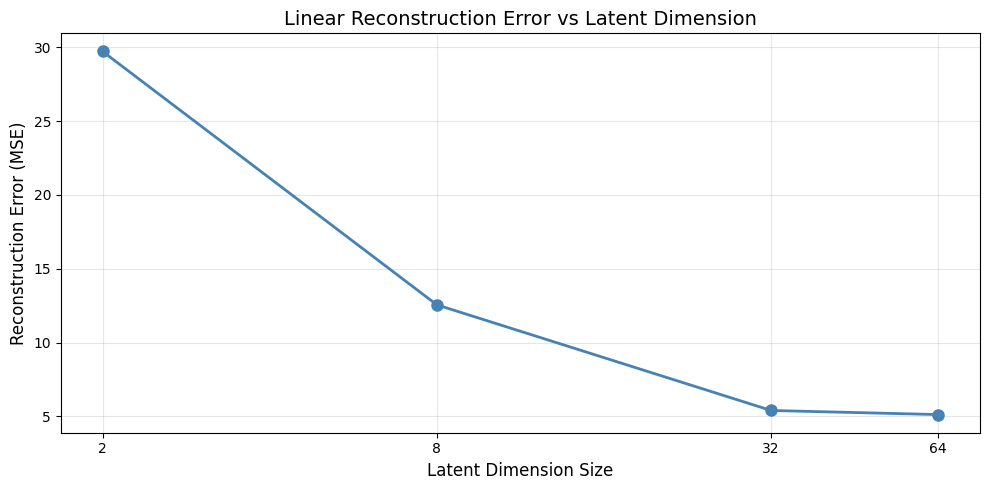


Linear Summary:
Latent Dim   Val Loss    
------------------------
2            29.7079     
8            12.5549     
32           5.4037      
64           5.1269      

Convolutional Archictecture Analysis
----------------------------------------------------------------------


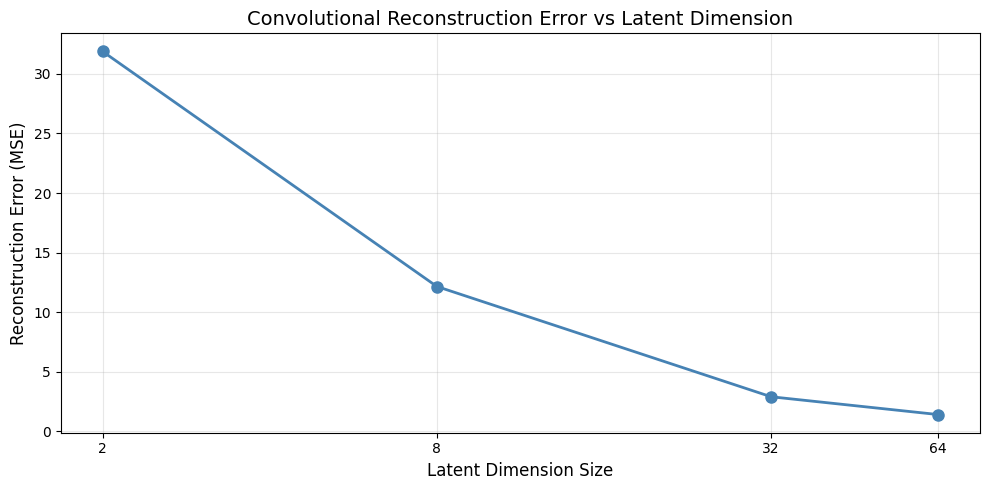


Convolutional Summary:
Latent Dim   Val Loss    
------------------------
2            31.8732     
8            12.1550     
32           2.9045      
64           1.4100      


In [28]:
for arch_name, results in [('Linear', linear_results), ('Convolutional', conv_results)]:
  analyze_single_architecture(results, arch_name)


Training Progress Comparison
----------------------------------------------------------------------


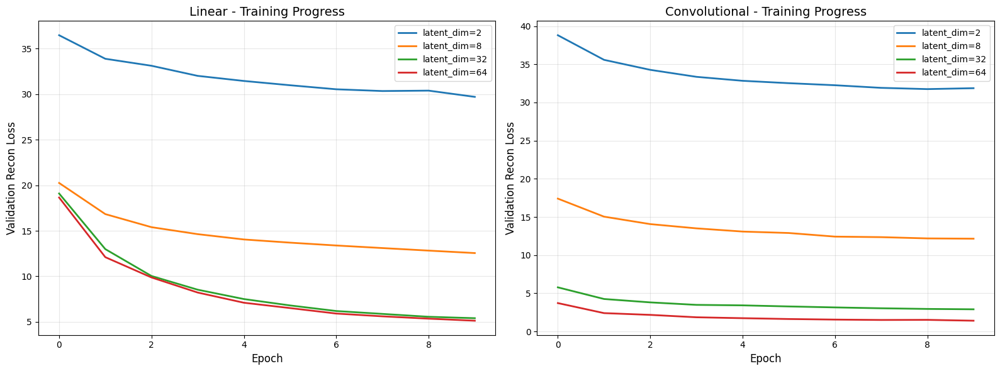

In [29]:
compare_training_progress(
    results_dict={
        'Linear': linear_results,
        'Convolutional': conv_results
    },
    latent_dims=latent_dims,
    metric='recon_loss')


Reconstructio Quality Comparison
----------------------------------------------------------------------

Latent Dimension: 2

Linear Architecture:


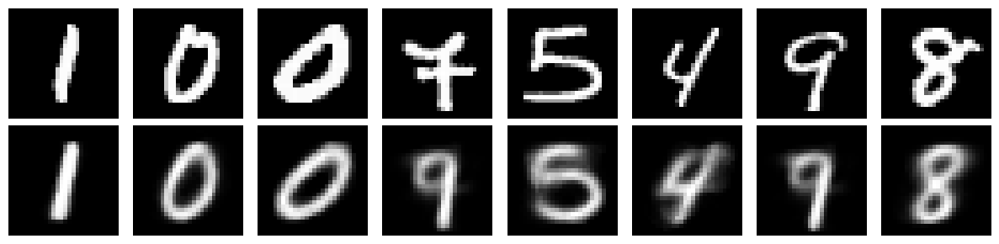


Convolutional Architecture:


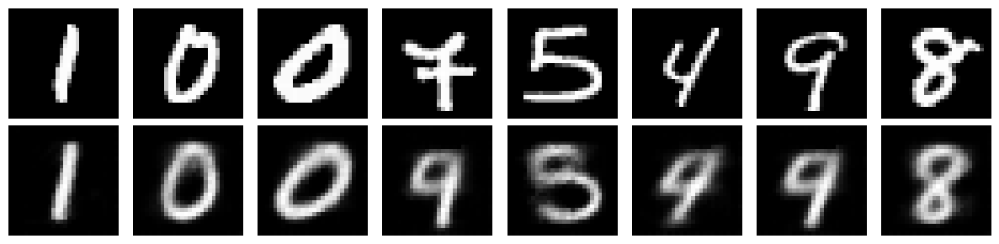


Latent Dimension: 8

Linear Architecture:


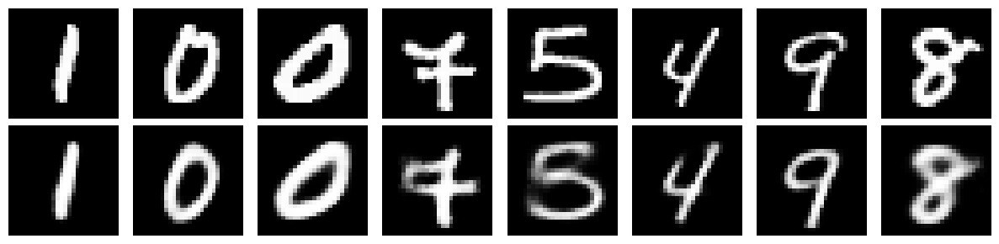


Convolutional Architecture:


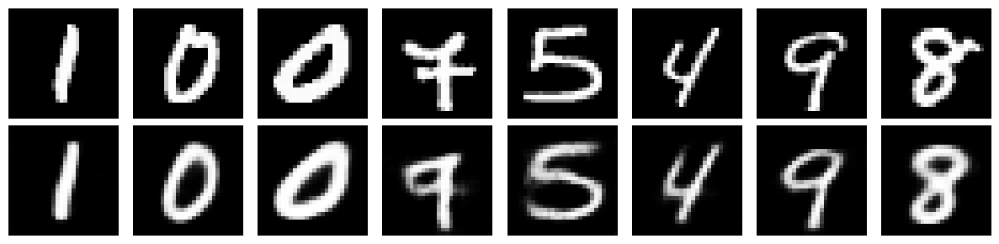


Latent Dimension: 32

Linear Architecture:


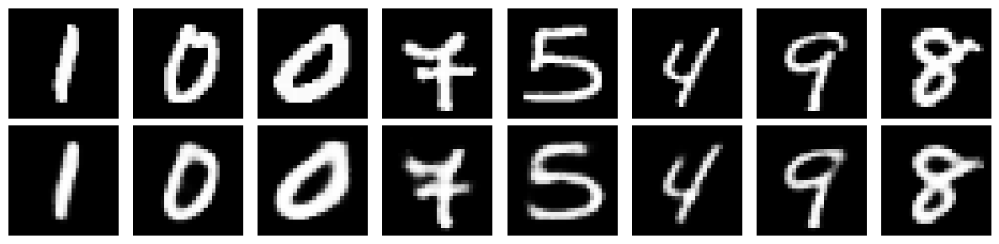


Convolutional Architecture:


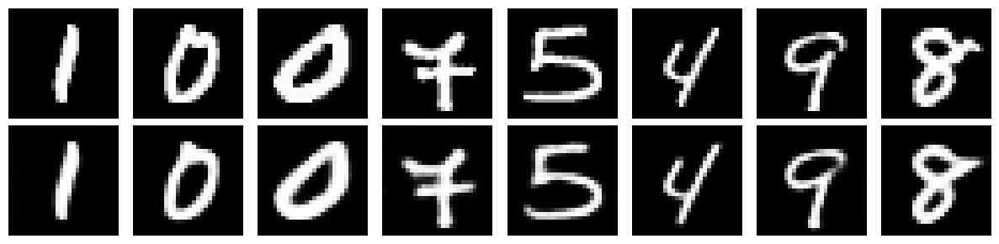


Latent Dimension: 64

Linear Architecture:


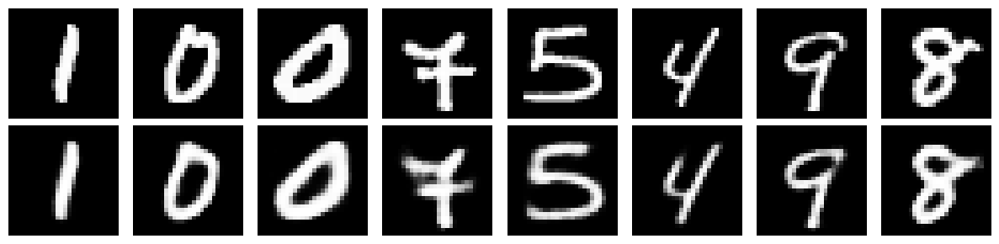


Convolutional Architecture:


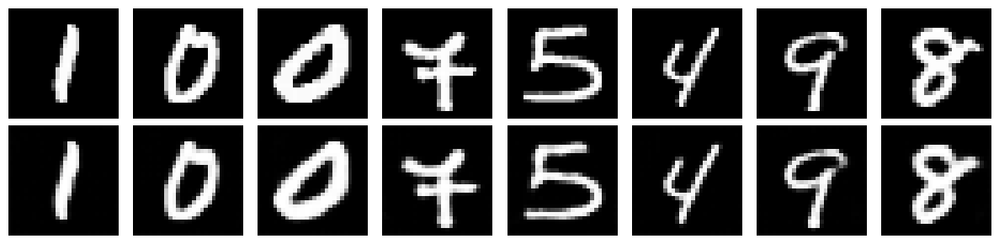

In [30]:
visualize_reconstruction_comparison(
    results_dict={
        'Linear': linear_results,
        'Convolutional': conv_results
    },
    latent_dims=latent_dims,
    loader=val_digits,
    device=device,
    n_samples=8)


Generative Capabilities
----------------------------------------------------------------------

Generated samples (Conv, latent_dim=8):


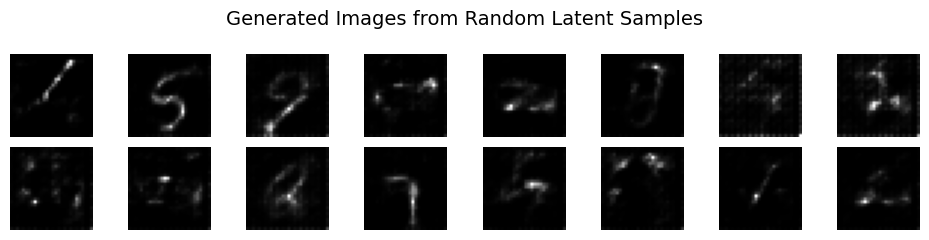


Latent space interpolation (Conv, latent_dim=8):


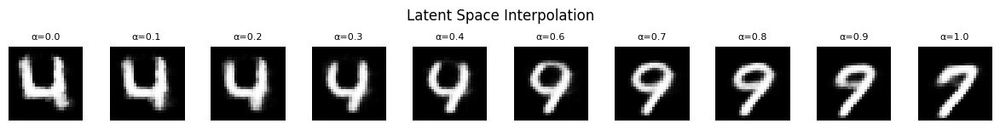

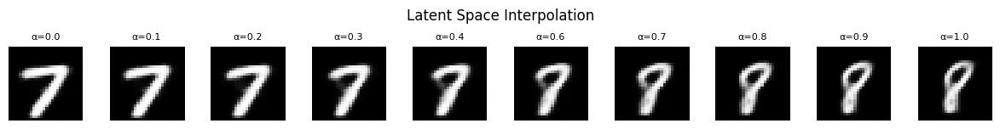

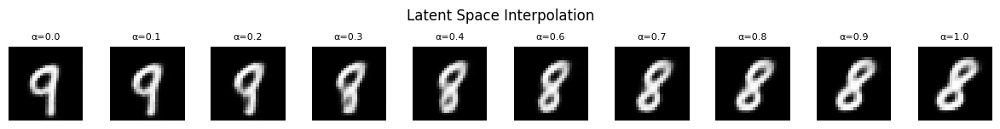

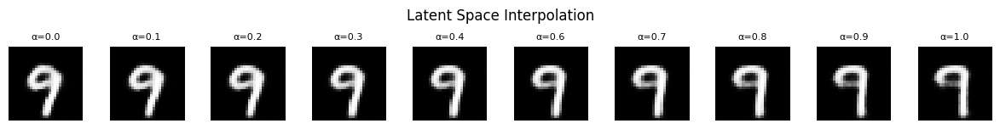

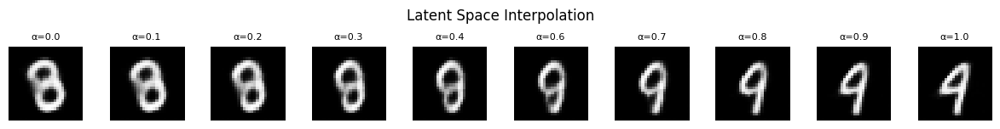

2D Latent Space Visualization
----------------------------------------------------------------------

Linear Autoencoder (latent_dim=2):


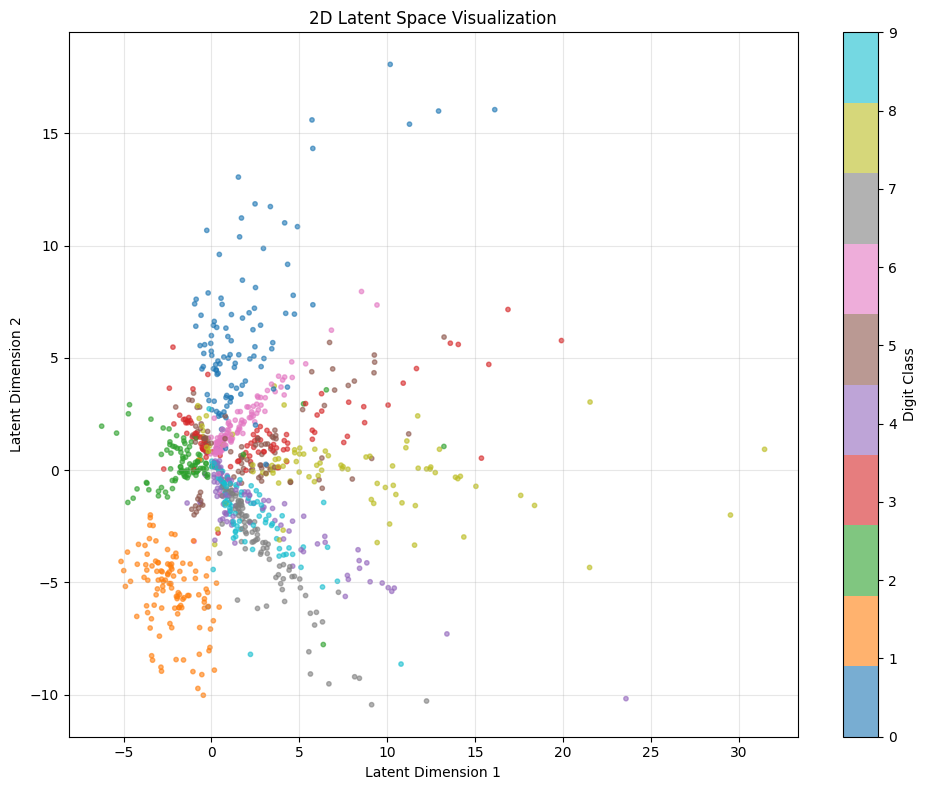


Convolutional Autoencoder (latent_dim=2):


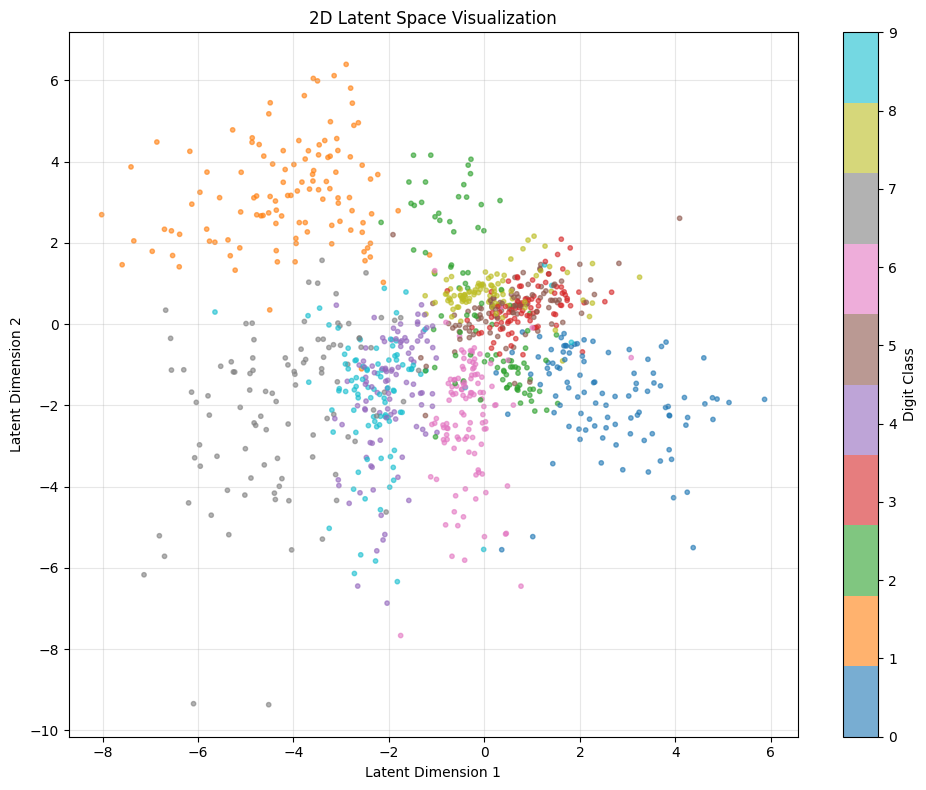

In [37]:
print("Generative Capabilities")
print("-"*70)

print("\nGenerated samples (Conv, latent_dim=8):")
generate_from_latent(conv_results[8]['model'], device, n_samples=16, latent_range=2.0)

print("\nLatent space interpolation (Conv, latent_dim=8):")
for _ in range(5):
  interpolate_between_images(conv_results[8]['model'], val_digits, device, n_steps=10)

print("2D Latent Space Visualization")
print("-"*70)

print("\nLinear Autoencoder (latent_dim=2):")
visualize_latent_space_2d(linear_results[2]['model'], val_digits, device, n_samples=1000)

print("\nConvolutional Autoencoder (latent_dim=2):")
visualize_latent_space_2d(conv_results[2]['model'], val_digits, device, n_samples=1000)

In [32]:
print("\nBest models per architecture:")
print("-"*70)
for arch_name, results in [('Linear', linear_results), ('Convolutional', conv_results)]:
  best_ld = min(latent_dims, key=lambda ld: results[ld]['final_val_loss'])
  best_loss = results[best_ld]['final_val_loss']
  print(f"{arch_name}: latent_dim={best_ld}, val_loss={best_loss:.4f}")


Best models per architecture:
----------------------------------------------------------------------
Linear: latent_dim=64, val_loss=5.1269
Convolutional: latent_dim=64, val_loss=1.4100


# Variational Autoencoder (VAE)

## Linear VAE Architecture

In [38]:
class LinearVAEEncoder(nn.Module):
  """Fully connected VAE encoder (batch, 1, 28, 28) -> (mu, logvar)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.fc1 = nn.Linear(784, 512)
    self.fc2 = nn.Linear(512, 256)

    # separate heads for mu and logvar
    self.fc_mu = nn.Linear(256, latent_dim)
    self.fc_logvar = nn.Linear(256, latent_dim)

    self.latent_dim = latent_dim

  def forward(self, x):
    x = x.view(x.size(0), -1)  # flatten to (batch, 784)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))

    mu = self.fc_mu(x)
    logvar = self.fc_logvar(x)

    return mu, logvar


class LinearVAEDecoder(nn.Module):
  """Fully connected VAE decoder (batch, latent_dim) -> (batch, 1, 28, 28)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.fc1 = nn.Linear(latent_dim, 256)
    self.fc2 = nn.Linear(256, 512)
    self.fc3 = nn.Linear(512, 784)
    self.latent_dim = latent_dim

  def forward(self, z):
    x = F.relu(self.fc1(z))
    x = F.relu(self.fc2(x))
    x = torch.sigmoid(self.fc3(x))
    x = x.view(x.size(0), 1, 28, 28)
    return x


class LinearVAE(nn.Module):
  """Linear Variational Autoencoder"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.encoder = LinearVAEEncoder(latent_dim=latent_dim)
    self.decoder = LinearVAEDecoder(latent_dim=latent_dim)
    self.latent_dim = latent_dim

  def reparameterize(self, mu, logvar):
    """reparameterization trick z = mu + sigma * epsilon"""
    std = torch.exp(0.5 * logvar)
    eps = torch.randn_like(std)
    return mu + eps * std

  def forward(self, x):
    mu, logvar = self.encoder(x)
    z = self.reparameterize(mu, logvar)
    x_recon = self.decoder(z)
    return x_recon, mu, logvar

## Convolutional VAE Architecture

In [39]:
class ConvVAEEncoder(nn.Module):
  """Convolutional VAE encoder: (batch, 1, 28, 28) -> (mu, logvar)"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()

    self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1) # 28x28 -> 14x14
    self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1) # 14x14 -> 7x7
    self.conv3 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1) # 7x7 -> 7x7

    self.bn1 = nn.BatchNorm2d(32)
    self.bn2 = nn.BatchNorm2d(64)
    self.bn3 = nn.BatchNorm2d(64)

    # separate heads for mu and logvar
    self.fc_mu = nn.Linear(64 * 7 * 7, latent_dim)
    self.fc_logvar = nn.Linear(64 * 7 * 7, latent_dim)

    self.latent_dim = latent_dim

  def forward(self, x):
    x = F.relu(self.bn1(self.conv1(x)))
    x = F.relu(self.bn2(self.conv2(x)))
    x = F.relu(self.bn3(self.conv3(x)))
    x = x.view(x.size(0), -1)

    mu = self.fc_mu(x)
    logvar = self.fc_logvar(x)

    return mu, logvar


class ConvVAEDecoder(nn.Module):
    """Convolutional VAE decoder: (batch, latent_dim) -> (batch, 1, 28, 28)"""

    def __init__(self, latent_dim: int = 32):
      super().__init__()

      # fully connected from latent to feature map
      self.fc = nn.Linear(latent_dim, 64 * 7 * 7)

      self.deconv1 = nn.ConvTranspose2d(64, 64, kernel_size=3, stride=1, padding=1) # 7x7 -> 7x7
      self.deconv2 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1) # 7x7 -> 14x14
      self.deconv3 = nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1) # 14x14 -> 28x28

      self.bn1 = nn.BatchNorm2d(64)
      self.bn2 = nn.BatchNorm2d(32)
      self.latent_dim = latent_dim

    def forward(self, z):
      x = self.fc(z)
      x = x.view(x.size(0), 64, 7, 7)
      x = F.relu(self.bn1(self.deconv1(x)))
      x = F.relu(self.bn2(self.deconv2(x)))
      x = torch.sigmoid(self.deconv3(x))
      return x


class ConvVAE(nn.Module):
  """Convolutional Variational Autoencoder"""

  def __init__(self, latent_dim: int = 32):
    super().__init__()
    self.encoder = ConvVAEEncoder(latent_dim=latent_dim)
    self.decoder = ConvVAEDecoder(latent_dim=latent_dim)
    self.latent_dim = latent_dim

  def reparameterize(self, mu, logvar):
    """reparameterization trick z = mu + sigma * epsilon"""
    std = torch.exp(0.5 * logvar)
    eps = torch.randn_like(std)
    return mu + eps * std

  def forward(self, x):
    mu, logvar = self.encoder(x)
    z = self.reparameterize(mu, logvar)
    x_recon = self.decoder(z)
    return x_recon, mu, logvar

## Helpers

### Loss Function

In [40]:
def vae_loss_function(x, model_output, beta=1.0):
  """VAE loss = Reconstruction loss + KL divergence"""
  x_recon, mu, logvar = model_output

  # MSE as a reconstruction loss for consistency with autoencoders
  recon_loss = F.mse_loss(x_recon, x, reduction='sum') / x.size(0)

  # Binary Cross Entropy as an alternative
  # recon_loss = F.binary_cross_entropy(x_recon, x, reduction='sum') / x.size(0)

  # KL divergence
  kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)

  total_loss = recon_loss + beta * kl_loss

  metrics = {'recon_loss': recon_loss.item(),
             'kl_loss': kl_loss.item(),
             'total_loss': total_loss.item()}

  return total_loss, metrics

def create_vae_loss_fn(beta=1.0):
  """Factory function to create VAE loss with specific beta"""
  def loss_fn(x, model_output):
      return vae_loss_function(x, model_output, beta=beta)
  return loss_fn

### Visualization

In [62]:
def sample_from_prior(model: nn.Module, device: str, n_samples: int = 16, latent_range: float = 2.0) -> torch.Tensor:
  """Sample from the prior distribution N(0,I) and generate images"""
  model.eval()

  with torch.no_grad():
    z = torch.randn(n_samples, model.latent_dim).to(device) * latent_range
    x_gen = model.decoder(z)

  return x_gen


def visualize_vae_samples(model: nn.Module, device: str, n_samples: int = 16, latent_range: float = 2.0,
                          title: str = "VAE Generated Samples"):
  """Visualize samples from VAE's learned prior"""
  x_gen = sample_from_prior(model, device, n_samples, latent_range)
  x_gen = x_gen.cpu().numpy()

  n_cols = 8
  n_rows = (n_samples + n_cols - 1) // n_cols

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.2, n_rows * 1.2))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i in range(n_samples):
    axes[i].imshow(x_gen[i].squeeze(), cmap='gray')
    axes[i].axis('off')

  for i in range(n_samples, len(axes)):
    axes[i].axis('off')

  plt.suptitle(title, fontsize=14)
  plt.tight_layout()
  plt.show()


def visualize_latent_manifold_2d(model: nn.Module, device: str, n_samples: int = 20, range_limit: float = 3.0):
  """Visualize 2D latent manifold (only for latent_dim=2) by createinf a grid and decoding each point"""
  if model.latent_dim != 2:
    print(f"Latent manifold visualization only works for 2D, got {model.latent_dim}D")
    return

  model.eval()

  # create grid in latent space
  x_grid = np.linspace(-range_limit, range_limit, n_samples)
  y_grid = np.linspace(-range_limit, range_limit, n_samples)

  fig, axes = plt.subplots(n_samples, n_samples, figsize=(12, 12))

  with torch.no_grad():
    for i, y in enumerate(reversed(y_grid)):
      for j, x in enumerate(x_grid):
        z = torch.tensor([[x, y]], dtype=torch.float32).to(device)
        x_decoded = model.decoder(z)
        axes[i, j].imshow(x_decoded.cpu().squeeze(), cmap='gray')
        axes[i, j].axis('off')

  plt.suptitle('VAE 2D Latent Manifold', fontsize=16)
  plt.tight_layout()
  plt.show()


def compare_reconstruction_and_samples(model: nn.Module, loader: DataLoader, device: str, n_recon: int = 8, n_samples: int = 8):
  """Side-by-side comparison of original images / reconstructions / random samples from prior"""
  model.eval()

  # real images
  x_real, _ = next(iter(loader))
  x_real = x_real[:n_recon].to(device)

  with torch.no_grad():
    # reconstructions
    x_recon, _, _ = model(x_real)

    # samples from prior
    z_sample = torch.randn(n_samples, model.latent_dim).to(device)
    x_sample = model.decoder(z_sample)

  x_real = x_real.cpu().numpy()
  x_recon = x_recon.cpu().numpy()
  x_sample = x_sample.cpu().numpy()

  fig, axes = plt.subplots(3, max(n_recon, n_samples), figsize=(max(n_recon, n_samples) * 1.5, 4.5))

  for i in range(n_recon):
    axes[0, i].imshow(x_real[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
      axes[0, i].set_ylabel('Original', fontsize=12)

    axes[1, i].imshow(x_recon[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
      axes[1, i].set_ylabel('Reconstructed', fontsize=12)

  for i in range(n_samples):
    axes[2, i].imshow(x_sample[i].squeeze(), cmap='gray')
    axes[2, i].axis('off')
    if i == 0:
      axes[2, i].set_ylabel('Generated', fontsize=12)

  for i in range(max(n_recon, n_samples)):
    if i >= n_recon:
      axes[0, i].axis('off')
      axes[1, i].axis('off')
    if i >= n_samples:
      axes[2, i].axis('off')

  plt.tight_layout()
  plt.show()


def visualize_latent_distributions(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000):
  """Visualize learned latent distributions"""
  model.eval()

  all_mu = []
  all_logvar = []

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)
      mu, logvar = model.encoder(x)
      all_mu.append(mu.cpu().numpy())
      all_logvar.append(logvar.cpu().numpy())

      if len(all_mu) * x.size(0) >= n_samples:
        break

  all_mu = np.concatenate(all_mu, axis=0)[:n_samples]
  all_logvar = np.concatenate(all_logvar, axis=0)[:n_samples]
  all_std = np.exp(0.5 * all_logvar)

  n_dims = min(model.latent_dim, 16)

  fig, axes = plt.subplots(2, 1, figsize=(12, 8))

  axes[0].violinplot([all_mu[:, i] for i in range(n_dims)],
                      positions=range(n_dims),
                      showmeans=True,
                      showmedians=False)
  axes[0].axhline(y=0, color='r', linestyle='--', alpha=0.5)
  axes[0].set_xlabel('Latent Dimension')
  axes[0].set_ylabel('Mean (μ)')
  axes[0].set_title('Distribution of Latent Means')
  axes[0].grid(alpha=0.3)

  axes[1].violinplot([all_std[:, i] for i in range(n_dims)],
                      positions=range(n_dims),
                      showmeans=True,
                      showmedians=False)
  axes[1].axhline(y=1, color='r', linestyle='--', alpha=0.5, label='Prior std=1')
  axes[1].set_xlabel('Latent Dimension')
  axes[1].set_ylabel('Std (σ)')
  axes[1].set_title('Distribution of Latent Standard Deviations')
  axes[1].legend()
  axes[1].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()


def analyze_vae_latent_space(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000):
  """KL divergence per dimension / active units (dimensions with high variance)
  """
  model.eval()

  all_mu = []
  all_logvar = []

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)
      mu, logvar = model.encoder(x)
      all_mu.append(mu.cpu().numpy())
      all_logvar.append(logvar.cpu().numpy())

      if len(all_mu) * x.size(0) >= n_samples:
        break

  all_mu = np.concatenate(all_mu, axis=0)[:n_samples]
  all_logvar = np.concatenate(all_logvar, axis=0)[:n_samples]

  # KL divergence per dimension
  kl_per_dim = 0.5 * np.mean(1 + all_logvar - all_mu**2 - np.exp(all_logvar), axis=0)
  kl_per_dim = -kl_per_dim

  # active units
  mu_var = np.var(all_mu, axis=0)
  active_threshold = 0.01
  active_units = np.sum(mu_var > active_threshold)

  print(f"\n{'-'*70}")
  print(f"Latent Space Analysis (latent_dim={model.latent_dim})")
  print(f"{'-'*70}")
  print(f"Active units (var > {active_threshold}): {active_units}/{model.latent_dim}")
  print(f"Total KL divergence: {kl_per_dim.sum():.4f}")
  print(f"Average KL per dimension: {kl_per_dim.mean():.4f}")
  print(f"Max KL dimension: {kl_per_dim.max():.4f}")
  print(f"Min KL dimension: {kl_per_dim.min():.4f}")

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  n_dims = min(model.latent_dim, 32)
  axes[0].bar(range(n_dims), kl_per_dim[:n_dims], color='steelblue', alpha=0.7)
  axes[0].set_xlabel('Latent Dimension')
  axes[0].set_ylabel('KL Divergence')
  axes[0].set_title('KL Divergence per Dimension')
  axes[0].grid(alpha=0.3, axis='y')

  axes[1].bar(range(n_dims), mu_var[:n_dims], color='coral', alpha=0.7)
  axes[1].axhline(y=active_threshold, color='red', linestyle='--', label=f'Threshold={active_threshold}')
  axes[1].set_xlabel('Latent Dimension')
  axes[1].set_ylabel('Variance of μ')
  axes[1].set_title('Latent Dimension Utilization')
  axes[1].legend()
  axes[1].grid(alpha=0.3, axis='y')

  plt.tight_layout()
  plt.show()

## Experiments

In [43]:
latent_dims = [2, 8, 16, 32]
vae_loss_fn = create_vae_loss_fn(beta=1.0)

linear_vae_digits = run_architecture_experiment(
    model_class=LinearVAE,
    train_loader=train_digits,
    val_loader=val_digits,
    latent_dims=latent_dims,
    device=device,
    epochs=20,
    loss_fn=vae_loss_fn)

conv_vae_digits = run_architecture_experiment(
    model_class=ConvVAE,
    train_loader=train_digits,
    val_loader=val_digits,
    latent_dims=latent_dims,
    device=device,
    epochs=20,
    loss_fn=vae_loss_fn)

linear_vae_fashion = run_architecture_experiment(
    model_class=LinearVAE,
    train_loader=train_fashion,
    val_loader=val_fashion,
    latent_dims=latent_dims,
    device=device,
    epochs=20,
    loss_fn=vae_loss_fn)

conv_vae_fashion = run_architecture_experiment(
    model_class=ConvVAE,
    train_loader=train_fashion,
    val_loader=val_fashion,
    latent_dims=latent_dims,
    device=device,
    epochs=20,
    loss_fn=vae_loss_fn)


LinearVAE
----------------------------------------------------------------------
Training with latent_dim = 2
Epoch 5/20 | Train: recon_loss: 33.2016, kl_loss: 4.4522, total_loss: 37.6538 | Val: recon_loss: 32.8705, kl_loss: 4.6444, total_loss: 37.5149
Epoch 10/20 | Train: recon_loss: 31.1056, kl_loss: 4.8814, total_loss: 35.9870 | Val: recon_loss: 31.2692, kl_loss: 4.9993, total_loss: 36.2685
Epoch 15/20 | Train: recon_loss: 30.1416, kl_loss: 5.0777, total_loss: 35.2193 | Val: recon_loss: 30.5237, kl_loss: 5.0980, total_loss: 35.6217
Epoch 20/20 | Train: recon_loss: 29.5062, kl_loss: 5.2345, total_loss: 34.7407 | Val: recon_loss: 30.0455, kl_loss: 5.1327, total_loss: 35.1782
Final validation loss: 30.0455
Training with latent_dim = 8
Epoch 5/20 | Train: recon_loss: 22.5342, kl_loss: 8.5474, total_loss: 31.0816 | Val: recon_loss: 22.6922, kl_loss: 8.2837, total_loss: 30.9758
Epoch 10/20 | Train: recon_loss: 20.2947, kl_loss: 9.1844, total_loss: 29.4790 | Val: recon_loss: 20.3447, kl_l

MNIST DIGITS: Architecture Comparison
----------------------------------------------------------------------

Architecture Comparison
----------------------------------------------------------------------


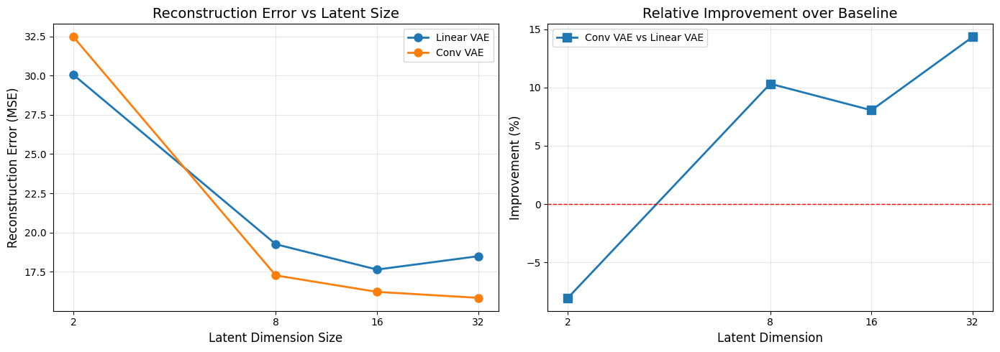


Summary Table:
Latent Dim   Linear VAE      Conv VAE       
--------------------------------------------
2            30.0455         32.4577         
8            19.2560         17.2693         
16           17.6426         16.2227         
32           18.4925         15.8430         

Linear VAE - MNIST Digits Archictecture Analysis
----------------------------------------------------------------------


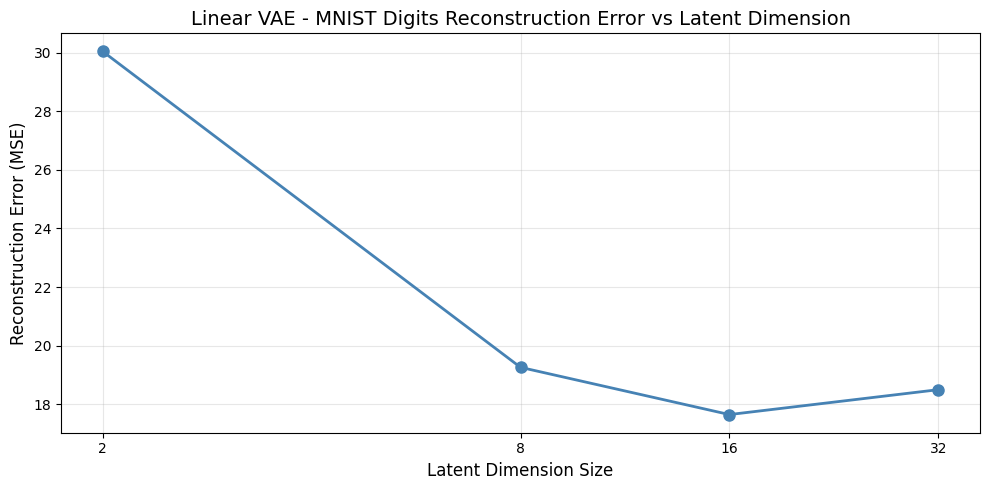


Linear VAE - MNIST Digits Summary:
Latent Dim   Val Loss    
------------------------
2            30.0455     
8            19.2560     
16           17.6426     
32           18.4925     

Conv VAE - MNIST Digits Archictecture Analysis
----------------------------------------------------------------------


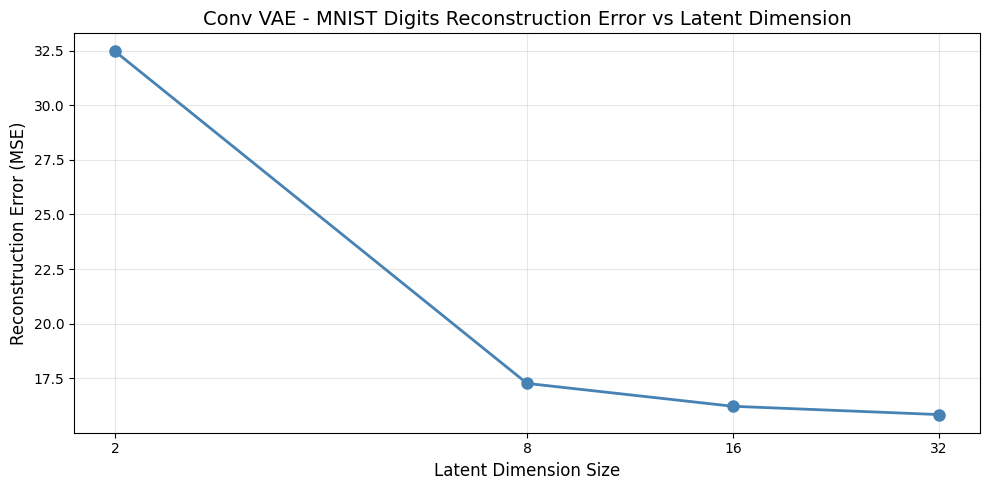


Conv VAE - MNIST Digits Summary:
Latent Dim   Val Loss    
------------------------
2            32.4577     
8            17.2693     
16           16.2227     
32           15.8430     


In [44]:
print("MNIST DIGITS: Architecture Comparison")
print("-"*70)

compare_architectures(
    results_dict={
        'Linear VAE': linear_vae_digits,
        'Conv VAE': conv_vae_digits
    },
    latent_dims=latent_dims,
    metric='final_val_loss')

analyze_single_architecture(linear_vae_digits, 'Linear VAE - MNIST Digits')
analyze_single_architecture(conv_vae_digits, 'Conv VAE - MNIST Digits')

FASHION-MNIST: Architecture Comparison
----------------------------------------------------------------------

Architecture Comparison
----------------------------------------------------------------------


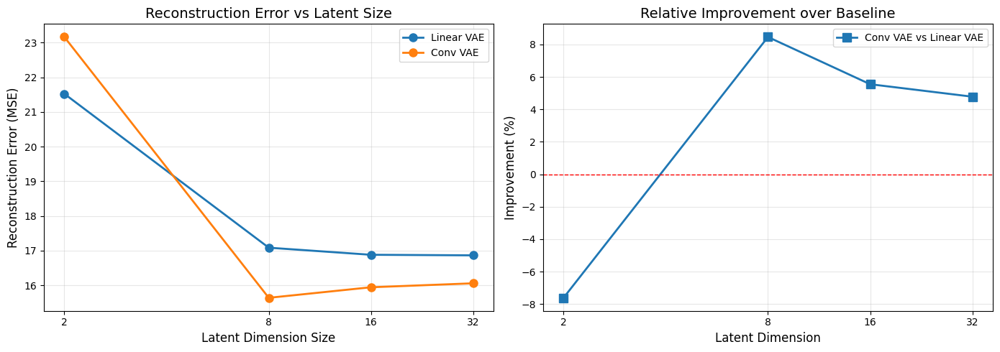


Summary Table:
Latent Dim   Linear VAE      Conv VAE       
--------------------------------------------
2            21.5247         23.1632         
8            17.0859         15.6401         
16           16.8815         15.9445         
32           16.8651         16.0585         

Linear VAE - Fashion-MNIST Archictecture Analysis
----------------------------------------------------------------------


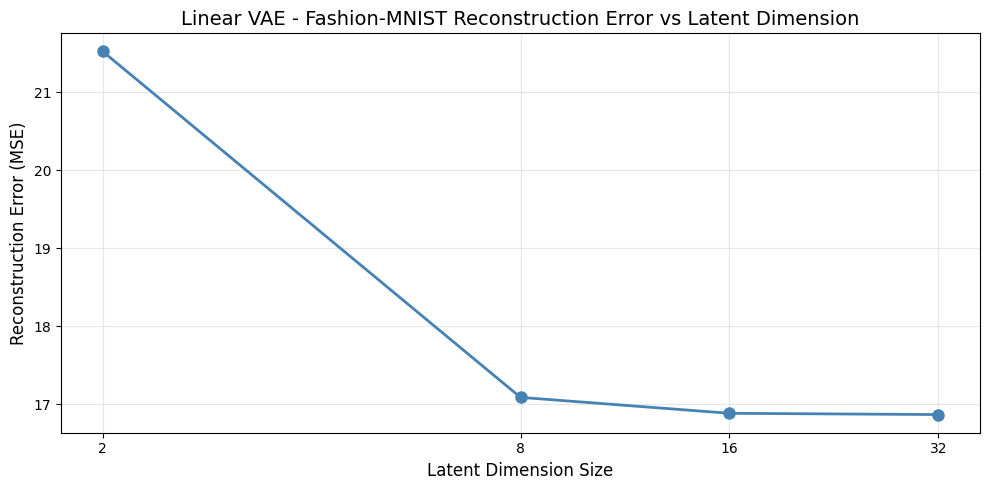


Linear VAE - Fashion-MNIST Summary:
Latent Dim   Val Loss    
------------------------
2            21.5247     
8            17.0859     
16           16.8815     
32           16.8651     

Conv VAE - Fashion-MNIST Archictecture Analysis
----------------------------------------------------------------------


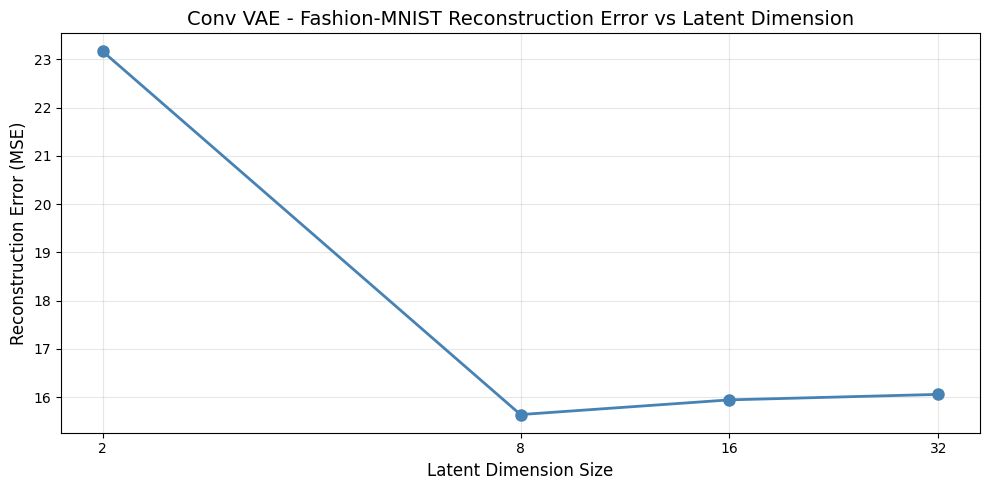


Conv VAE - Fashion-MNIST Summary:
Latent Dim   Val Loss    
------------------------
2            23.1632     
8            15.6401     
16           15.9445     
32           16.0585     


In [46]:
print("FASHION-MNIST: Architecture Comparison")
print("-"*70)

compare_architectures(
    results_dict={
        'Linear VAE': linear_vae_fashion,
        'Conv VAE': conv_vae_fashion
    },
    latent_dims=latent_dims,
    metric='final_val_loss')

analyze_single_architecture(linear_vae_fashion, 'Linear VAE - Fashion-MNIST')
analyze_single_architecture(conv_vae_fashion, 'Conv VAE - Fashion-MNIST')

Dataset Comparison: MNIST DIGITS vs FASHION-MNIST
----------------------------------------------------------------------

Architecture Comparison
----------------------------------------------------------------------


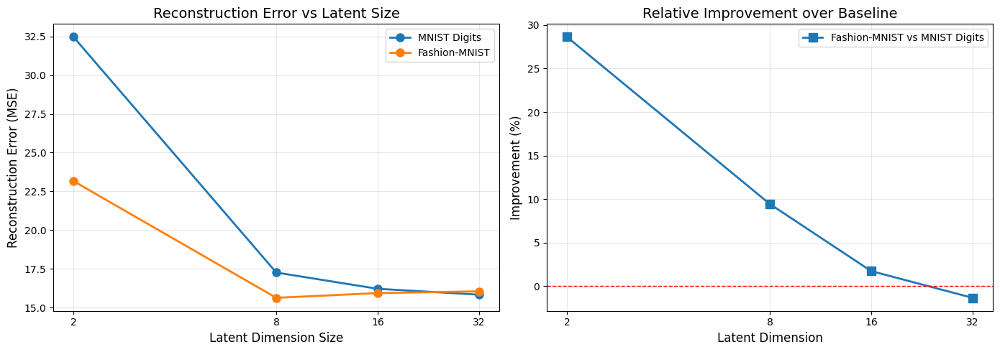


Summary Table:
Latent Dim   MNIST Digits    Fashion-MNIST  
--------------------------------------------
2            32.4577         23.1632         
8            17.2693         15.6401         
16           16.2227         15.9445         
32           15.8430         16.0585         


In [47]:
print("Dataset Comparison: MNIST DIGITS vs FASHION-MNIST")
print("-"*70)

compare_architectures(
    results_dict={
        'MNIST Digits': conv_vae_digits,
        'Fashion-MNIST': conv_vae_fashion
    },
    latent_dims=latent_dims,
    metric='final_val_loss')

Trainig Dynamics: MNIST DIGITS
----------------------------------------------------------------------

Training Progress Comparison
----------------------------------------------------------------------


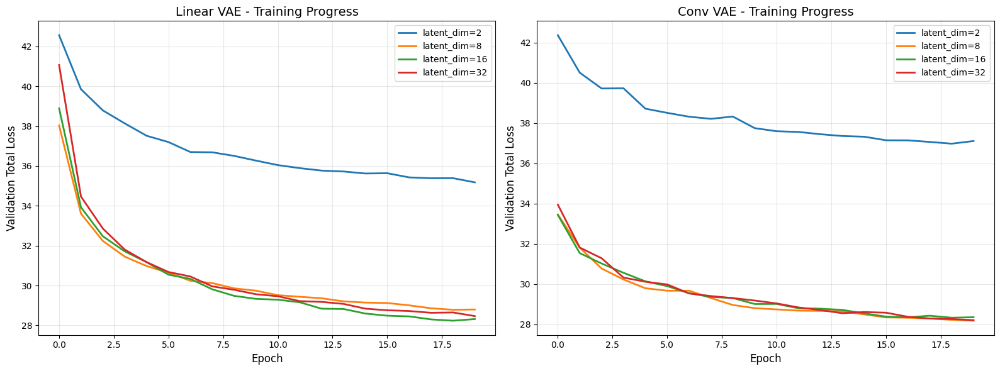

In [48]:
print("Trainig Dynamics: MNIST DIGITS")
print("-"*70)


compare_training_progress(
    results_dict={
        'Linear VAE': linear_vae_digits,
        'Conv VAE': conv_vae_digits
    },
    latent_dims=latent_dims,
    metric='total_loss')

Trainig Dynamics: FASHION-MNIST
----------------------------------------------------------------------

Training Progress Comparison
----------------------------------------------------------------------


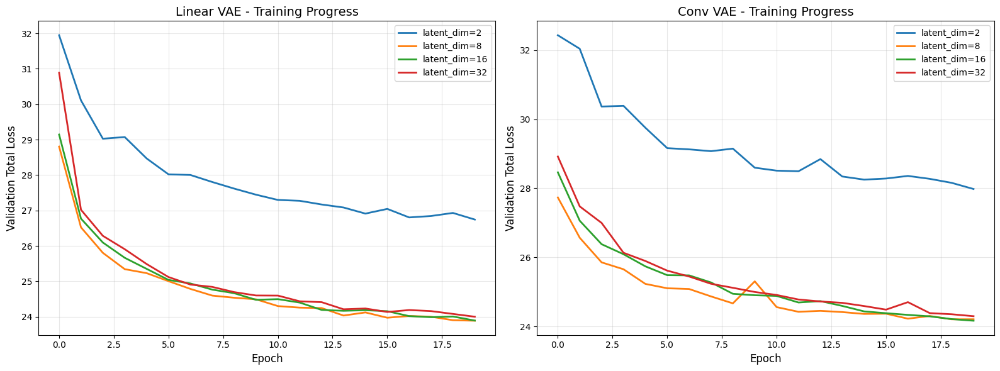

In [49]:
print("Trainig Dynamics: FASHION-MNIST")
print("-"*70)

compare_training_progress(
    results_dict={
        'Linear VAE': linear_vae_fashion,
        'Conv VAE': conv_vae_fashion
    },
    latent_dims=latent_dims,
    metric='total_loss')

Loss Components Breakdown
----------------------------------------------------------------------

MNIST Digits:


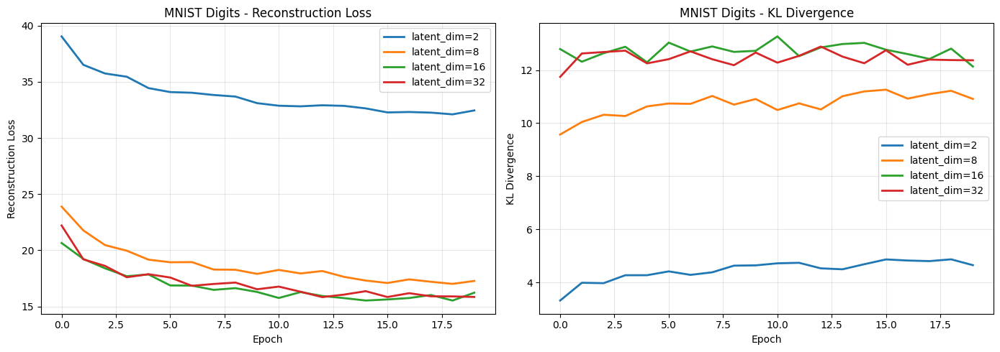


Fashion-MNIST:


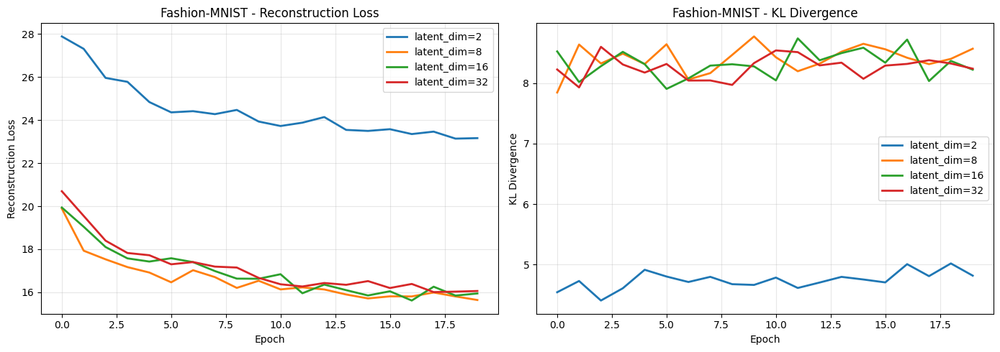

In [50]:
print("Loss Components Breakdown")
print("-"*70)

for dataset_name, results in [('MNIST Digits', conv_vae_digits), ('Fashion-MNIST', conv_vae_fashion)]:
  print(f"\n{dataset_name}:")

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  for latent_dim in latent_dims:
    history = results[latent_dim]['history']
    recon = history['val']['recon_loss']
    kl = history['val']['kl_loss']

    axes[0].plot(recon, label=f'latent_dim={latent_dim}', linewidth=2)
    axes[1].plot(kl, label=f'latent_dim={latent_dim}', linewidth=2)

  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Reconstruction Loss')
  axes[0].set_title(f'{dataset_name} - Reconstruction Loss')
  axes[0].legend()
  axes[0].grid(alpha=0.3)

  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('KL Divergence')
  axes[1].set_title(f'{dataset_name} - KL Divergence')
  axes[1].legend()
  axes[1].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()


Reconstructions: MNIST DIGITS
----------------------------------------------------------------------

Reconstruction Quality Comparison
----------------------------------------------------------------------

Latent Dimension: 2

Linear VAE Architecture:


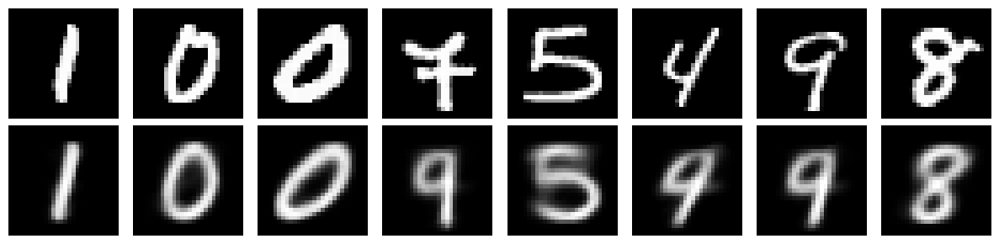


Conv VAE Architecture:


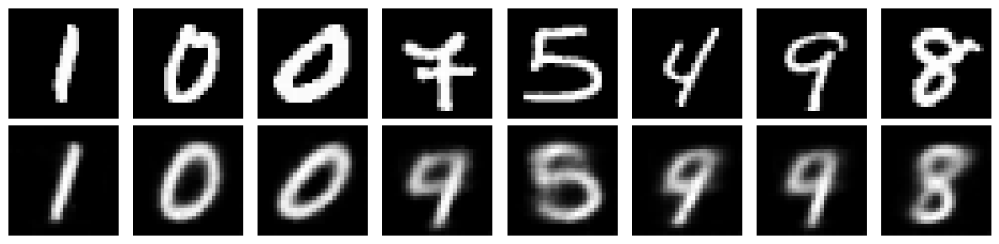


Latent Dimension: 32

Linear VAE Architecture:


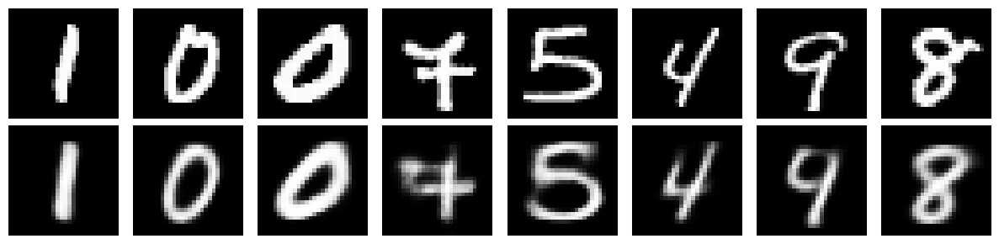


Conv VAE Architecture:


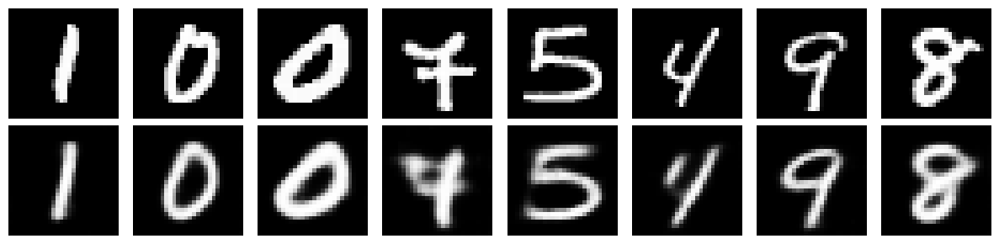

In [51]:
print("\nReconstructions: MNIST DIGITS")
print("-"*70)

visualize_reconstruction_comparison(
    results_dict={
        'Linear VAE': linear_vae_digits,
        'Conv VAE': conv_vae_digits
    },
    latent_dims=[2, 32],
    loader=val_digits,
    device=device,
    n_samples=8)


Reconstructions: FASHION-MNIS
----------------------------------------------------------------------

Reconstruction Quality Comparison
----------------------------------------------------------------------

Latent Dimension: 2

Linear VAE Architecture:


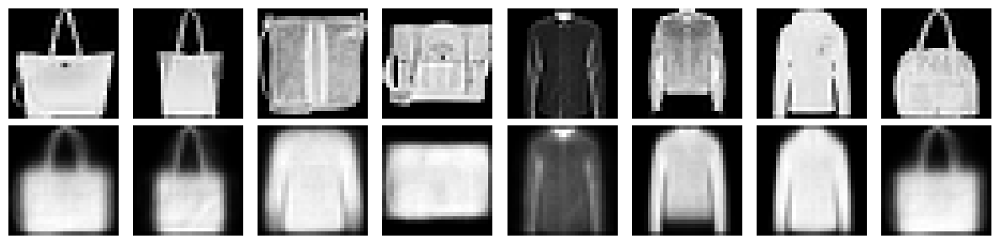


Conv VAE Architecture:


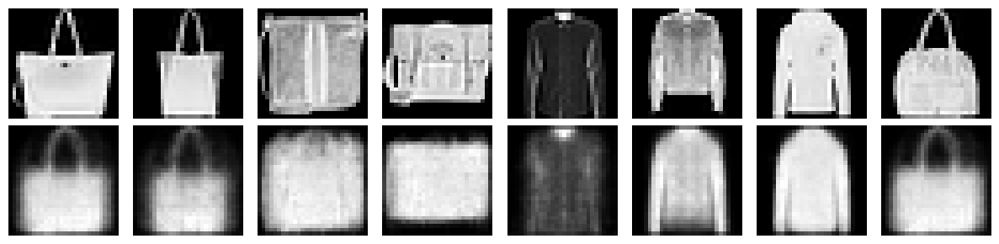


Latent Dimension: 32

Linear VAE Architecture:


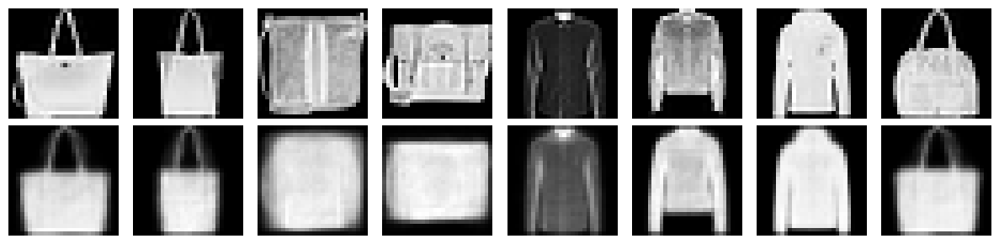


Conv VAE Architecture:


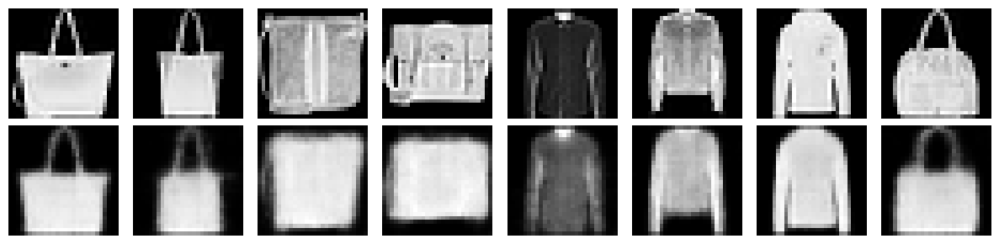

In [52]:
print("\nReconstructions: FASHION-MNIS")
print("-"*70)

visualize_reconstruction_comparison(
    results_dict={
        'Linear VAE': linear_vae_fashion,
        'Conv VAE': conv_vae_fashion
    },
    latent_dims=[2, 32],
    loader=val_fashion,
    device=device,
    n_samples=8)

Generative Quality: Sampling From Prior
----------------------------------------------------------------------

MNIST Digits – Generated Samples (latent_dim=2):


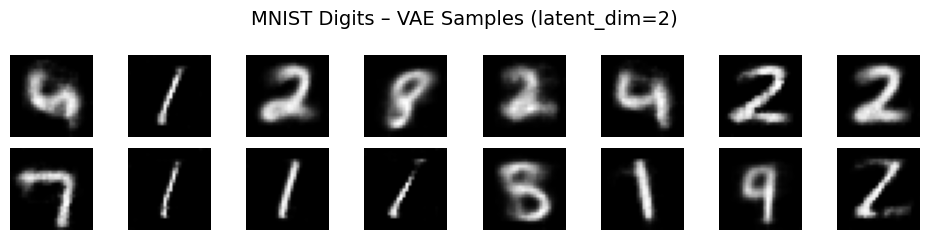


Fashion-MNIST – Generated Samples (latent_dim=2):


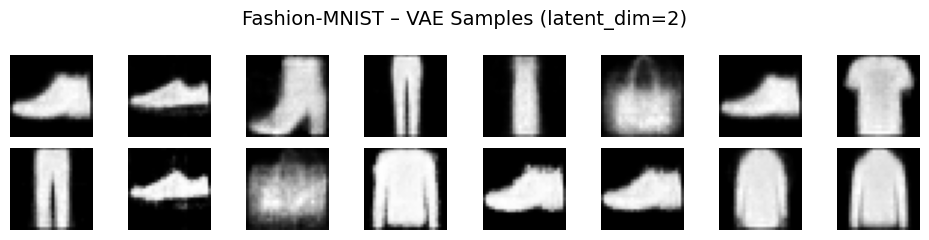


MNIST Digits – Generated Samples (latent_dim=8):


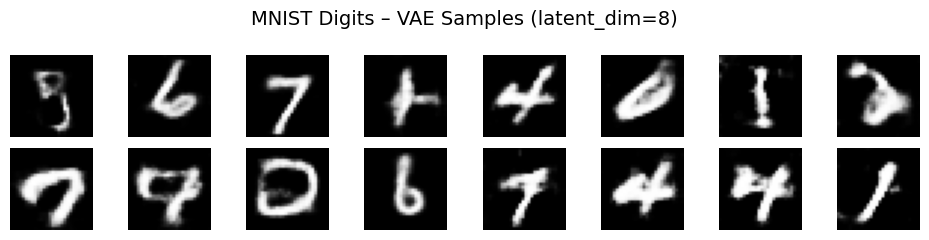


Fashion-MNIST – Generated Samples (latent_dim=8):


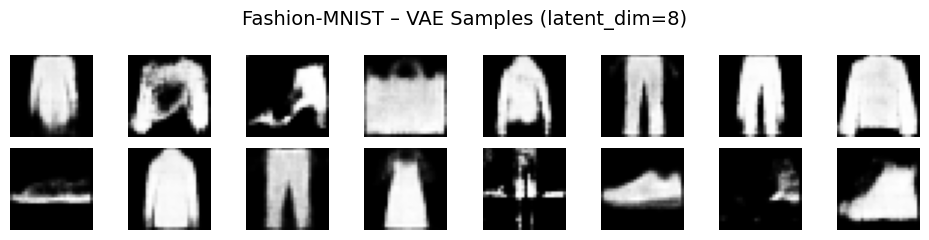


MNIST Digits – Generated Samples (latent_dim=16):


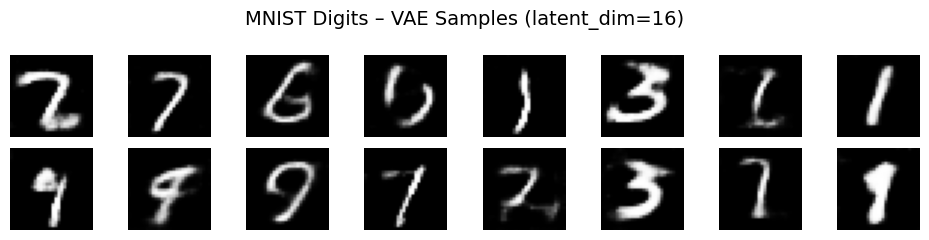


Fashion-MNIST – Generated Samples (latent_dim=16):


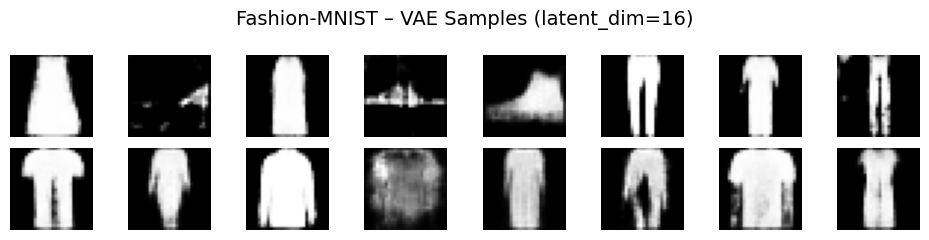


MNIST Digits – Generated Samples (latent_dim=32):


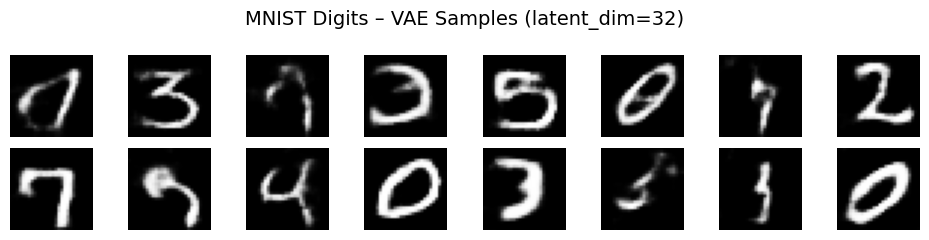


Fashion-MNIST – Generated Samples (latent_dim=32):


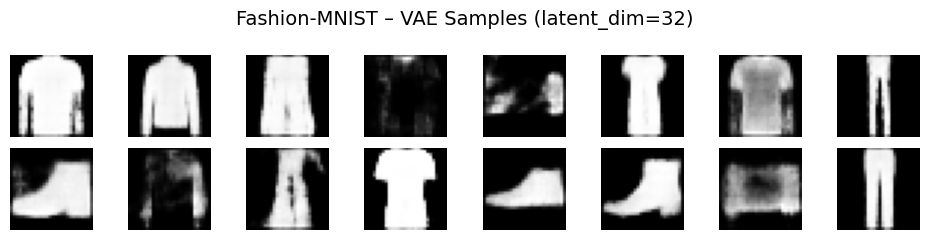

In [55]:
print("Generative Quality: Sampling From Prior")
print("-"*70)

for ld in latent_dims:
  print(f"\nMNIST Digits – Generated Samples (latent_dim={ld}):")
  visualize_vae_samples(
      conv_vae_digits[ld]["model"],
      device,
      n_samples=16,
      latent_range=2.0,
      title=f"MNIST Digits – VAE Samples (latent_dim={ld})")

  print(f"\nFashion-MNIST – Generated Samples (latent_dim={ld}):")
  visualize_vae_samples(
      conv_vae_fashion[ld]["model"],
      device,
      n_samples=16,
      latent_range=2.0,
      title=f"Fashion-MNIST – VAE Samples (latent_dim={ld})")

Reconstraction vs Generation Comparison
----------------------------------------------------------------------

MNIST Digits Linear VAE (latent_dim=2):


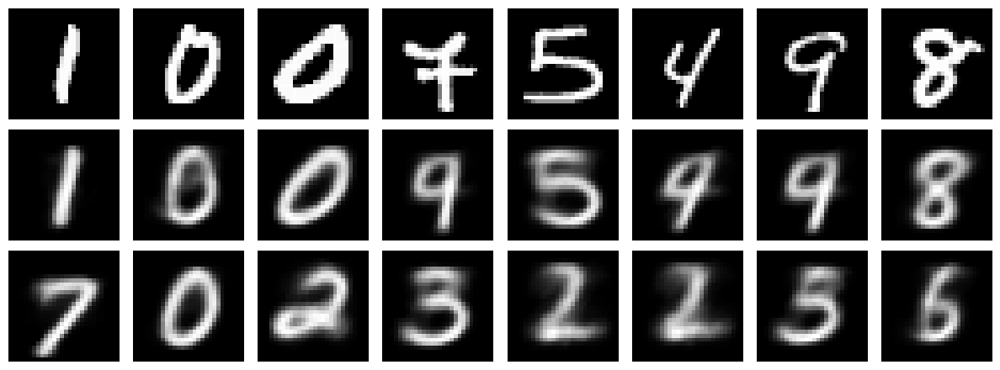


Fashion-MNIST Linear VAE (latent_dim=2):


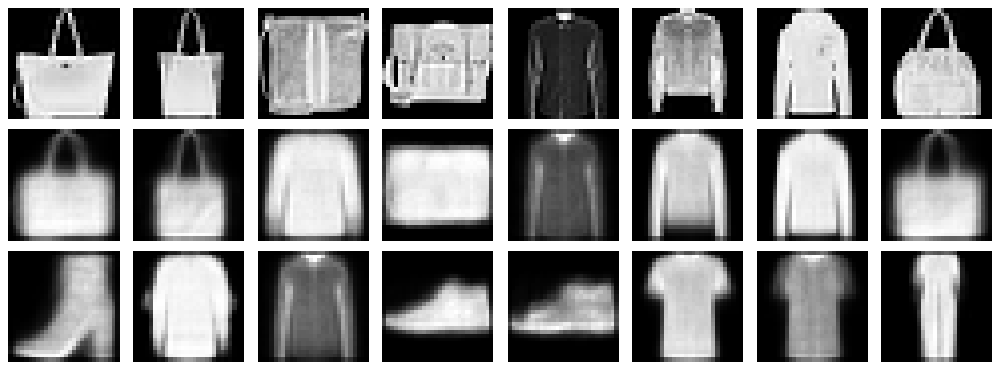


MNIST Digits Conv VAE (latent_dim=2):


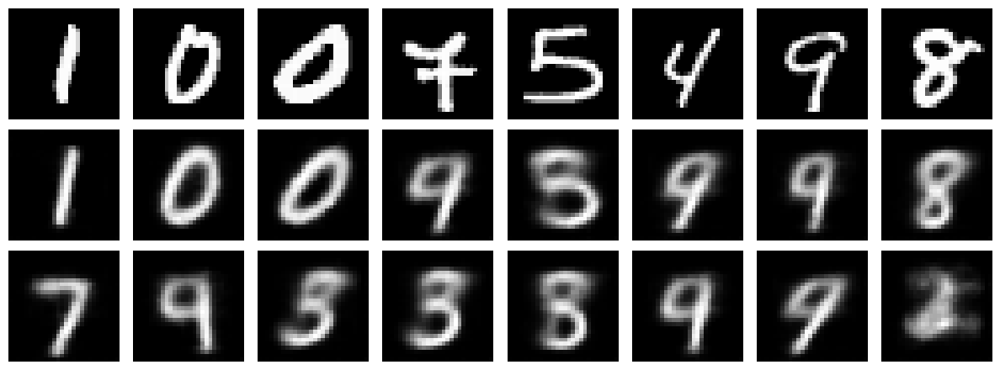


Fashion-MNIST Conv VAE(latent_dim=2):


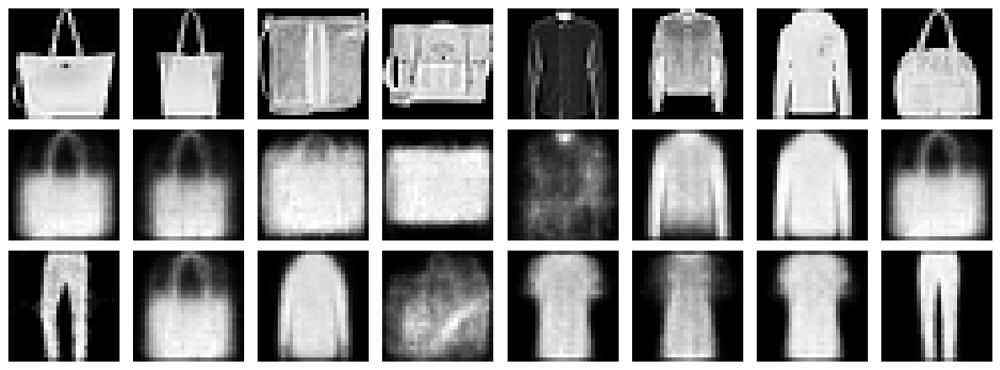


MNIST Digits Linear VAE (latent_dim=8):


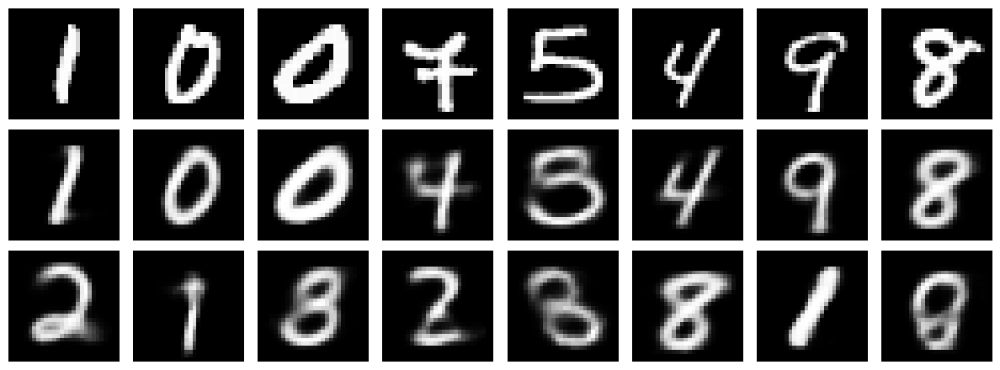


Fashion-MNIST Linear VAE (latent_dim=8):


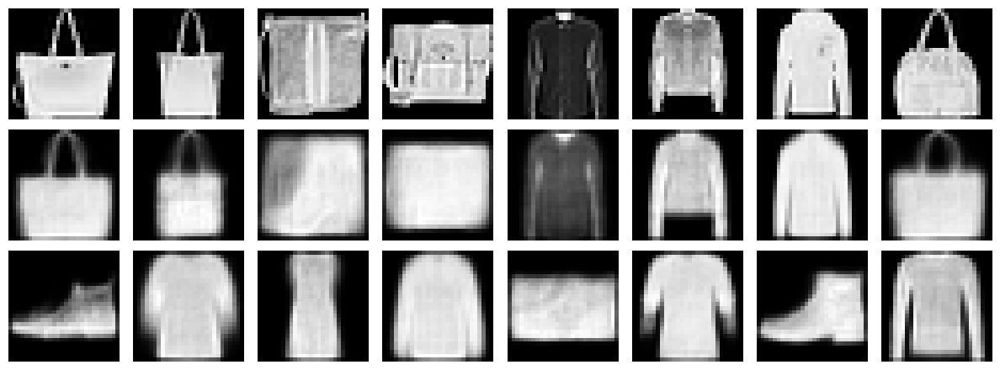


MNIST Digits Conv VAE (latent_dim=8):


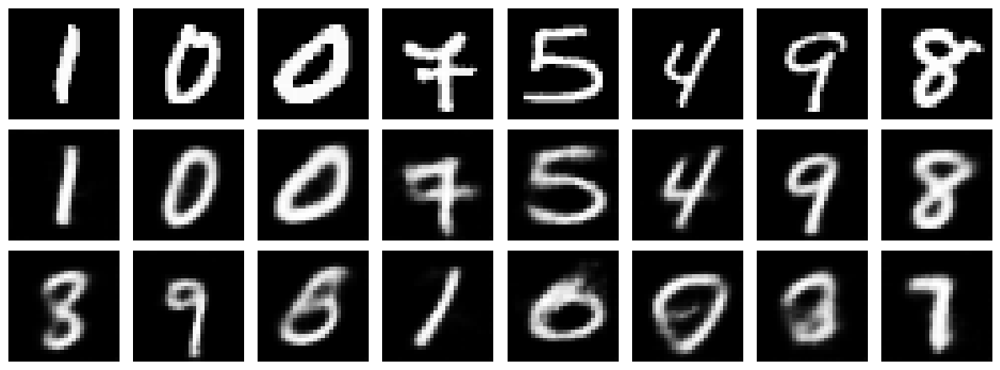


Fashion-MNIST Conv VAE(latent_dim=8):


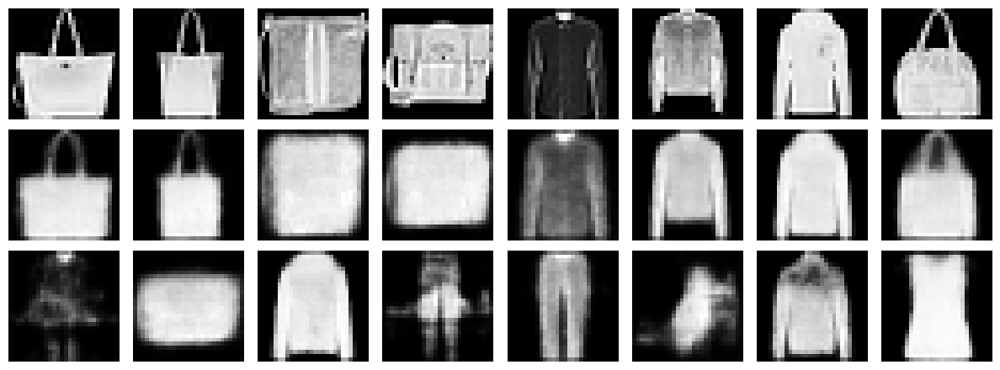


MNIST Digits Linear VAE (latent_dim=16):


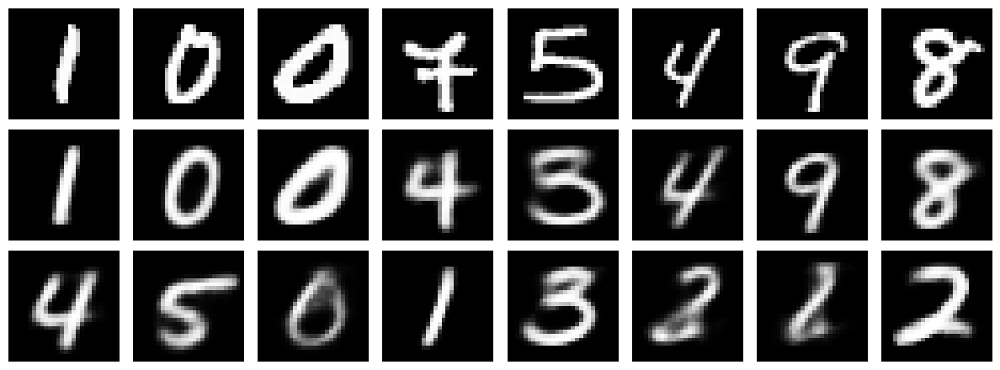


Fashion-MNIST Linear VAE (latent_dim=16):


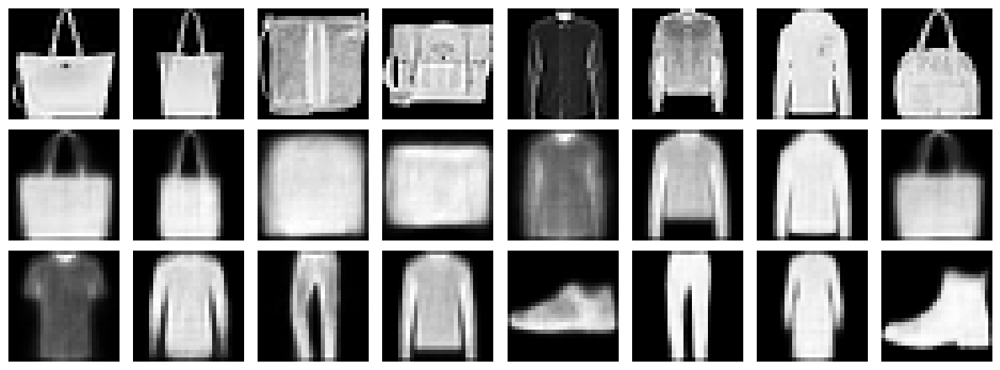


MNIST Digits Conv VAE (latent_dim=16):


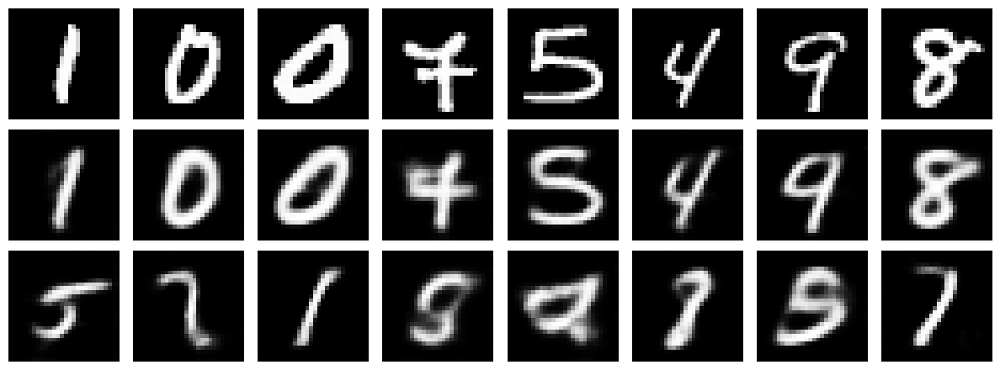


Fashion-MNIST Conv VAE(latent_dim=16):


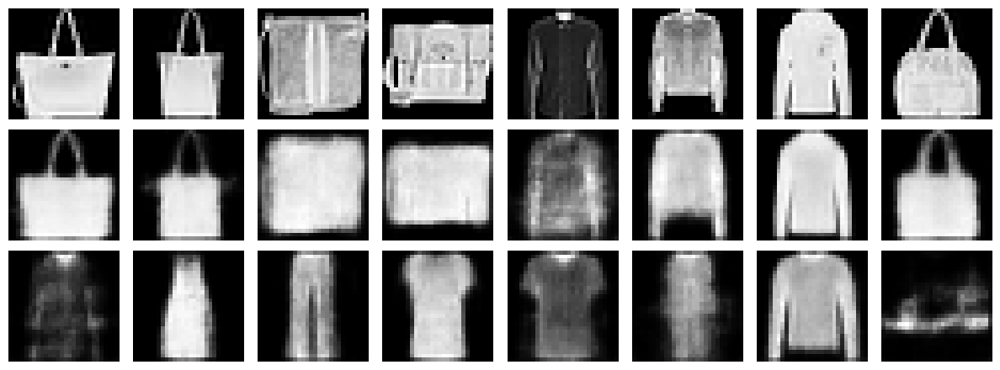


MNIST Digits Linear VAE (latent_dim=32):


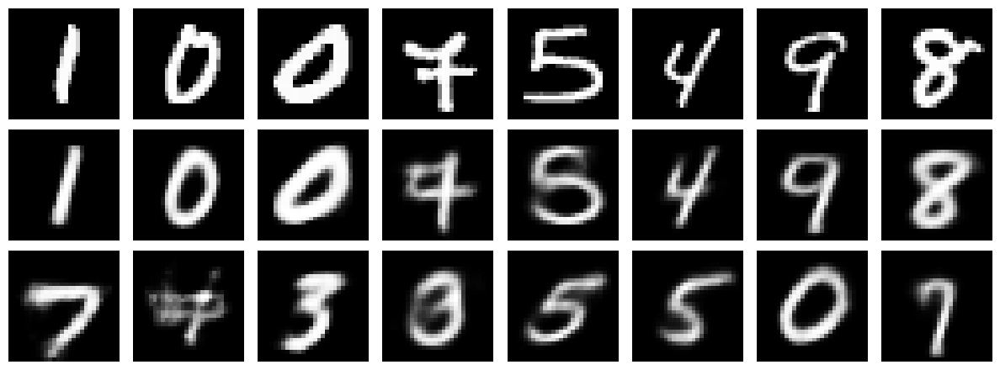


Fashion-MNIST Linear VAE (latent_dim=32):


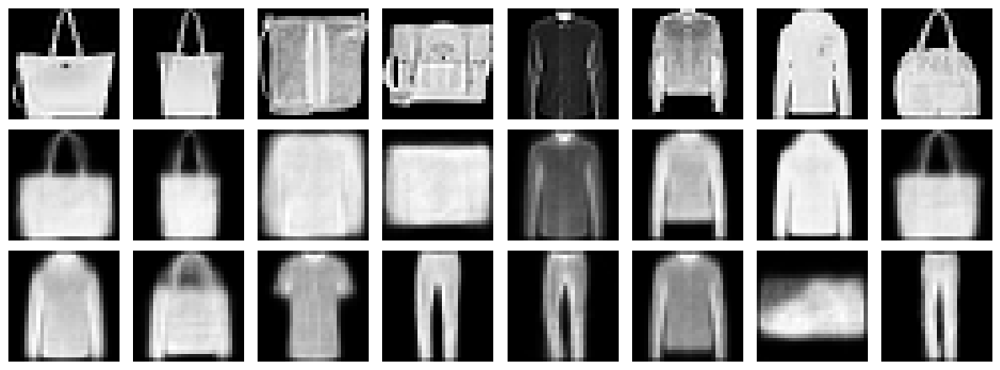


MNIST Digits Conv VAE (latent_dim=32):


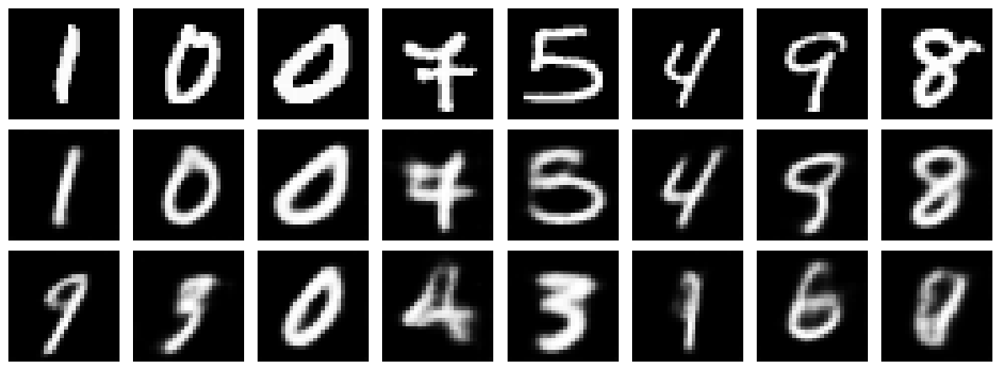


Fashion-MNIST Conv VAE(latent_dim=32):


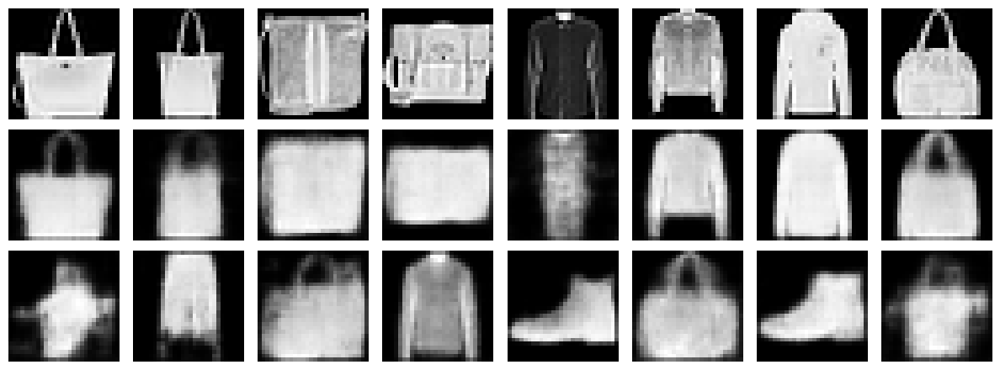

In [67]:
"""
Row 1: Original images (from dataset)
Row 2: Reconstructions (original → encoder → decoder)
Row 3: Generated samples (random z ~ N(0,I) → decoder)
"""

print("Reconstraction vs Generation Comparison")
print("-"*70)

for ld in latent_dims:
  print(f"\nMNIST Digits Linear VAE (latent_dim={ld}):")
  compare_reconstruction_and_samples(
      linear_vae_digits[ld]["model"],
      val_digits,
      device,
      n_recon=8,
      n_samples=8)

  print(f"\nFashion-MNIST Linear VAE (latent_dim={ld}):")
  compare_reconstruction_and_samples(
      linear_vae_fashion[ld]["model"],
      val_fashion,
      device,
      n_recon=8,
      n_samples=8)

  print(f"\nMNIST Digits Conv VAE (latent_dim={ld}):")
  compare_reconstruction_and_samples(
      conv_vae_digits[ld]["model"],
      val_digits,
      device,
      n_recon=8,
      n_samples=8)

  print(f"\nFashion-MNIST Conv VAE(latent_dim={ld}):")
  compare_reconstruction_and_samples(
      conv_vae_fashion[ld]["model"],
      val_fashion,
      device,
      n_recon=8,
      n_samples=8)

2D Latent Space Visualisation
----------------------------------------------------------------------

MNIST Digits – Conv VAE: Latent Space Distribution


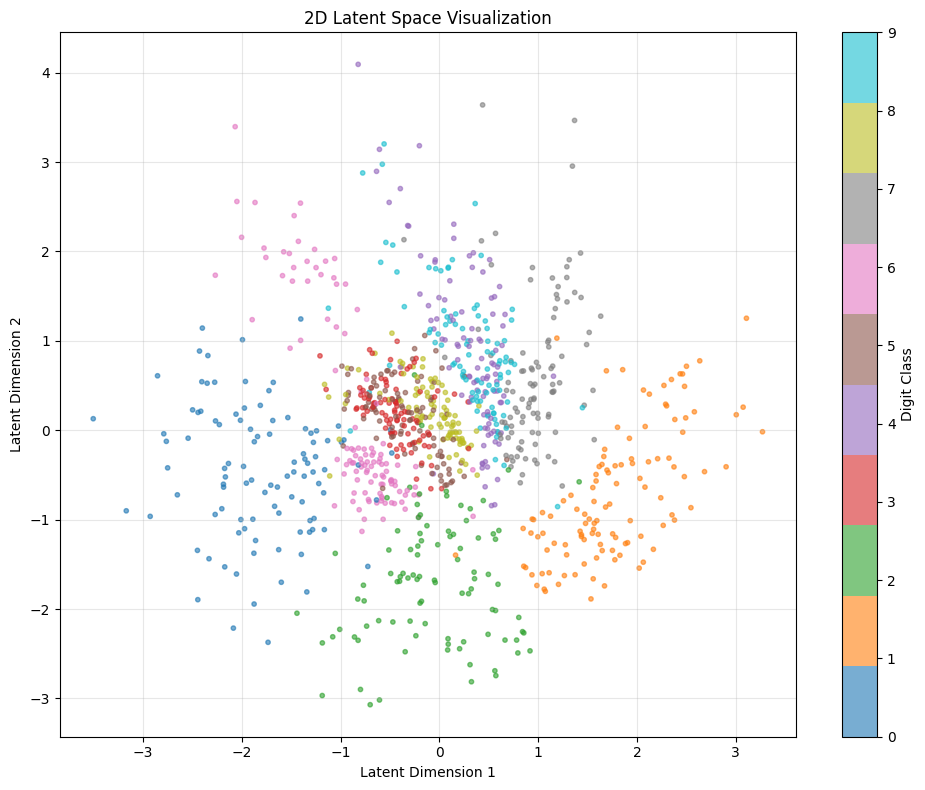


MNIST Digits – Conv VAE: Latent Manifold


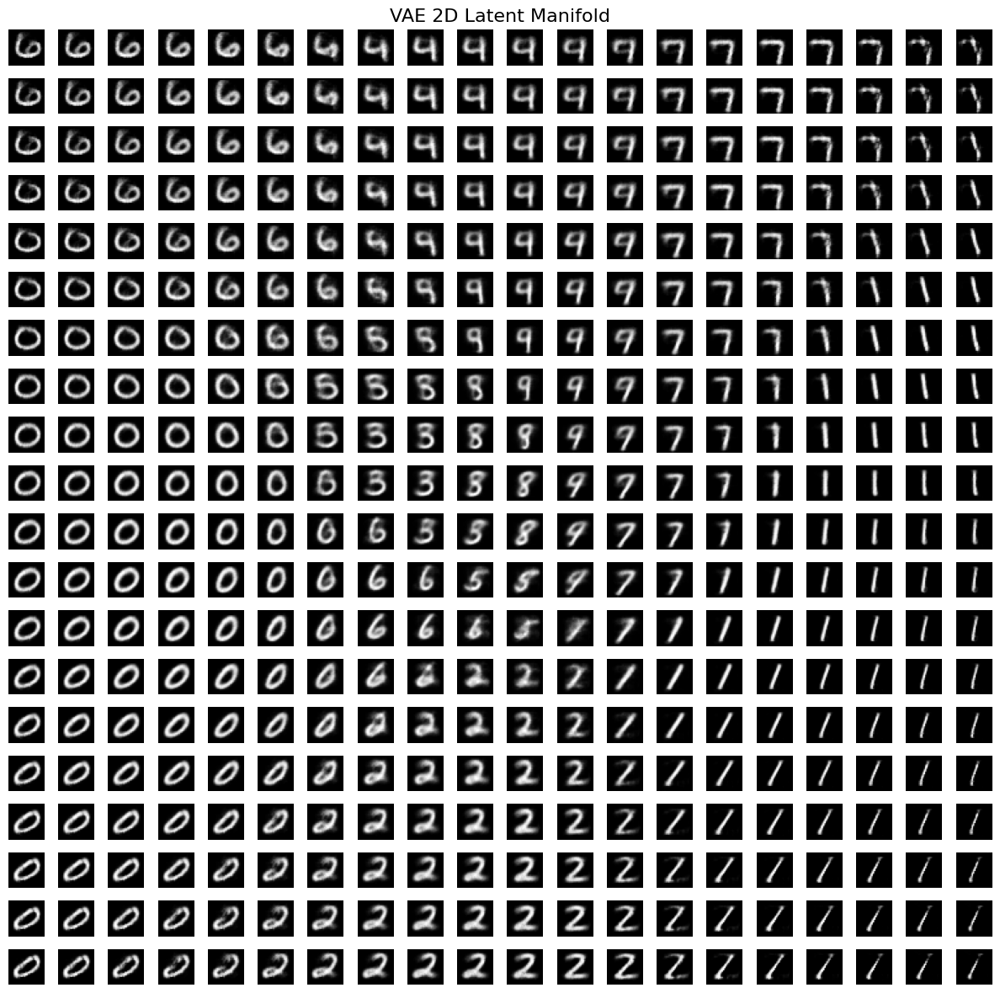


MNIST Digits – Linear VAE: Latent Space Distribution


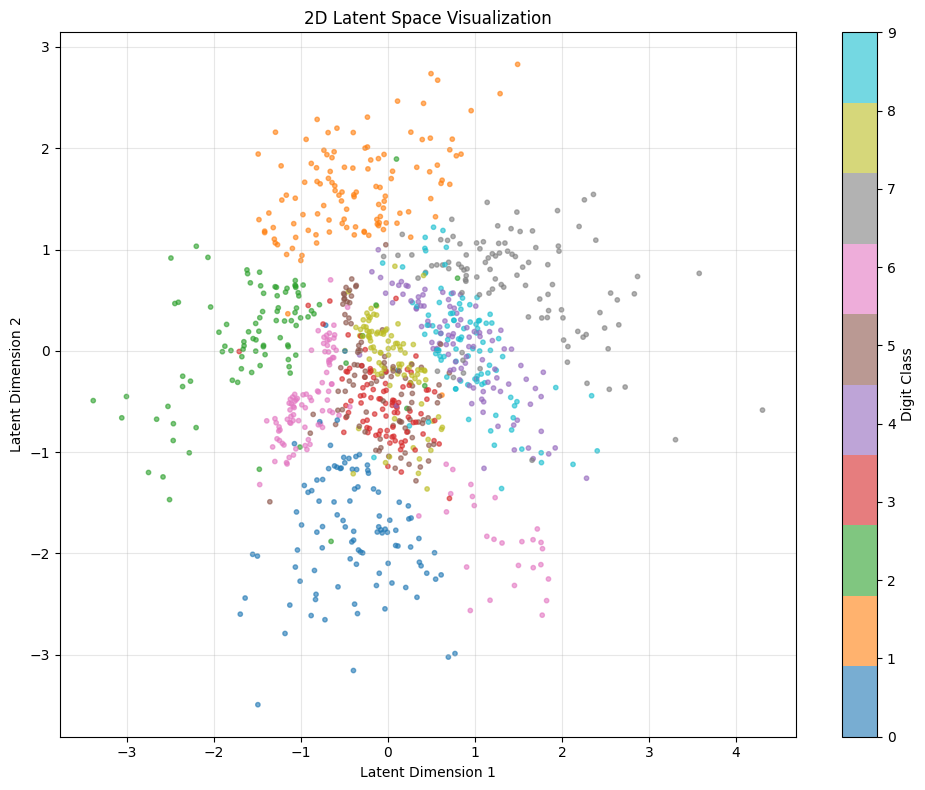


MNIST Digits – Linear VAE: Latent Manifold


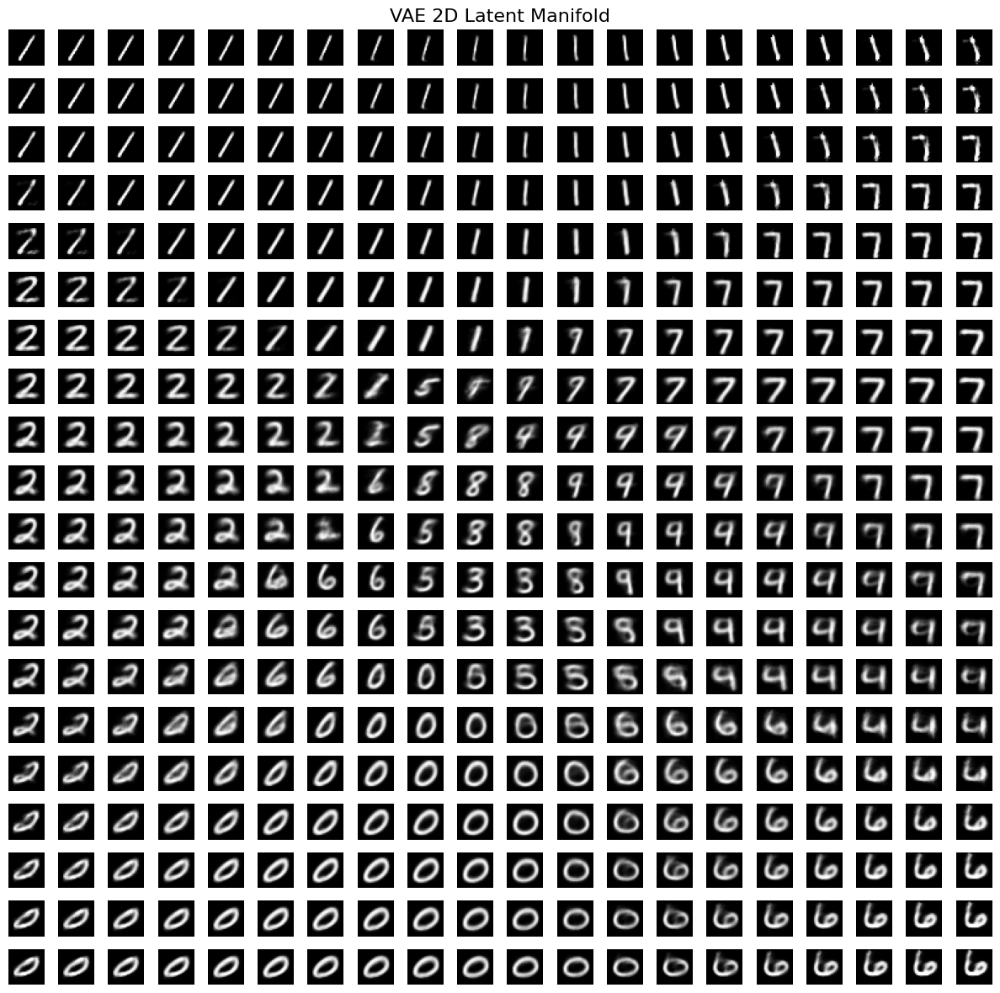


Fashion-MNIST – Conv VAE: Latent Space Distribution


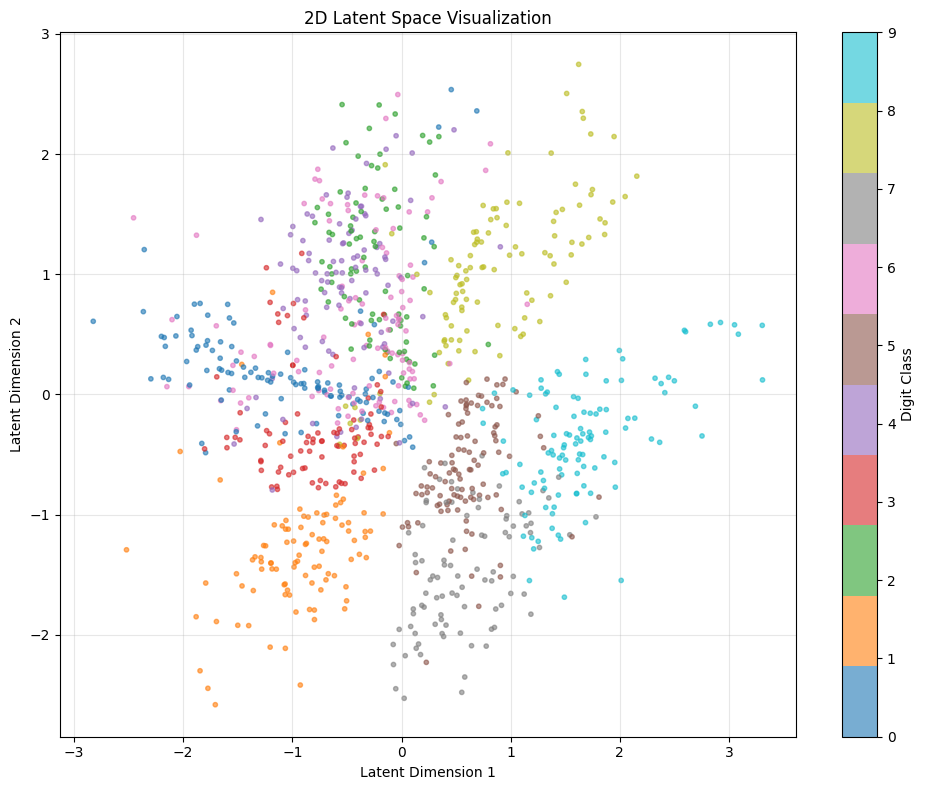


Fashion-MNIST – Conv VAE: Latent Manifold


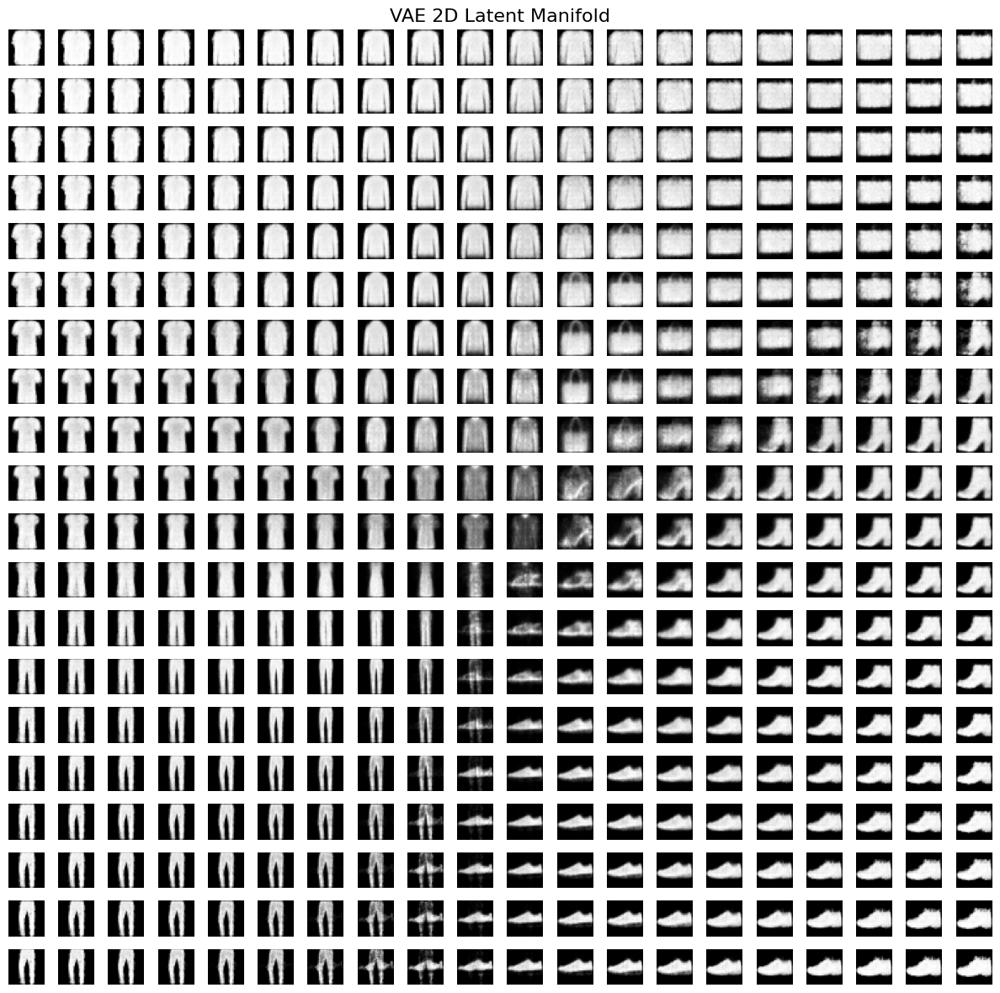


Fashion-MNIST – Linear VAE: Latent Space Distribution


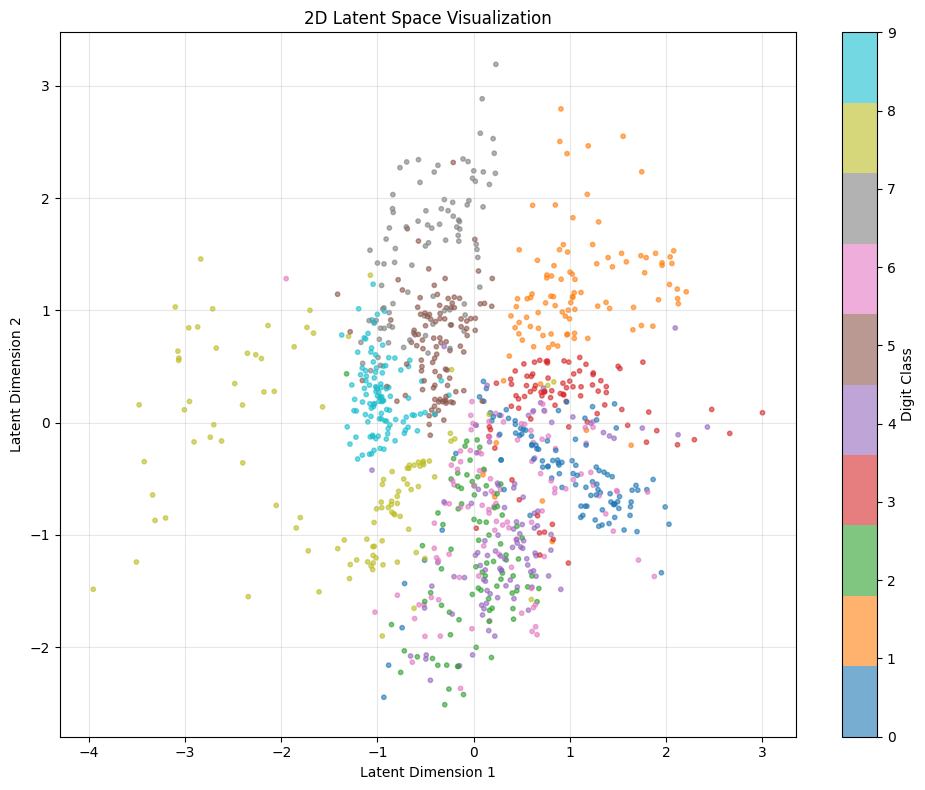


Fashion-MNIST – Linear VAE: Latent Manifold


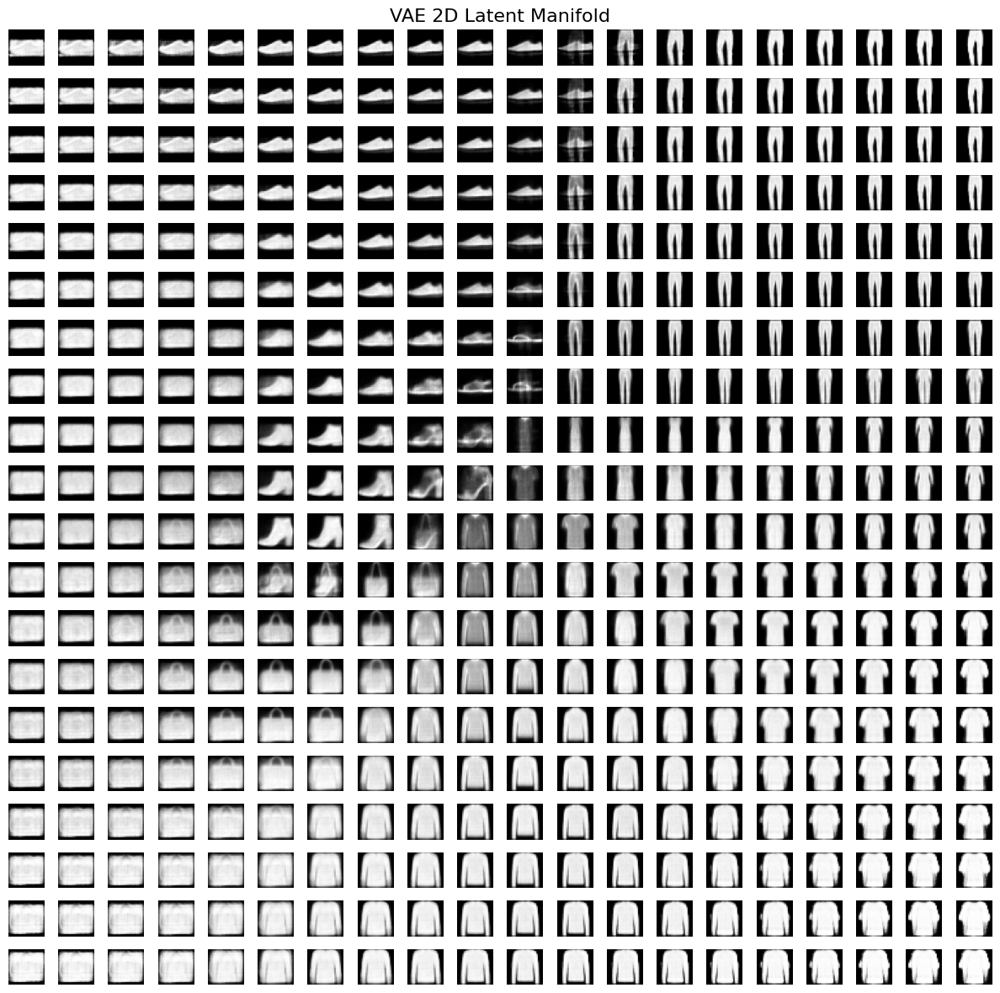

In [70]:
print("2D Latent Space Visualisation")
print("-" * 70)

print("\nMNIST Digits – Conv VAE: Latent Space Distribution")
visualize_latent_space_2d(conv_vae_digits[2]["model"], val_digits, device, n_samples=1000)

print("\nMNIST Digits – Conv VAE: Latent Manifold")
visualize_latent_manifold_2d(conv_vae_digits[2]["model"], device, n_samples=20, range_limit=3.0)

print("\nMNIST Digits – Linear VAE: Latent Space Distribution")
visualize_latent_space_2d(linear_vae_digits[2]["model"], val_digits, device, n_samples=1000)

print("\nMNIST Digits – Linear VAE: Latent Manifold")
visualize_latent_manifold_2d(linear_vae_digits[2]["model"], device, n_samples=20, range_limit=3.0)

print("\nFashion-MNIST – Conv VAE: Latent Space Distribution")
visualize_latent_space_2d(conv_vae_fashion[2]["model"], val_fashion, device, n_samples=1000)

print("\nFashion-MNIST – Conv VAE: Latent Manifold")
visualize_latent_manifold_2d(conv_vae_fashion[2]["model"], device, n_samples=20, range_limit=3.0)

print("\nFashion-MNIST – Linear VAE: Latent Space Distribution")
visualize_latent_space_2d(linear_vae_fashion[2]["model"], val_fashion, device, n_samples=1000)

print("\nFashion-MNIST – Linear VAE: Latent Manifold")
visualize_latent_manifold_2d(linear_vae_fashion[2]["model"], device, n_samples=20, range_limit=3.0)

Latent Space Interpolation
----------------------------------------------------------------------

MNIST Digits – Conv VAE (latent_dim=2):


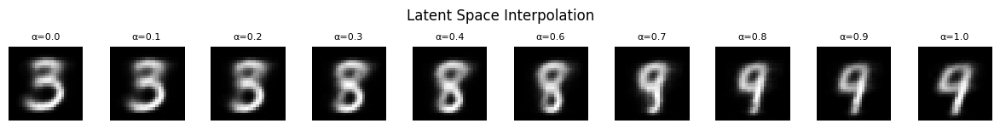

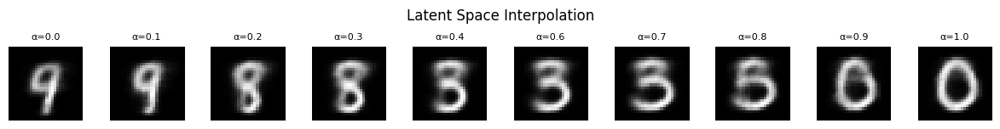


MNIST Digits – Linear VAE (latent_dim=2):


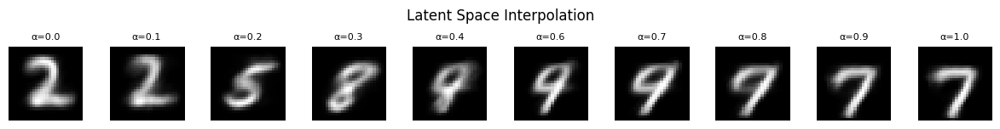

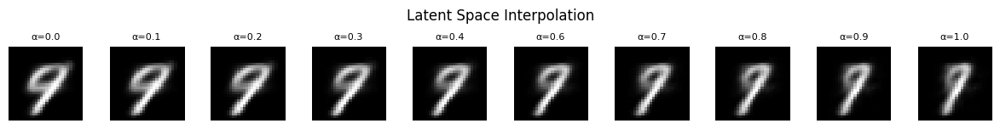


Fashion-MNIST – Conv VAE (latent_dim=2):


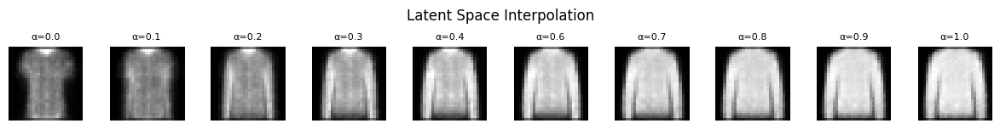

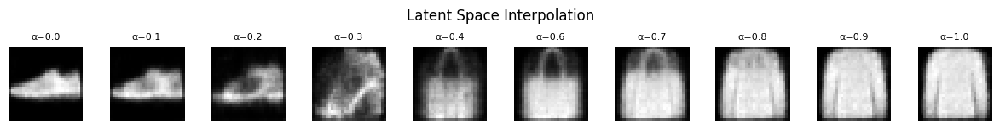


Fashion-MNIST – Linear VAE (latent_dim=2):


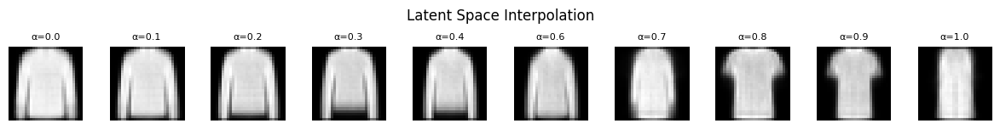

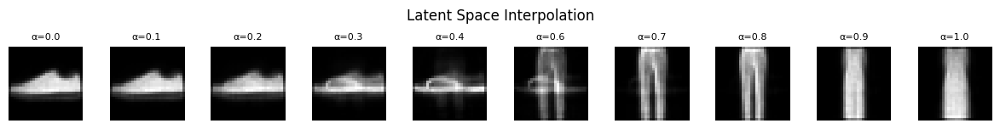


MNIST Digits – Conv VAE (latent_dim=8):


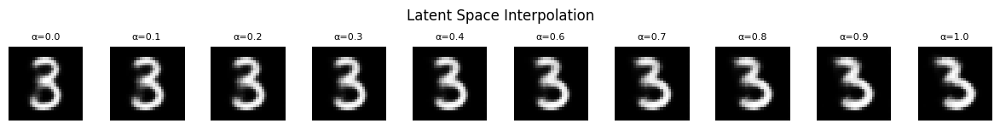

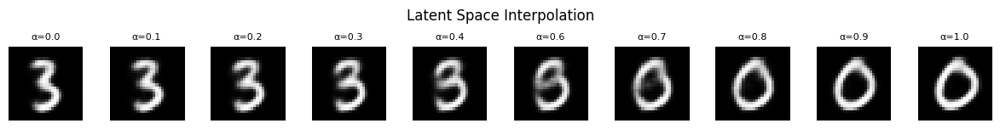


MNIST Digits – Linear VAE (latent_dim=8):


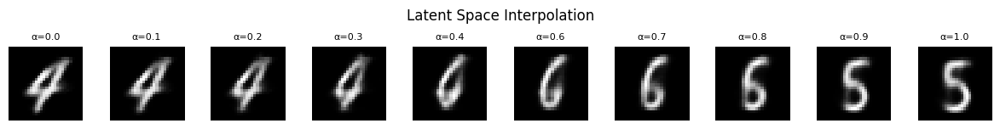

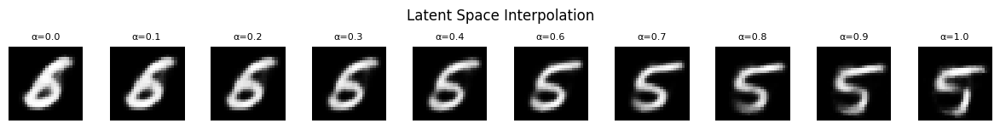


Fashion-MNIST – Conv VAE (latent_dim=8):


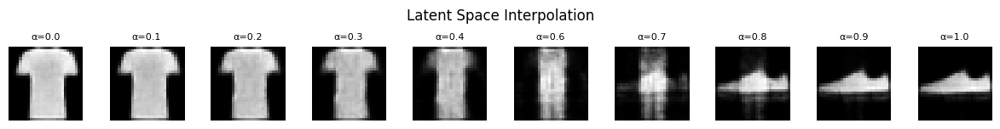

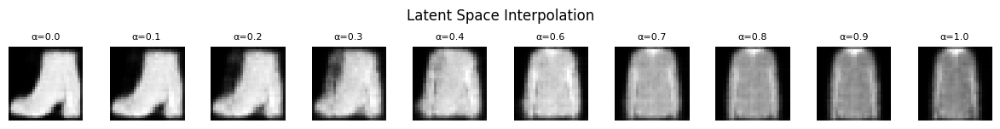


Fashion-MNIST – Linear VAE (latent_dim=8):


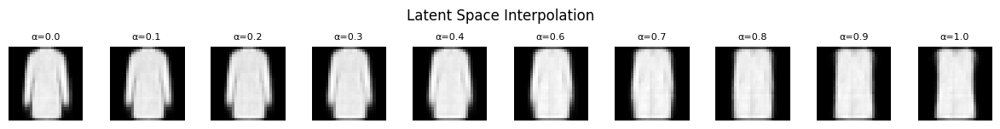

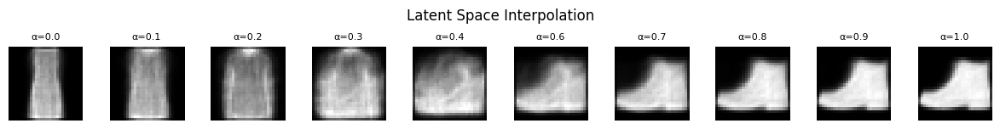


MNIST Digits – Conv VAE (latent_dim=16):


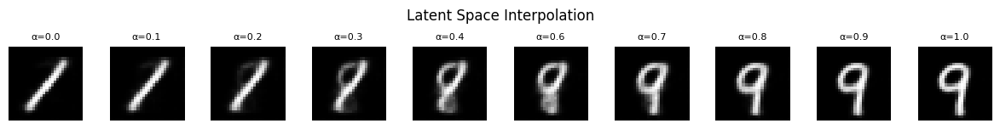

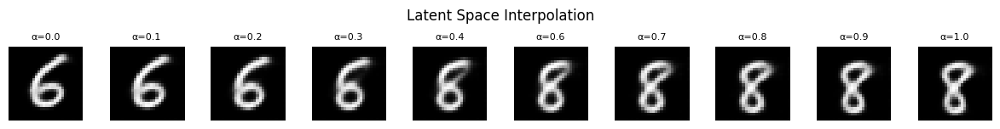


MNIST Digits – Linear VAE (latent_dim=16):


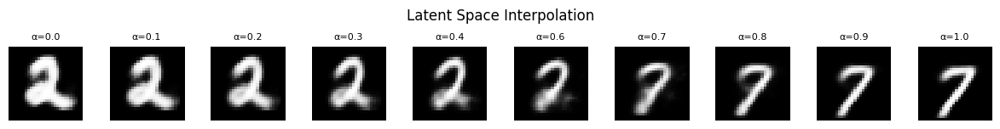

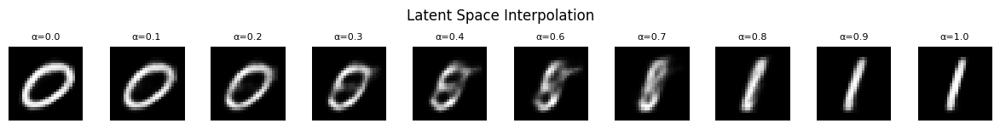


Fashion-MNIST – Conv VAE (latent_dim=16):


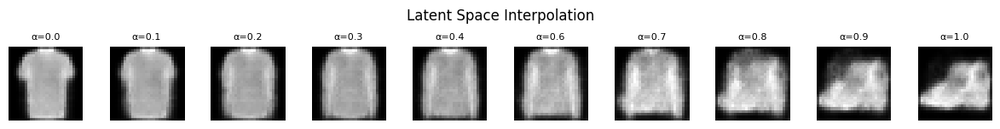

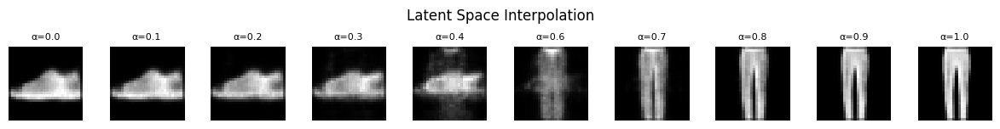


Fashion-MNIST – Linear VAE (latent_dim=16):


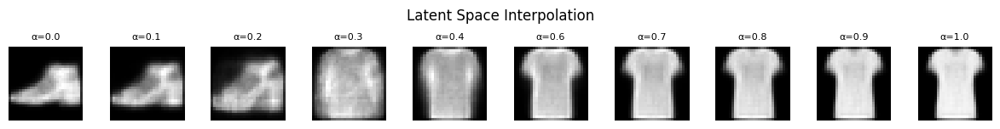

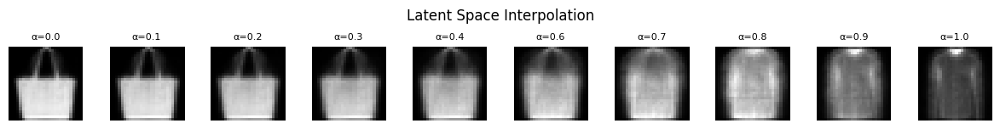


MNIST Digits – Conv VAE (latent_dim=32):


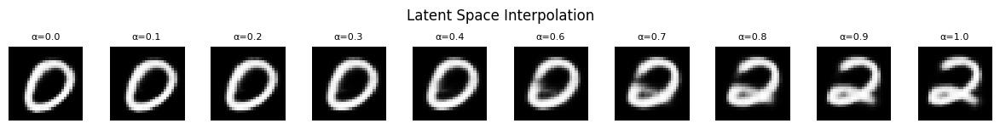

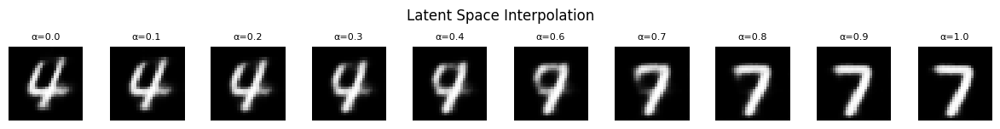


MNIST Digits – Linear VAE (latent_dim=32):


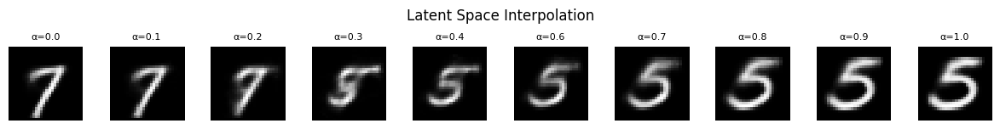

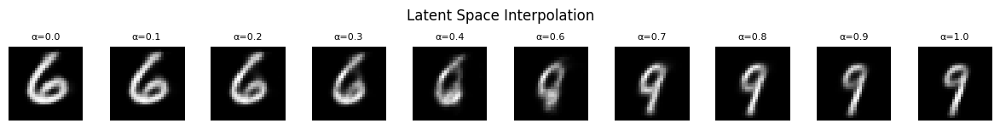


Fashion-MNIST – Conv VAE (latent_dim=32):


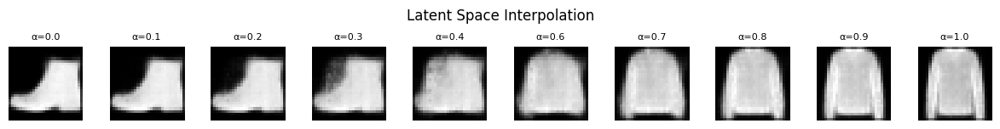

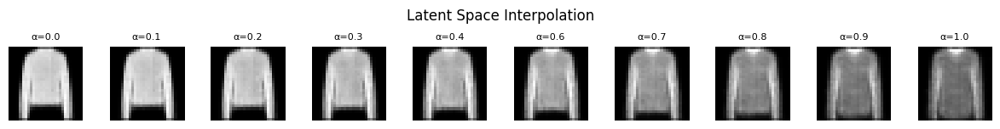


Fashion-MNIST – Linear VAE (latent_dim=32):


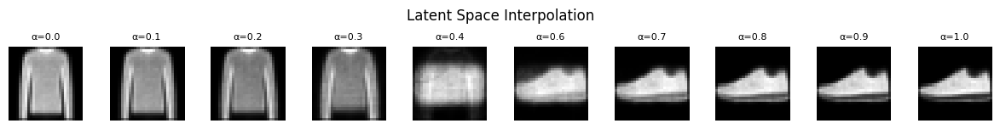

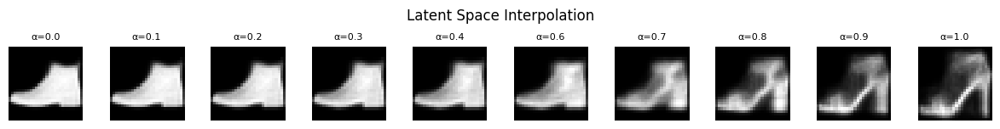

In [71]:
print("Latent Space Interpolation")
print("-"*70)

for ld in latent_dims:
  print(f"\nMNIST Digits – Conv VAE (latent_dim={ld}):")
  interpolate_between_images(conv_vae_digits[ld]["model"], val_digits, device, n_steps=10)
  interpolate_between_images(conv_vae_digits[ld]["model"], val_digits, device, n_steps=10)

  print(f"\nMNIST Digits – Linear VAE (latent_dim={ld}):")
  interpolate_between_images(linear_vae_digits[ld]["model"], val_digits, device, n_steps=10)
  interpolate_between_images(linear_vae_digits[ld]["model"], val_digits, device, n_steps=10)

  print(f"\nFashion-MNIST – Conv VAE (latent_dim={ld}):")
  interpolate_between_images(conv_vae_fashion[ld]["model"], val_fashion, device, n_steps=10)
  interpolate_between_images(conv_vae_fashion[ld]["model"], val_fashion, device, n_steps=10)

  print(f"\nFashion-MNIST – Linear VAE (latent_dim={ld}):")
  interpolate_between_images(linear_vae_fashion[ld]["model"], val_fashion, device, n_steps=10)
  interpolate_between_images(linear_vae_fashion[ld]["model"], val_fashion, device, n_steps=10)

Latent Distribution Analysis
----------------------------------------------------------------------

MNIST Digits – Latent Distributions (latent_dim=2):


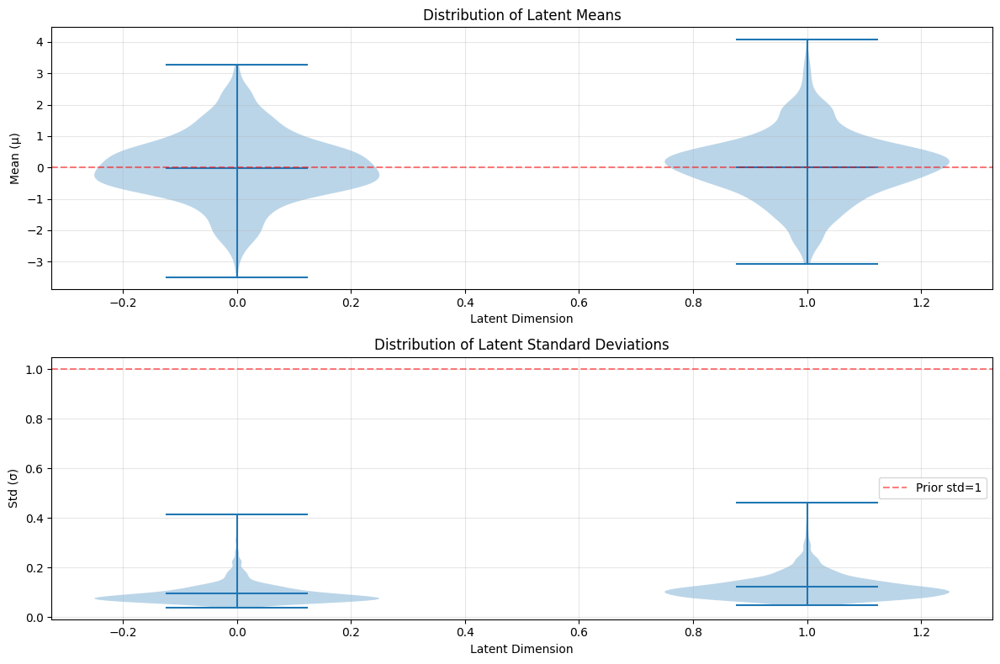


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=2)
----------------------------------------------------------------------
Active units (var > 0.01): 2/2
Total KL divergence: 4.7063
Average KL per dimension: 2.3532
Max KL dimension: 2.4714
Min KL dimension: 2.2349


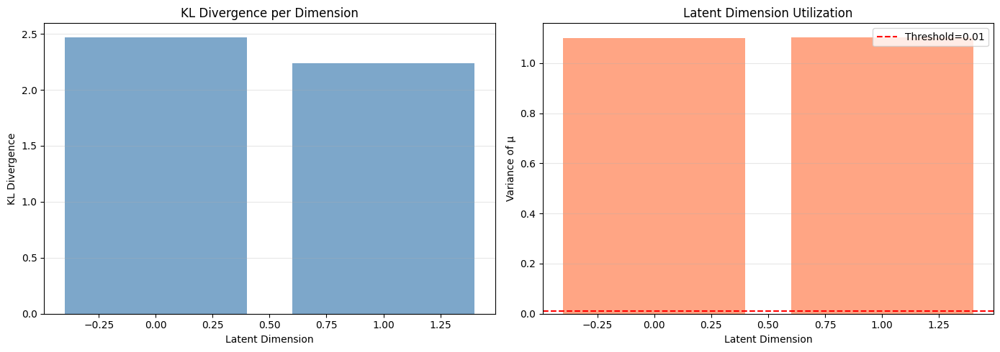


Fashion-MNIST – Latent Distributions (latent_dim=2):


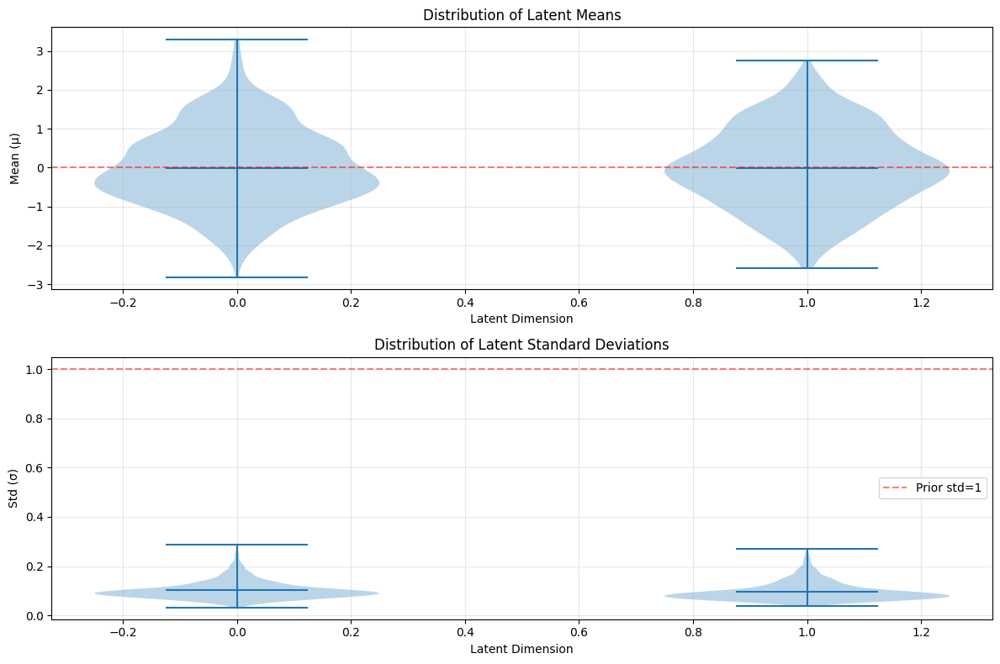


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=2)
----------------------------------------------------------------------
Active units (var > 0.01): 2/2
Total KL divergence: 4.8026
Average KL per dimension: 2.4013
Max KL dimension: 2.4408
Min KL dimension: 2.3618


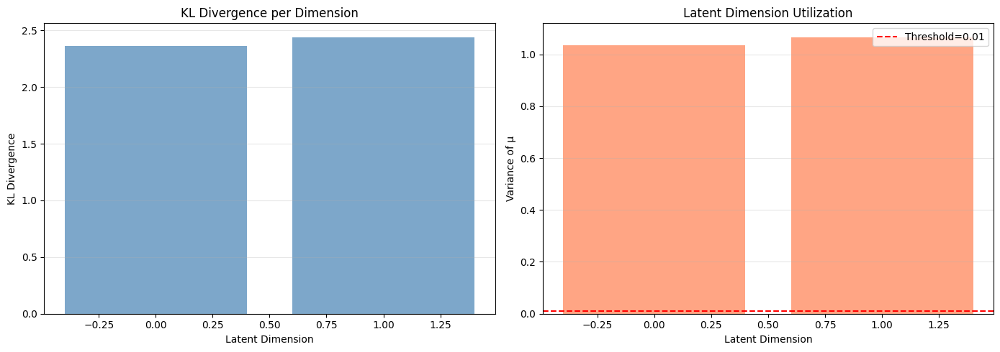


MNIST Digits – Latent Distributions (latent_dim=8):


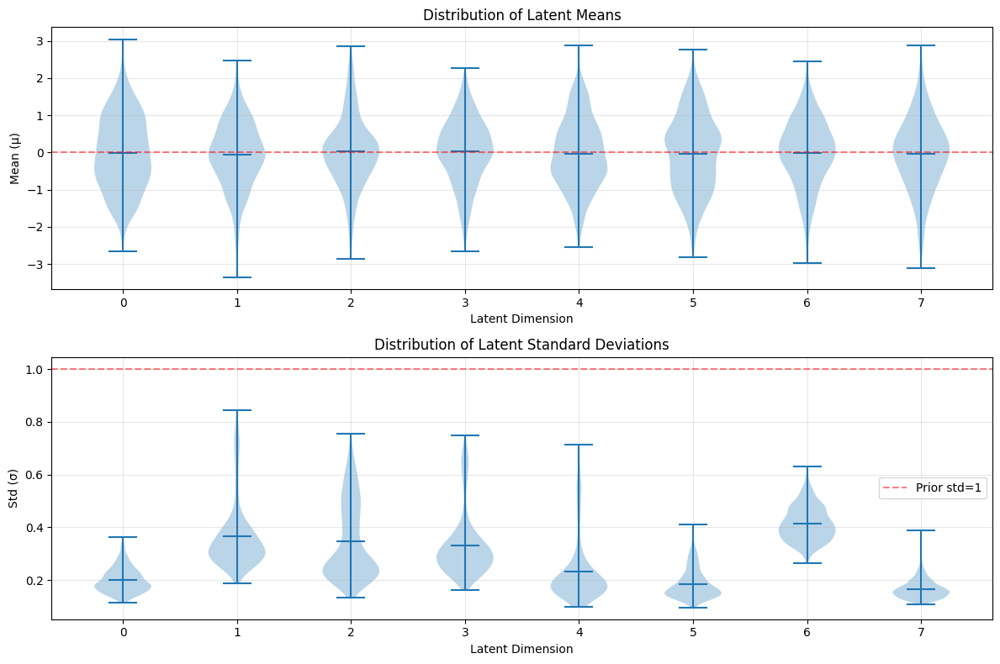


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=8)
----------------------------------------------------------------------
Active units (var > 0.01): 8/8
Total KL divergence: 10.9339
Average KL per dimension: 1.3667
Max KL dimension: 1.7936
Min KL dimension: 0.8875


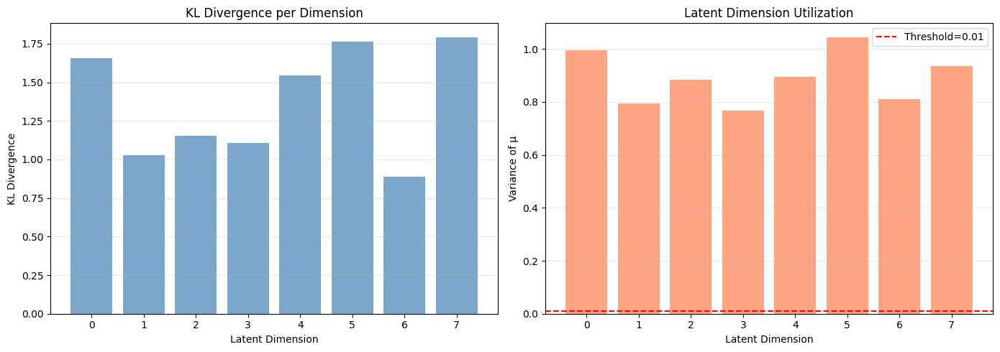


Fashion-MNIST – Latent Distributions (latent_dim=8):


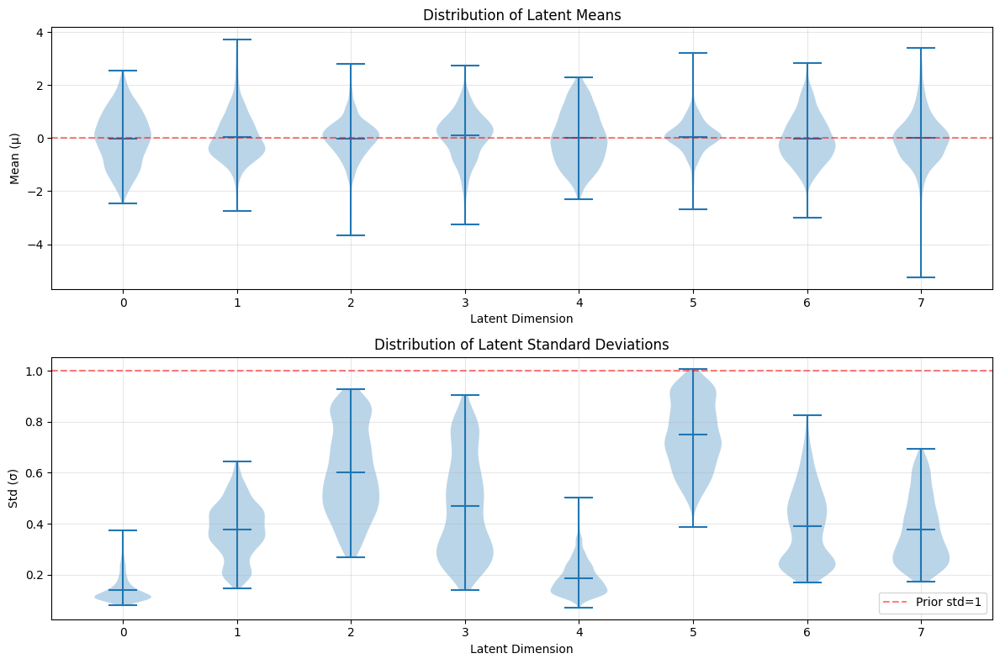


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=8)
----------------------------------------------------------------------
Active units (var > 0.01): 8/8
Total KL divergence: 8.5295
Average KL per dimension: 1.0662
Max KL dimension: 2.0325
Min KL dimension: 0.2920


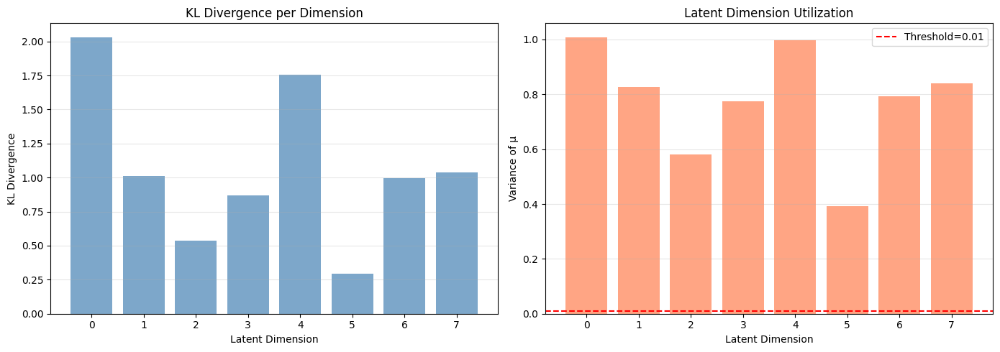


MNIST Digits – Latent Distributions (latent_dim=16):


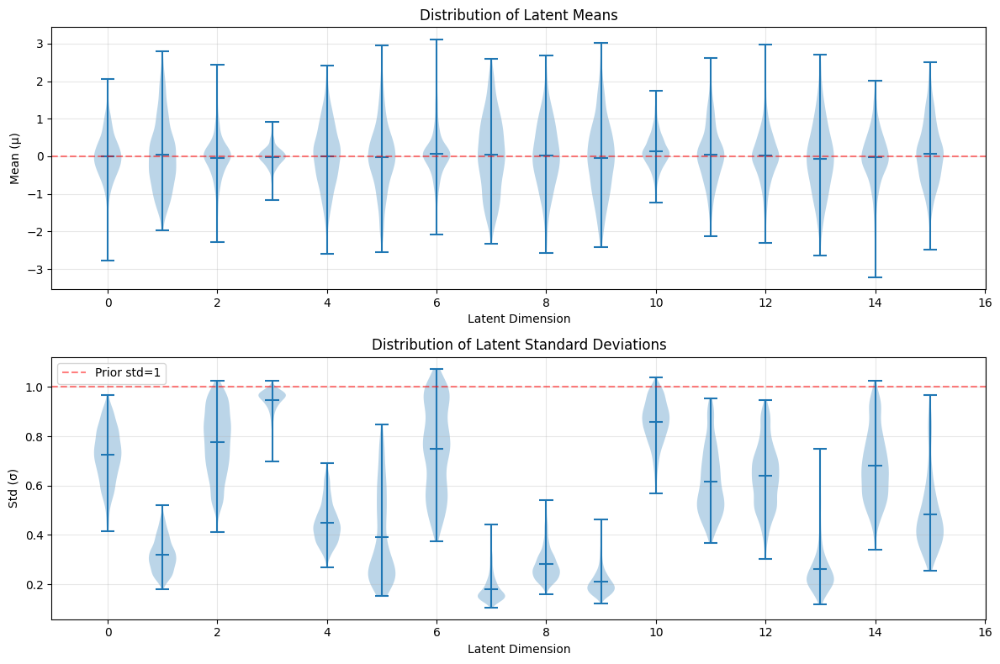


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=16)
----------------------------------------------------------------------
Active units (var > 0.01): 16/16
Total KL divergence: 12.1382
Average KL per dimension: 0.7586
Max KL dimension: 1.7721
Min KL dimension: 0.0417


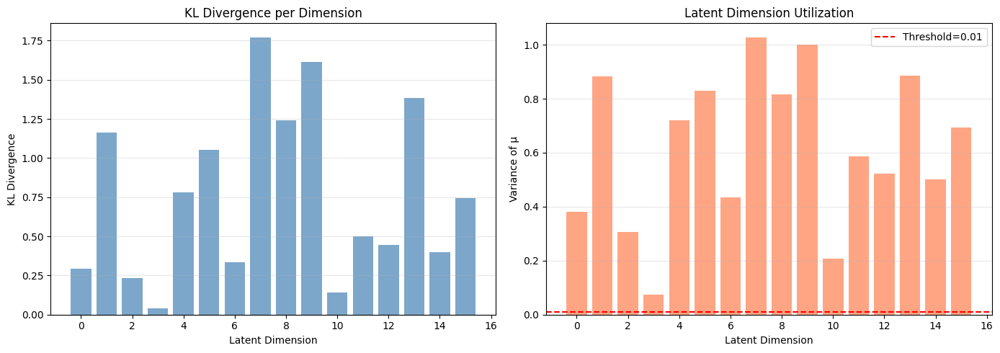


Fashion-MNIST – Latent Distributions (latent_dim=16):


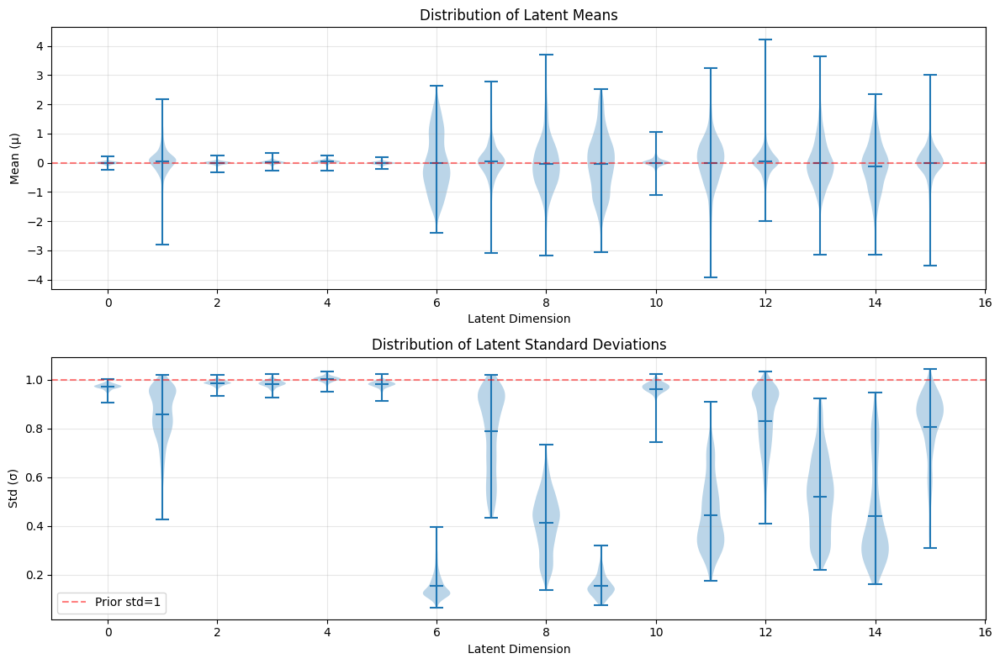


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=16)
----------------------------------------------------------------------
Active units (var > 0.01): 11/16
Total KL divergence: 8.1824
Average KL per dimension: 0.5114
Max KL dimension: 1.9420
Min KL dimension: 0.0019


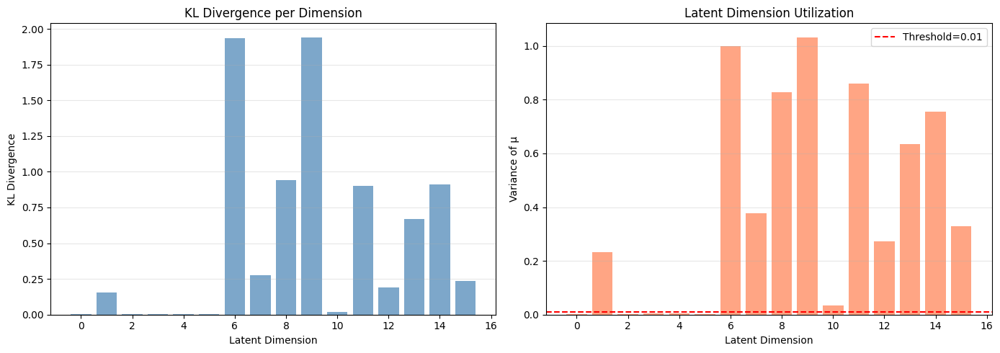


MNIST Digits – Latent Distributions (latent_dim=32):


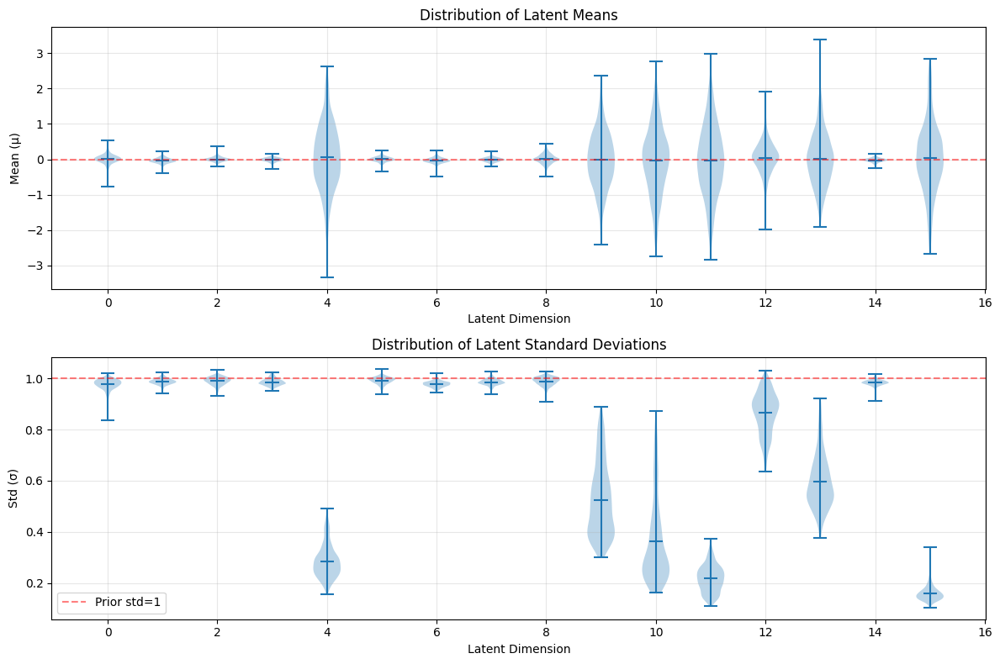


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=32)
----------------------------------------------------------------------
Active units (var > 0.01): 18/32
Total KL divergence: 12.3587
Average KL per dimension: 0.3862
Max KL dimension: 1.8549
Min KL dimension: 0.0017


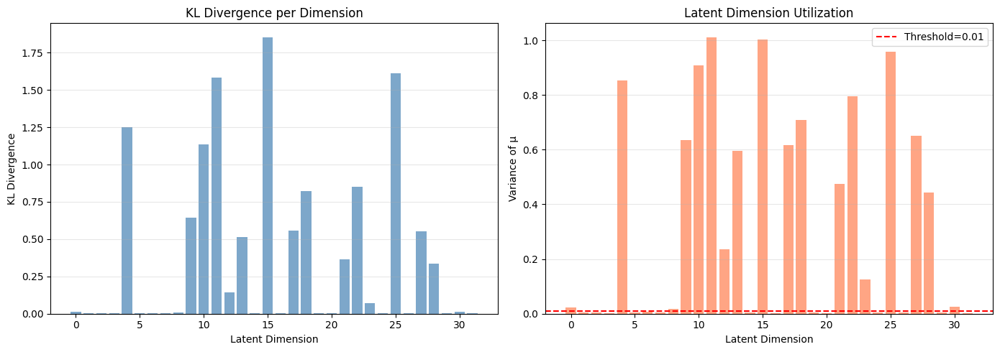


Fashion-MNIST – Latent Distributions (latent_dim=32):


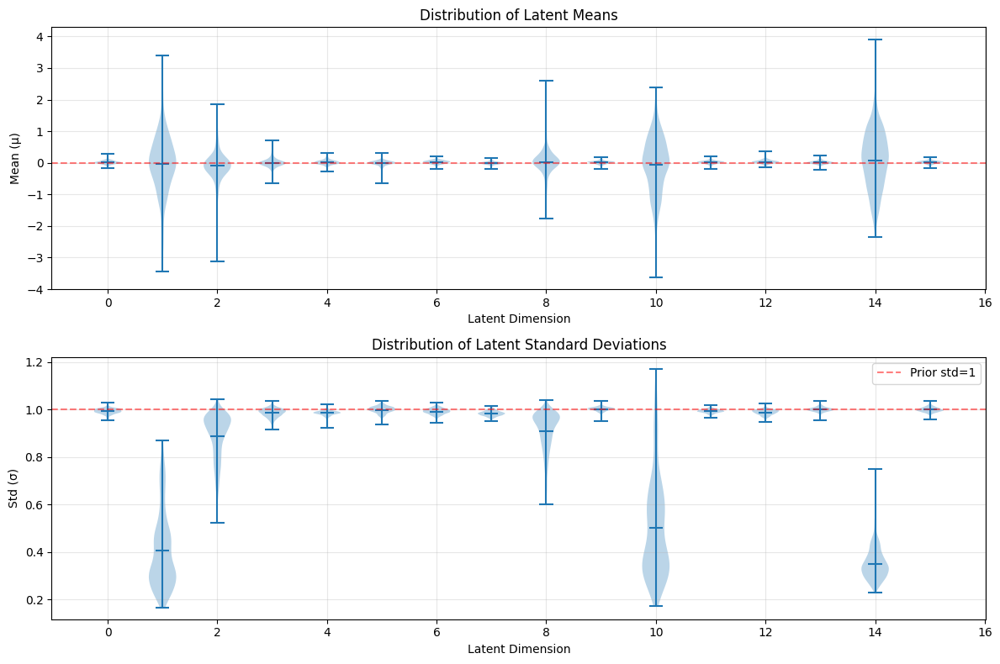


----------------------------------------------------------------------
Latent Space Analysis (latent_dim=32)
----------------------------------------------------------------------
Active units (var > 0.01): 11/32
Total KL divergence: 8.1937
Average KL per dimension: 0.2561
Max KL dimension: 1.9198
Min KL dimension: 0.0014


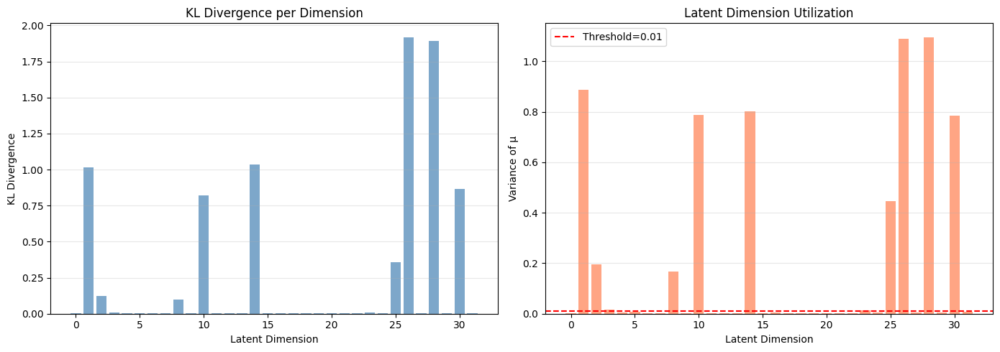

In [65]:
print("Latent Distribution Analysis")
print("-"*70)

for ld in latent_dims:
  print(f"\nMNIST Digits – Latent Distributions (latent_dim={ld}):")
  visualize_latent_distributions(conv_vae_digits[ld]["model"], val_digits, device, n_samples=1000)
  analyze_vae_latent_space(conv_vae_digits[ld]["model"], val_digits, device, n_samples=1000)

  print(f"\nFashion-MNIST – Latent Distributions (latent_dim={ld}):")
  visualize_latent_distributions(conv_vae_fashion[ld]["model"], val_fashion, device, n_samples=1000)
  analyze_vae_latent_space(conv_vae_fashion[ld]["model"], val_fashion, device, n_samples=1000)

In [66]:
print("\nBest VAE Models:")
print("\nMNIST Digits (Linear VAE):")
for ld in latent_dims:
  loss = linear_vae_digits[ld]['final_val_loss']
  recon = linear_vae_digits[ld]['history']['val']['recon_loss'][-1]
  kl = linear_vae_digits[ld]['history']['val']['kl_loss'][-1]
  print(f"  latent_dim={ld:3d}: total={loss:.4f}, recon={recon:.4f}, kl={kl:.4f}")

print("\nFashion-MNIST (Linear VAE):")
for ld in latent_dims:
  loss = linear_vae_fashion[ld]['final_val_loss']
  recon = linear_vae_fashion[ld]['history']['val']['recon_loss'][-1]
  kl = linear_vae_fashion[ld]['history']['val']['kl_loss'][-1]
  print(f"  latent_dim={ld:3d}: total={loss:.4f}, recon={recon:.4f}, kl={kl:.4f}")

print("\nMNIST Digits (Conv VAE):")
for ld in latent_dims:
  loss = conv_vae_digits[ld]['final_val_loss']
  recon = conv_vae_digits[ld]['history']['val']['recon_loss'][-1]
  kl = conv_vae_digits[ld]['history']['val']['kl_loss'][-1]
  print(f"  latent_dim={ld:3d}: total={loss:.4f}, recon={recon:.4f}, kl={kl:.4f}")

print("\nFashion-MNIST (Conv VAE):")
for ld in latent_dims:
  loss = conv_vae_fashion[ld]['final_val_loss']
  recon = conv_vae_fashion[ld]['history']['val']['recon_loss'][-1]
  kl = conv_vae_fashion[ld]['history']['val']['kl_loss'][-1]
  print(f"  latent_dim={ld:3d}: total={loss:.4f}, recon={recon:.4f}, kl={kl:.4f}")


Best VAE Models:

MNIST Digits (Linear VAE):
  latent_dim=  2: total=30.0455, recon=30.0455, kl=5.1327
  latent_dim=  8: total=19.2560, recon=19.2560, kl=9.5406
  latent_dim= 16: total=17.6426, recon=17.6426, kl=10.6720
  latent_dim= 32: total=18.4925, recon=18.4925, kl=9.9721

Fashion-MNIST (Linear VAE):
  latent_dim=  2: total=21.5247, recon=21.5247, kl=5.2204
  latent_dim=  8: total=17.0859, recon=17.0859, kl=6.8029
  latent_dim= 16: total=16.8815, recon=16.8815, kl=7.0114
  latent_dim= 32: total=16.8651, recon=16.8651, kl=7.1362

MNIST Digits (Conv VAE):
  latent_dim=  2: total=32.4577, recon=32.4577, kl=4.6555
  latent_dim=  8: total=17.2693, recon=17.2693, kl=10.9143
  latent_dim= 16: total=16.2227, recon=16.2227, kl=12.1342
  latent_dim= 32: total=15.8430, recon=15.8430, kl=12.3685

Fashion-MNIST (Conv VAE):
  latent_dim=  2: total=23.1632, recon=23.1632, kl=4.8163
  latent_dim=  8: total=15.6401, recon=15.6401, kl=8.5689
  latent_dim= 16: total=15.9445, recon=15.9445, kl=8.222

# f-VAE

## Normalizing Flow

In [74]:
class AffineCouplingLayer(nn.Module):
  """
  Affine coupling layer for RealNVP

  Split input into two parts [z1, z2]
  z1 stays unchanged
  z2 is transformed z2' = z2 * exp(s(z1)) + t(z1)
  where s and t are scale and translation networks
  """

  def __init__(self, dim: int, hidden_dim: int = 128, mask_type: str = 'checkerboard'):
    super().__init__()
    self.dim = dim

    # binary mask
    if mask_type == 'checkerboard':
      # alternate masking [1, 0, 1, 0, ...]
      self.register_buffer('mask', torch.tensor([i % 2 for i in range(dim)], dtype=torch.float32))
    else:
      # first half masked: [1, 1, ..., 0, 0, ...]
      mask = torch.zeros(dim)
      mask[:dim // 2] = 1
      self.register_buffer('mask', mask)

    # takes masked input and outputs parameters for unmasked part
    self.scale_net = nn.Sequential(nn.Linear(dim, hidden_dim),
                                   nn.ReLU(),
                                   nn.Linear(hidden_dim, hidden_dim),
                                   nn.ReLU(),
                                   nn.Linear(hidden_dim, dim),
                                   nn.Tanh())  # bound the scale

    self.translate_net = nn.Sequential(nn.Linear(dim, hidden_dim),
                                       nn.ReLU(),
                                       nn.Linear(hidden_dim, hidden_dim),
                                       nn.ReLU(),
                                       nn.Linear(hidden_dim, dim))

  def forward(self, z, reverse=False):
    """
    Forward (sampling): z -> z'
    Reverse (density): z' -> z
    """
    masked_z = z * self.mask

    # Ccmpute scale and translation from masked part
    s = self.scale_net(masked_z)
    t = self.translate_net(masked_z)

    if not reverse:
      # forward z' = z * exp(s) + t (for unmasked part)
      z_out = masked_z + (1 - self.mask) * (z * torch.exp(s) + t)
      # log determinant: sum of log(exp(s)) = sum(s) for unmasked dimensions
      log_det = torch.sum(s * (1 - self.mask), dim=1)
    else:
      # reverse z = (z' - t) * exp(-s)
      z_out = masked_z + (1 - self.mask) * ((z - t) * torch.exp(-s))
      log_det = -torch.sum(s * (1 - self.mask), dim=1)

    return z_out, log_det

class RealNVP(nn.Module):
  """
  Stack of affine coupling layers with alternating masks
  Transforms simple prior N(0,I) to complex distribution
  """

  def __init__(self, dim: int, n_layers: int = 4, hidden_dim: int = 128):
    super().__init__()
    self.dim = dim
    self.n_layers = n_layers

    self.layers = nn.ModuleList([
        AffineCouplingLayer(
            dim=dim,
            hidden_dim=hidden_dim,
            mask_type='checkerboard' if i % 2 == 0 else 'half')
        for i in range(n_layers)])

  def forward(self, z, reverse=False):
    """
    forward z_0 -> z_K
    reverse z_K -> z_0
    """
    log_det_sum = 0

    if not reverse:
      for layer in self.layers:
        z, log_det = layer(z, reverse=False)
        log_det_sum += log_det
    else:
      for layer in reversed(self.layers):
        z, log_det = layer(z, reverse=True)
        log_det_sum += log_det

    return z, log_det_sum

  def sample(self, n_samples: int, device: str = 'cuda'):
    """Sample from the learned distribution z_0 ~ N(0,I) -> transform -> z_K ~ p(z)"""
    # Ssample from base distribution
    z_0 = torch.randn(n_samples, self.dim, device=device)

    # transform to complex distribution
    z_K, _ = self.forward(z_0, reverse=False)

    return z_K

  def log_prob(self, z):
    """Compute log probability log p(z) = log p(f^{-1}(z)) + log |det J_{f^{-1}}|"""
    # transform to base distribution
    z_0, log_det_sum = self.forward(z, reverse=True)

    # log probability in base (standard normal) distribution
    log_p_z0 = -0.5 * (z_0 ** 2 + np.log(2 * np.pi)).sum(dim=1)

    # add log determinant
    log_p_z = log_p_z0 + log_det_sum

    return log_p_z

class BatchNormFlow(nn.Module):
  """Batch normalization as a flow layer to stabilize training of deep flows
  """

  def __init__(self, dim: int, eps: float = 1e-5):
    super().__init__()
    self.dim = dim
    self.eps = eps

    # learnable scale and shift
    self.log_scale = nn.Parameter(torch.zeros(dim))
    self.shift = nn.Parameter(torch.zeros(dim))

    self.register_buffer('running_mean', torch.zeros(dim))
    self.register_buffer('running_var', torch.ones(dim))
    self.register_buffer('num_batches_tracked', torch.tensor(0, dtype=torch.long))

  def forward(self, z, reverse=False):
    if self.training and not reverse:
      batch_mean = z.mean(dim=0)
      batch_var = z.var(dim=0)

      momentum = 0.1
      self.running_mean = (1 - momentum) * self.running_mean + momentum * batch_mean
      self.running_var = (1 - momentum) * self.running_var + momentum * batch_var
      self.num_batches_tracked += 1

      mean = batch_mean
      var = batch_var
    else:
      mean = self.running_mean
      var = self.running_var

    if not reverse:
      # normalize and scale
      z_normalized = (z - mean) / torch.sqrt(var + self.eps)
      z_out = z_normalized * torch.exp(self.log_scale) + self.shift

      # log determinant
      log_det = self.log_scale.sum() - 0.5 * torch.log(var + self.eps).sum()
      log_det = log_det.expand(z.size(0))
    else:
      # undo scale and normalization
      z_scaled = (z - self.shift) * torch.exp(-self.log_scale)
      z_out = z_scaled * torch.sqrt(var + self.eps) + mean

      log_det = -self.log_scale.sum() + 0.5 * torch.log(var + self.eps).sum()
      log_det = log_det.expand(z.size(0))

    return z_out, log_det

class ImprovedRealNVP(nn.Module):
  """RealNVP with batch normalization layers"""

  def __init__(self, dim: int, n_layers: int = 6, hidden_dim: int = 128, use_batchnorm: bool = True):
    super().__init__()
    self.dim = dim
    self.n_layers = n_layers
    self.use_batchnorm = use_batchnorm

    layers = []
    for i in range(n_layers):
      layers.append(
          AffineCouplingLayer(
              dim=dim,
              hidden_dim=hidden_dim,
              mask_type='checkerboard' if i % 2 == 0 else 'half'))
      # add batch norm between coupling layers
      if use_batchnorm and i < n_layers - 1:
        layers.append(BatchNormFlow(dim))

    self.layers = nn.ModuleList(layers)

  def forward(self, z, reverse=False):
    log_det_sum = 0

    if not reverse:
      for layer in self.layers:
        z, log_det = layer(z, reverse=False)
        log_det_sum += log_det
    else:
      for layer in reversed(self.layers):
        z, log_det = layer(z, reverse=True)
        log_det_sum += log_det

    return z, log_det_sum

  def sample(self, n_samples: int, device: str = 'cuda'):
    z_0 = torch.randn(n_samples, self.dim, device=device)
    z_K, _ = self.forward(z_0, reverse=False)
    return z_K

  def log_prob(self, z):
    z_0, log_det_sum = self.forward(z, reverse=True)
    log_p_z0 = -0.5 * (z_0 ** 2 + np.log(2 * np.pi)).sum(dim=1)
    log_p_z = log_p_z0 + log_det_sum
    return log_p_z

## Architecture

In [75]:
class FlowVAE(nn.Module):
  """
  Encoder x -> (mu, logvar)
  Reparameterization: z_0 = mu + sigma * epsilon
  Normalizing Flow: z_0 -> z_K (complex prior)
  Decoder: z_K -> x_recon
  """

  def __init__(self, encoder: nn.Module, decoder: nn.Module, latent_dim: int, flow_n_layers: int = 6,
               flow_hidden_dim: int = 128, use_improved_flow: bool = True):
    super().__init__()
    self.encoder = encoder
    self.decoder = decoder
    self.latent_dim = latent_dim

    if use_improved_flow:
      self.flow = ImprovedRealNVP(
          dim=latent_dim,
          n_layers=flow_n_layers,
          hidden_dim=flow_hidden_dim,
          use_batchnorm=True)
    else:
      self.flow = RealNVP(
          dim=latent_dim,
          n_layers=flow_n_layers,
          hidden_dim=flow_hidden_dim)

  def reparameterize(self, mu, logvar):
    """reparameterization trick z = mu + sigma * epsilon"""
    std = torch.exp(0.5 * logvar)
    eps = torch.randn_like(std)
    return mu + eps * std

  def forward(self, x):
    # encode
    mu, logvar = self.encoder(x)

    # reparameterize
    z_0 = self.reparameterize(mu, logvar)

    # flow transformation
    z_K, log_det = self.flow(z_0, reverse=False)

    # decode
    x_recon = self.decoder(z_K)

    return x_recon, mu, logvar, z_0, z_K, log_det

  def sample(self, n_samples: int, device: str = 'cuda'):
    """Generate samples from the model sample z_0 ~ N(0, I) + transform through flow z_0 -> z_K + decode z_K -> x"""
    self.eval()
    with torch.no_grad():
      z_0 = torch.randn(n_samples, self.latent_dim, device=device)
      z_K, _ = self.flow(z_0, reverse=False)
      x = self.decoder(z_K)

    return x

  def reconstruct(self, x):
    self.eval()
    with torch.no_grad():
      mu, logvar = self.encoder(x)
      z_0 = mu
      z_K, _ = self.flow(z_0, reverse=False)
      x_recon = self.decoder(z_K)
    return x_recon



class ConvFlowVAE(FlowVAE):
  """Convolutional f-VAE for MNIST uses the ConvVAE encoder/decoder with normalizing flow
  """

  def __init__(self, latent_dim: int = 32, flow_n_layers: int = 6, flow_hidden_dim: int = 128, use_improved_flow: bool = True):
    encoder = ConvVAEEncoder(latent_dim=latent_dim)
    decoder = ConvVAEDecoder(latent_dim=latent_dim)

    super().__init__(
        encoder=encoder,
        decoder=decoder,
        latent_dim=latent_dim,
        flow_n_layers=flow_n_layers,
        flow_hidden_dim=flow_hidden_dim,
        use_improved_flow=use_improved_flow)

## Helpers

### Loss Function

In [76]:
def fvae_loss_function(x, model_output, beta=1.0):
  """
  f-VAE loss = reconstruction loss + KL divergence (modified with flow)

  ELBO with normalizing flow:
  L = E[log p(x|z_K)] - KL(q(z_0|x) || p(z_0)) + E[log |det(dz_K/dz_0)|]

  The flow term log |det| corrects the KL divergence for the transformation
  """
  x_recon, mu, logvar, z_0, z_K, log_det = model_output
  batch_size = x.size(0)

  # MSE as a reconstruction loss
  recon_loss = F.mse_loss(x_recon, x, reduction='sum') / batch_size

  # standard VAE KL term for the encoder distribution
  kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / batch_size

  # flow correction term E[log |det(dz_K/dz_0)|] or simply log determinant from the flow transformation
  flow_log_det = torch.mean(log_det)

  # total loss = recon + beta * KL - flow_log_det
  total_loss = recon_loss + beta * kl_loss - flow_log_det

  metrics = {'recon_loss': recon_loss.item(),
             'kl_loss': kl_loss.item(),
             'flow_log_det': flow_log_det.item(),
             'total_loss': total_loss.item()}

  return total_loss, metrics


def create_fvae_loss_fn(beta=1.0):
  def loss_fn(x, model_output):
    return fvae_loss_function(x, model_output, beta=beta)
  return loss_fn

### Visualization

In [77]:
def visualize_flow_transformation(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000):
  """Visualize how the flow transforms z_0 to z_K"""
  if model.latent_dim != 2:
    print(f"Flow visualization only works for 2D latent space, got {model.latent_dim}D")
    return

  model.eval()

  z_0_list = []
  z_K_list = []

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)
      mu, logvar = model.encoder(x)
      z_0 = mu
      z_K, _ = model.flow(z_0, reverse=False)

      z_0_list.append(z_0.cpu().numpy())
      z_K_list.append(z_K.cpu().numpy())

      if len(z_0_list) * x.size(0) >= n_samples:
        break

  z_0_array = np.concatenate(z_0_list, axis=0)[:n_samples]
  z_K_array = np.concatenate(z_K_list, axis=0)[:n_samples]

  fig, axes = plt.subplots(1, 2, figsize=(14, 6))

  # before flow (z_0)
  axes[0].scatter(z_0_array[:, 0], z_0_array[:, 1], alpha=0.5, s=10)
  axes[0].set_xlabel('Dimension 1')
  axes[0].set_ylabel('Dimension 2')
  axes[0].set_title('Before Flow (z₀) - Encoder Output')
  axes[0].grid(alpha=0.3)
  axes[0].axis('equal')

  # after flow (z_K)
  axes[1].scatter(z_K_array[:, 0], z_K_array[:, 1], alpha=0.5, s=10, color='orange')
  axes[1].set_xlabel('Dimension 1')
  axes[1].set_ylabel('Dimension 2')
  axes[1].set_title('After Flow (z_K) - Transformed Distribution')
  axes[1].grid(alpha=0.3)
  axes[1].axis('equal')

  plt.tight_layout()
  plt.show()

def visualize_fvae_samples(model: nn.Module, device: str, n_samples: int = 16, title: str = "f-VAE Generated Samples"):
  """Generate and visualize samples from f-VAE"""
  x_gen = model.sample(n_samples, device)
  x_gen = x_gen.cpu().numpy()

  n_cols = 8
  n_rows = (n_samples + n_cols - 1) // n_cols

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.2, n_rows * 1.2))
  axes = axes.flatten() if n_samples > 1 else [axes]

  for i in range(n_samples):
    axes[i].imshow(x_gen[i].squeeze(), cmap='gray')
    axes[i].axis('off')

  for i in range(n_samples, len(axes)):
    axes[i].axis('off')

  plt.suptitle(title, fontsize=14)
  plt.tight_layout()
  plt.show()


def compare_fvae_reconstruction_and_samples(model: nn.Module, loader: DataLoader, device: str, n_recon: int = 8, n_samples: int = 8):
  """
  Row 1: Original images (from dataset)
  Row 2: Reconstructions (original → encoder → decoder)
  Row 3: Generated samples (random z ~ N(0,I) → decoder)
  """
  model.eval()

  x_real, _ = next(iter(loader))
  x_real = x_real[:n_recon].to(device)

  with torch.no_grad():
    x_recon = model.reconstruct(x_real)
    x_sample = model.sample(n_samples, device)

  x_real = x_real.cpu().numpy()
  x_recon = x_recon.cpu().numpy()
  x_sample = x_sample.cpu().numpy()

  fig, axes = plt.subplots(3, max(n_recon, n_samples), figsize=(max(n_recon, n_samples) * 1.5, 4.5))

  for i in range(n_recon):
    axes[0, i].imshow(x_real[i].squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0:
      axes[0, i].set_ylabel('Original', fontsize=12)

    axes[1, i].imshow(x_recon[i].squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0:
      axes[1, i].set_ylabel('Reconstructed', fontsize=12)

  for i in range(n_samples):
    axes[2, i].imshow(x_sample[i].squeeze(), cmap='gray')
    axes[2, i].axis('off')
    if i == 0:
      axes[2, i].set_ylabel('Generated', fontsize=12)

  for i in range(max(n_recon, n_samples)):
    if i >= n_recon:
      axes[0, i].axis('off')
      axes[1, i].axis('off')
    if i >= n_samples:
      axes[2, i].axis('off')

  plt.tight_layout()
  plt.show()

def visualize_flow_layers_effect(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 500):
  """Visualize the effect of each flow layer (only for 2D latent)"""
  if model.latent_dim != 2:
    print("Layer visualization only works for 2D latent space")
    return

  model.eval()

  x, _ = next(iter(loader))
  x = x[:n_samples].to(device)

  with torch.no_grad():
    mu, logvar = model.encoder(x)
    z = mu

    z_layers = [z.cpu().numpy()]

    for layer in model.flow.layers:
      z, _ = layer(z, reverse=False)
      z_layers.append(z.cpu().numpy())

  n_layers = len(z_layers)
  n_cols = min(4, n_layers)
  n_rows = (n_layers + n_cols - 1) // n_cols

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
  axes = axes.flatten() if n_layers > 1 else [axes]

  for i, z_layer in enumerate(z_layers):
    axes[i].scatter(z_layer[:, 0], z_layer[:, 1], alpha=0.5, s=10)
    axes[i].set_xlabel('Dimension 1')
    axes[i].set_ylabel('Dimension 2')
    if i == 0:
      axes[i].set_title('Input (z₀)')
    elif i == n_layers - 1:
      axes[i].set_title(f'Output (z_{i})')
    else:
      axes[i].set_title(f'After Layer {i}')
    axes[i].grid(alpha=0.3)
    axes[i].axis('equal')

  for i in range(n_layers, len(axes)):
    axes[i].axis('off')

  plt.suptitle('Progressive Transformation Through Flow Layers', fontsize=16)
  plt.tight_layout()
  plt.show()

## Experiments

In [78]:
latent_dims = [2, 8, 16, 32]
fvae_loss_fn = create_fvae_loss_fn(beta=1.0)

fvae_results = {}

for latent_dim in latent_dims:
  print(f"Training f-VAE with latent_dim = {latent_dim}")
  print(f"{'-'*50}")

  model = ConvFlowVAE(latent_dim=latent_dim, flow_n_layers=6, flow_hidden_dim=128, use_improved_flow=True)

  history = train_model(model=model, train_loader=train_digits, val_loader=val_digits, epochs=30, lr=1e-3, device=device,
                        loss_fn=fvae_loss_fn, print_every=5)

  final_val_loss = history['val']['total_loss'][-1]
  fvae_results[latent_dim] = {'model': model,
                              'history': history,
                              'final_val_loss': final_val_loss}

  print(f"Final validation loss: {final_val_loss:.4f}")

Training f-VAE with latent_dim = 2
--------------------------------------------------
Epoch 5/30 | Train: recon_loss: 36.4495, kl_loss: 5.1018, flow_log_det: 4.6313, total_loss: 36.9200 | Val: recon_loss: 37.7764, kl_loss: 5.3997, flow_log_det: 4.7453, total_loss: 38.4308
Epoch 10/30 | Train: recon_loss: 35.1563, kl_loss: 5.7774, flow_log_det: 6.2722, total_loss: 34.6615 | Val: recon_loss: 36.7274, kl_loss: 5.8421, flow_log_det: 6.3507, total_loss: 36.2188
Epoch 15/30 | Train: recon_loss: 34.5965, kl_loss: 6.0488, flow_log_det: 7.4534, total_loss: 33.1919 | Val: recon_loss: 37.6260, kl_loss: 6.0247, flow_log_det: 7.5451, total_loss: 36.1056
Epoch 20/30 | Train: recon_loss: 34.1610, kl_loss: 6.2189, flow_log_det: 8.4964, total_loss: 31.8834 | Val: recon_loss: 35.4972, kl_loss: 6.2806, flow_log_det: 8.6487, total_loss: 33.1290
Epoch 25/30 | Train: recon_loss: 33.8338, kl_loss: 6.3007, flow_log_det: 9.4032, total_loss: 30.7314 | Val: recon_loss: 35.3686, kl_loss: 6.2255, flow_log_det: 9.4

Training Dynamics Comparison
----------------------------------------------------------------------


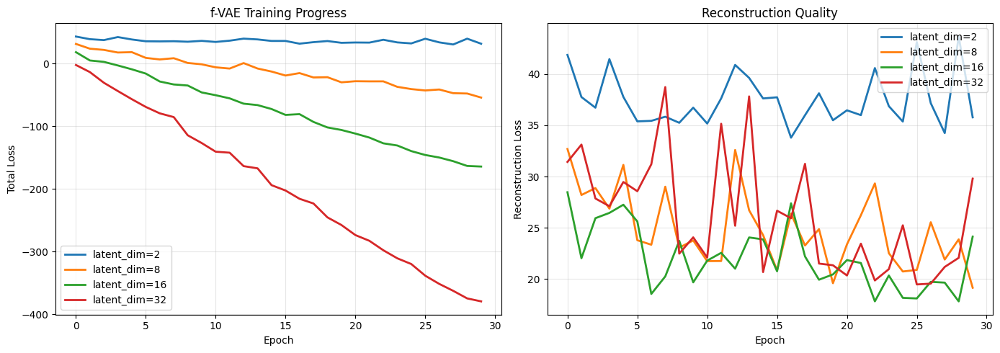

In [79]:
print("Training Dynamics Comparison")
print("-"*70)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ld in latent_dims:
  history = fvae_results[ld]['history']['val']['total_loss']
  axes[0].plot(history, label=f'latent_dim={ld}', linewidth=2)

axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Total Loss')
axes[0].set_title('f-VAE Training Progress')
axes[0].legend()
axes[0].grid(alpha=0.3)

for ld in latent_dims:
  history = fvae_results[ld]['history']['val']['recon_loss']
  axes[1].plot(history, label=f'latent_dim={ld}', linewidth=2)

axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Reconstruction Loss')
axes[1].set_title('Reconstruction Quality')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

f-VAE Loss Components Analysis

Latent Dimension: 2


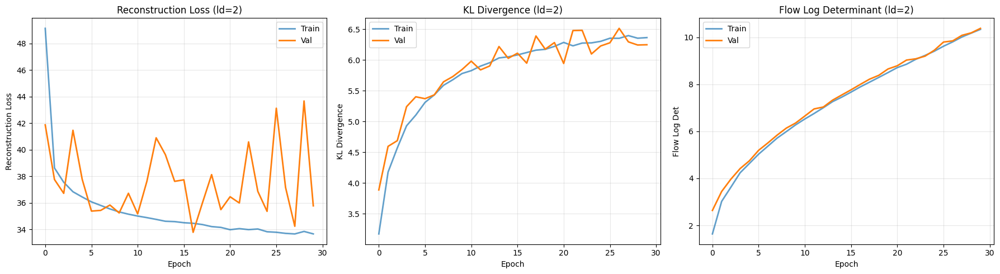


Latent Dimension: 8


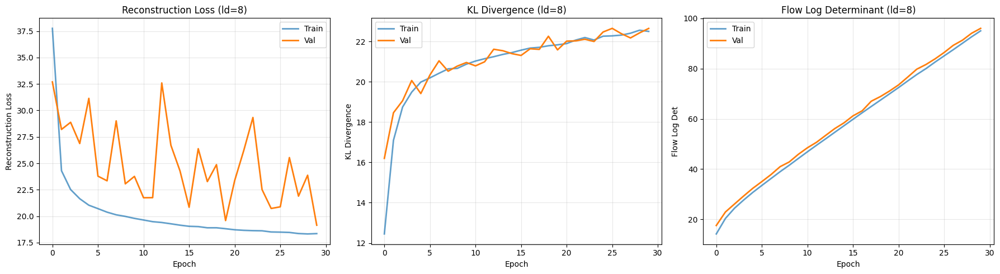


Latent Dimension: 16


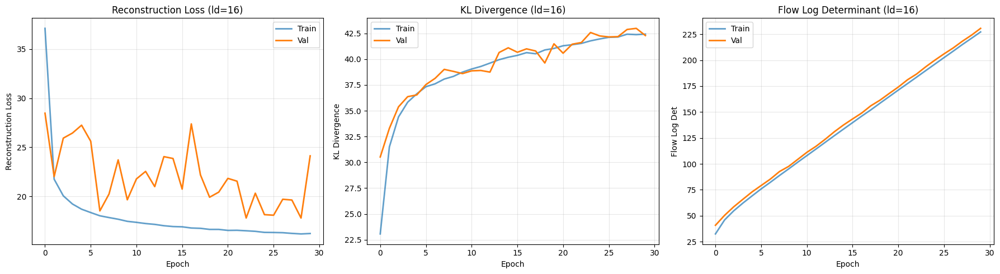


Latent Dimension: 32


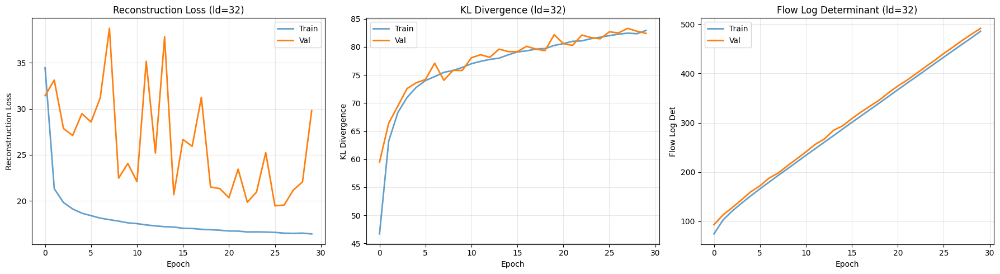

In [80]:
print("f-VAE Loss Components Analysis")
print("="*70)

for ld in latent_dims:
  print(f"\nLatent Dimension: {ld}")

  fvae_history = fvae_results[ld]['history']

  fig, axes = plt.subplots(1, 3, figsize=(18, 5))

  # reconstruction loss
  axes[0].plot(fvae_history['train']['recon_loss'], label='Train', linewidth=2, alpha=0.7)
  axes[0].plot(fvae_history['val']['recon_loss'], label='Val', linewidth=2)
  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Reconstruction Loss')
  axes[0].set_title(f'Reconstruction Loss (ld={ld})')
  axes[0].legend()
  axes[0].grid(alpha=0.3)

  # KL divergence
  axes[1].plot(fvae_history['train']['kl_loss'], label='Train', linewidth=2, alpha=0.7)
  axes[1].plot(fvae_history['val']['kl_loss'], label='Val', linewidth=2)
  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('KL Divergence')
  axes[1].set_title(f'KL Divergence (ld={ld})')
  axes[1].legend()
  axes[1].grid(alpha=0.3)

  # flow log determinant
  axes[2].plot(fvae_history['train']['flow_log_det'], label='Train', linewidth=2, alpha=0.7)
  axes[2].plot(fvae_history['val']['flow_log_det'], label='Val', linewidth=2)
  axes[2].set_xlabel('Epoch')
  axes[2].set_ylabel('Flow Log Det')
  axes[2].set_title(f'Flow Log Determinant (ld={ld})')
  axes[2].legend()
  axes[2].grid(alpha=0.3)

  plt.tight_layout()
  plt.show()

Flow Trandformation Visualization (2D)
----------------------------------------------------------------------

How flow transforms z₀ to z_K:


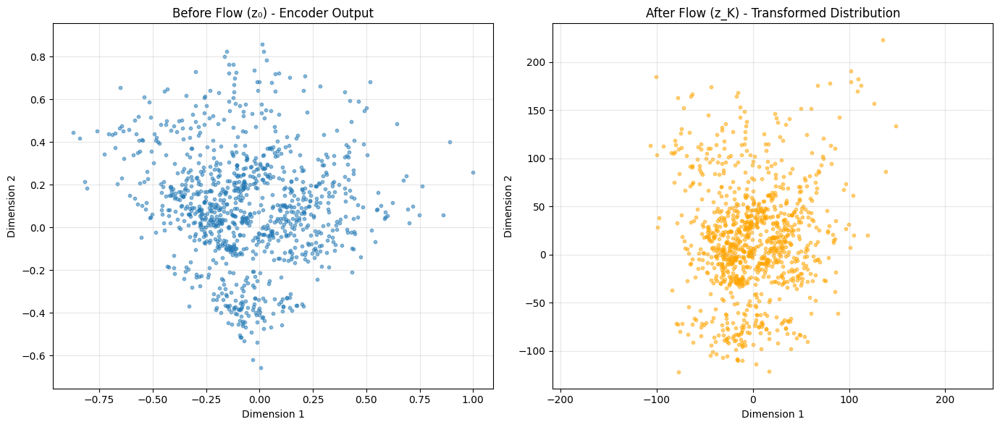


Progressive transformation through flow layers:


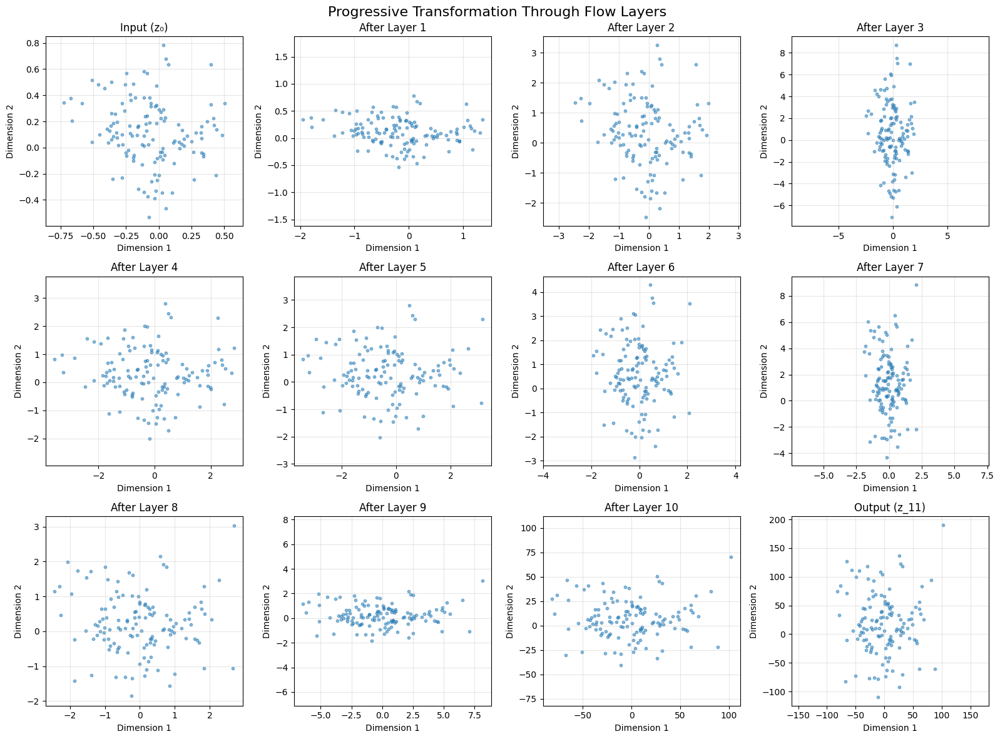

In [81]:
print("Flow Trandformation Visualization (2D)")
print("-"*70)

print("\nHow flow transforms z₀ to z_K:")
visualize_flow_transformation(fvae_results[2]['model'], val_digits, device, n_samples=1000)

print("\nProgressive transformation through flow layers:")
visualize_flow_layers_effect(fvae_results[2]['model'], val_digits, device, n_samples=500)

Reconstruction Quality
----------------------------------------------------------------------

Latent dim = 2


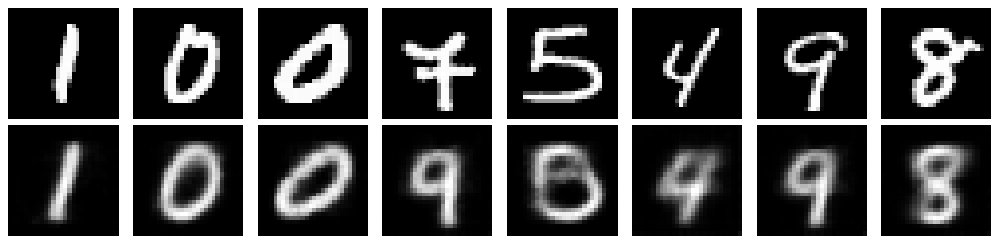


Latent dim = 8


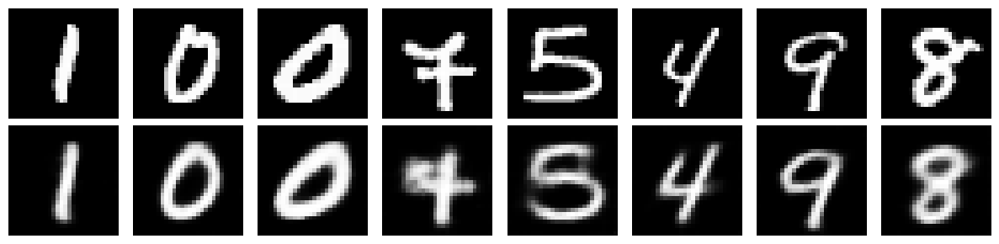


Latent dim = 16


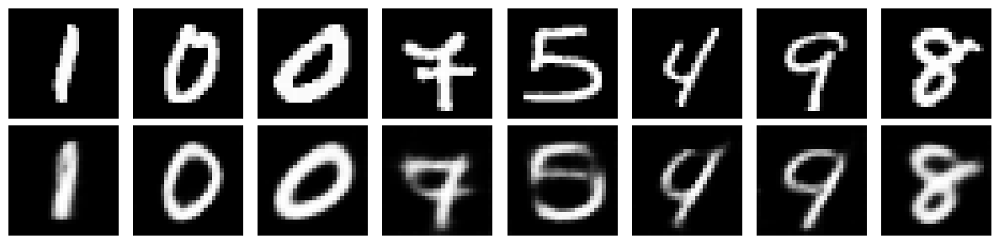


Latent dim = 32


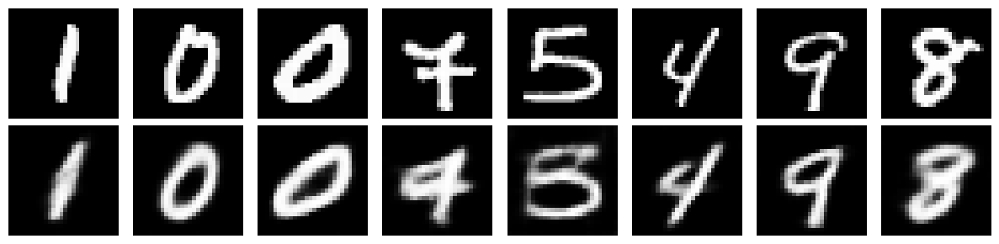

In [83]:
print("Reconstruction Quality")
print("-"*70)

for ld in latent_dims:
  print(f"\nLatent dim = {ld}")
  visualize_reconstructions(fvae_results[ld]['model'], val_digits, device, n_samples=8)

Generation Quality (Sampling from Learned Flow Prior)
----------------------------------------------------------------------

Latent dim = 2


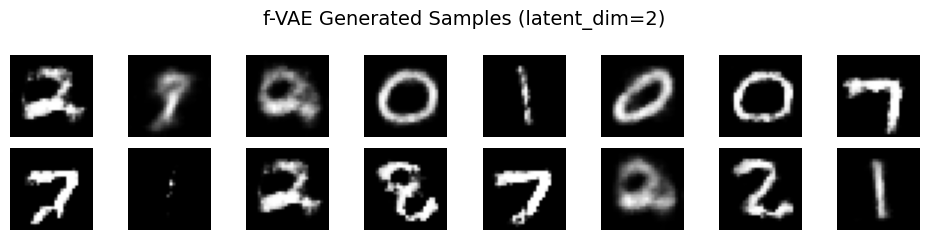


Latent dim = 8


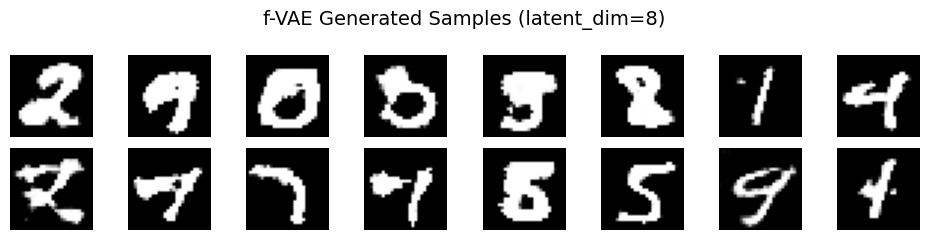


Latent dim = 16


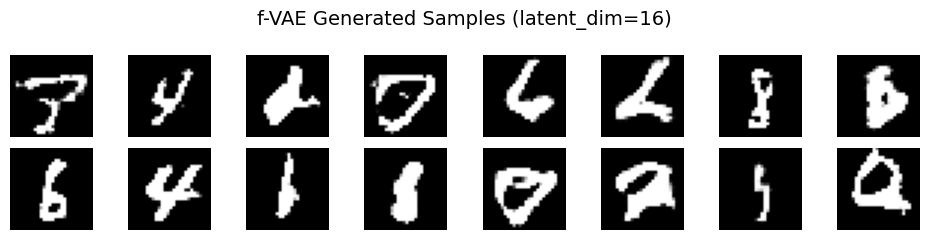


Latent dim = 32


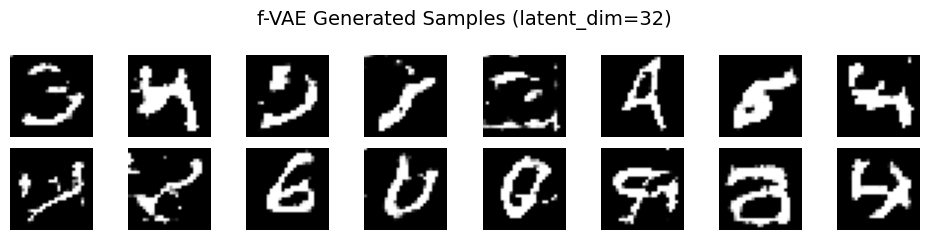

In [84]:
print("Generation Quality (Sampling from Learned Flow Prior)")
print("-"*70)

for ld in latent_dims:
  print(f"\nLatent dim = {ld}")
  visualize_fvae_samples(fvae_results[ld]['model'], device, n_samples=16, title=f"f-VAE Generated Samples (latent_dim={ld})")

Reconstruction VS Generation Comparison
----------------------------------------------------------------------

Latent dim = 2


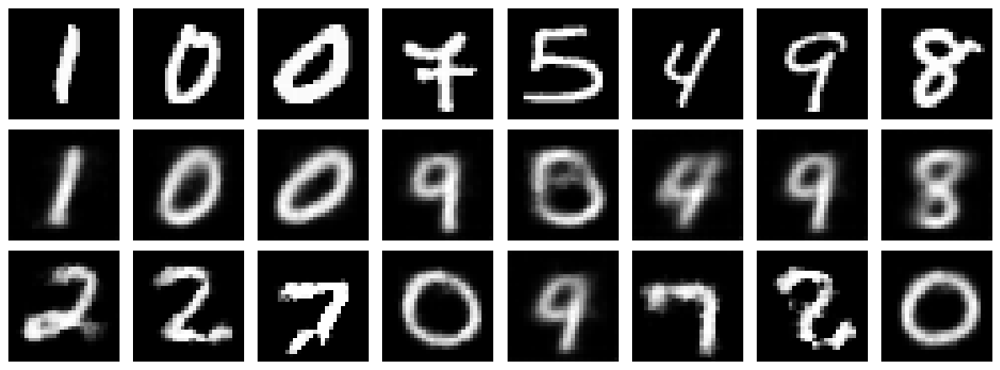


Latent dim = 8


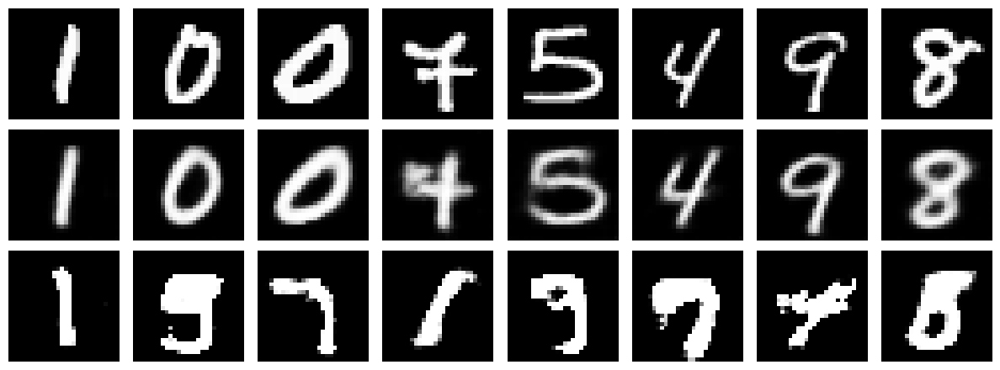


Latent dim = 16


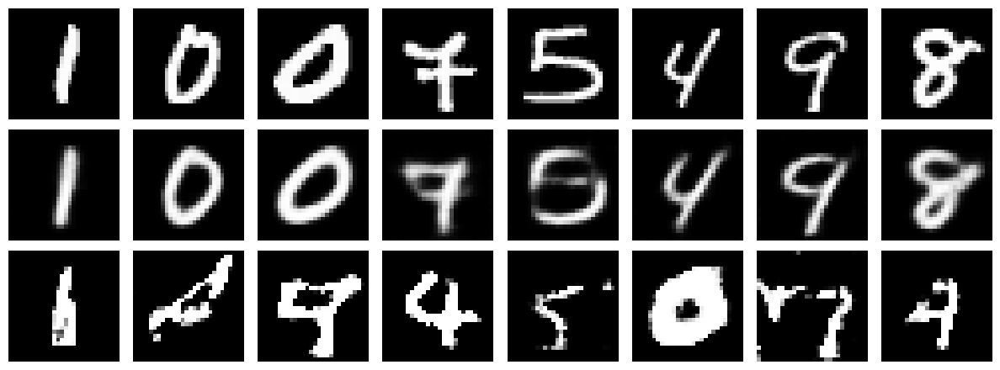


Latent dim = 32


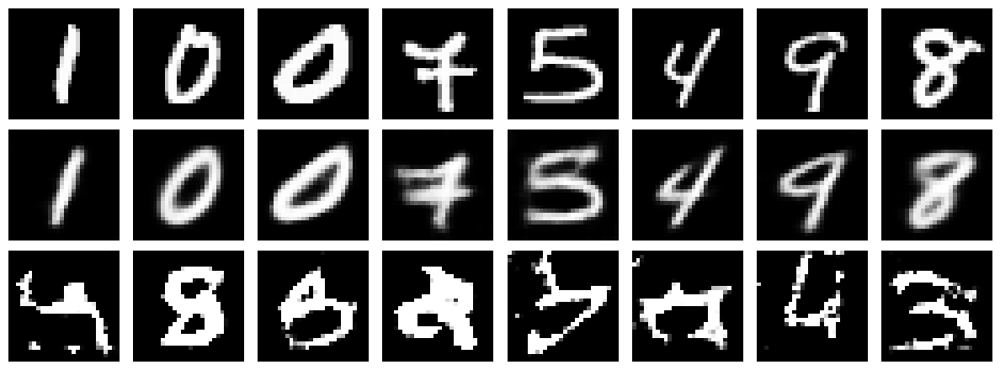

In [85]:
print("Reconstruction VS Generation Comparison")
print("-"*70)

for ld in latent_dims:
  print(f"\nLatent dim = {ld}")
  compare_fvae_reconstruction_and_samples(fvae_results[ld]['model'], val_digits, device, n_recon=8, n_samples=8)

In [91]:
print("f-VAE Results:")
print(f"{'Latent Dim':<12} {'Recon Loss':<15} {'KL Loss':<15} {'Flow LogDet':<15} {'Total Loss':<15}")
print("-" * 70)

for ld in latent_dims:
  history = fvae_results[ld]['history']
  recon = history['val']['recon_loss'][-1]
  kl = history['val']['kl_loss'][-1]
  flow_det = history['val']['flow_log_det'][-1]
  total = history['val']['total_loss'][-1]

  print(f"{ld:<12} {recon:<15.4f} {kl:<15.4f} {flow_det:<15.4f} {total:<15.4f}")

f-VAE Results:
Latent Dim   Recon Loss      KL Loss         Flow LogDet     Total Loss     
----------------------------------------------------------------------
2            35.7830         6.2454          10.3756         31.6529        
8            19.1461         22.6504         96.0343         -54.2378       
16           24.1332         42.2913         230.6824        -164.2579      
32           29.7981         82.4149         491.5637        -379.3507      


# β-VAE Exploration

## Helpers

In [105]:
def latent_traversal(model: nn.Module, device: str, latent_dim_idx: int, n_steps: int = 10,
                     traverse_range: Tuple[float, float] = (-3, 3), base_latent: Optional[torch.Tensor] = None):
  """Traverse a single latent dimension while keeping others fixed, showing what each dimension controls"""
  model.eval()

  if base_latent is None:
    base_latent = torch.zeros(1, model.latent_dim, device=device)
  else:
    base_latent = base_latent.to(device)

  traverse_values = torch.linspace(traverse_range[0], traverse_range[1], n_steps, device=device)

  generated_images = []

  with torch.no_grad():
    for val in traverse_values:
      z = base_latent.clone()
      z[0, latent_dim_idx] = val
      x = model.decoder(z)
      generated_images.append(x)

  return torch.cat(generated_images, dim=0)


def visualize_latent_traversal(model: nn.Module, device: str, latent_dim_idx: int, n_steps: int = 10,
                               traverse_range: Tuple[float, float] = (-3, 3), base_latent: Optional[torch.Tensor] = None,
                               title: Optional[str] = None):
  """Visualize latent traversal for a single dimension"""
  images = latent_traversal(model, device, latent_dim_idx, n_steps, traverse_range, base_latent)
  images = images.cpu().numpy()

  fig, axes = plt.subplots(1, n_steps, figsize=(n_steps * 1.2, 1.5))

  for i in range(n_steps):
    axes[i].imshow(images[i].squeeze(), cmap='gray')
    axes[i].axis('off')
    val = traverse_range[0] + i * (traverse_range[1] - traverse_range[0]) / (n_steps - 1)
    axes[i].set_title(f'{val:.1f}', fontsize=8)

  if title is None:
    title = f'Latent Dimension {latent_dim_idx} Traversal'
  plt.suptitle(title, fontsize=12)
  plt.tight_layout()
  plt.show()


def visualize_all_latent_traversals(model: nn.Module, device: str, n_dims_to_show: int = 10, n_steps: int = 10,
                                    traverse_range: Tuple[float, float] = (-3, 3), base_latent: Optional[torch.Tensor] = None):
  """Visualize traversals for multiple latent dimensions in a grid; shows what each dimension controls independently"""
  n_dims = min(n_dims_to_show, model.latent_dim)

  fig, axes = plt.subplots(n_dims, n_steps, figsize=(n_steps * 1.2, n_dims * 1.2))

  model.eval()

  if base_latent is None:
    base_latent = torch.zeros(1, model.latent_dim, device=device)

  traverse_values = torch.linspace(traverse_range[0], traverse_range[1], n_steps, device=device)

  with torch.no_grad():
    for dim_idx in range(n_dims):
      for step_idx, val in enumerate(traverse_values):
        z = base_latent.clone()
        z[0, dim_idx] = val
        x = model.decoder(z)

        img = x.cpu().numpy().squeeze()
        axes[dim_idx, step_idx].imshow(img, cmap='gray')
        axes[dim_idx, step_idx].axis('off')

        # Label first column with dimension index
        if step_idx == 0:
          axes[dim_idx, step_idx].set_ylabel(f'Dim {dim_idx}', fontsize=10)

        # Label first row with traversal values
        if dim_idx == 0:
          axes[dim_idx, step_idx].set_title(f'{val:.1f}', fontsize=8)

  plt.suptitle('Latent Dimension Traversals', fontsize=14)
  plt.tight_layout()
  plt.show()


def compute_disentanglement_metric(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000) -> Tuple[float, np.ndarray]:
  """
  Compute a simple disentanglement metric based on variance

  Higher variance in individual dimensions (relative to others) suggests
  better disentanglement - each dimension captures independent factors
  """
  model.eval()

  latents = []

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)
      mu, logvar = model.encoder(x)
      latents.append(mu.cpu().numpy())

      if len(latents) * x.size(0) >= n_samples:
        break

  latents = np.concatenate(latents, axis=0)[:n_samples]

  dim_variances = np.var(latents, axis=0)

  normalized_vars = dim_variances / dim_variances.sum()

  # Disentanglement metric is entropy of normalized variances
  # High entropy = variances spread out = better disentanglement
  # Low entropy = variances concentrated = worse disentanglement
  epsilon = 1e-10
  entropy = -np.sum(normalized_vars * np.log(normalized_vars + epsilon))
  max_entropy = np.log(len(dim_variances))

  metric = entropy / max_entropy

  return metric, dim_variances


def analyze_disentanglement(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 1000, model_name: str = "Model"):
  metric, dim_variances = compute_disentanglement_metric(model, loader, device, n_samples)

  print(f"Disentanglement analysis: {model_name}")
  print(f"{'-'*70}")
  print(f"Disentanglement metric: {metric:.4f} (higher is better, max=1.0)")
  print(f"Mean dimension variance: {dim_variances.mean():.4f}")
  print(f"Std dimension variance:  {dim_variances.std():.4f}")
  print(f"Active dimensions (var > 0.01): {np.sum(dim_variances > 0.01)}/{len(dim_variances)}")

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  n_dims = min(32, len(dim_variances))
  axes[0].bar(range(n_dims), dim_variances[:n_dims], color='steelblue', alpha=0.7)
  axes[0].set_xlabel('Latent Dimension')
  axes[0].set_ylabel('Variance')
  axes[0].set_title(f'{model_name} - Latent Dimension Variances')
  axes[0].grid(alpha=0.3, axis='y')

  sorted_vars = np.sort(dim_variances)[::-1]
  axes[1].plot(sorted_vars, marker='o', linewidth=2, markersize=4)
  axes[1].set_xlabel('Dimension Rank')
  axes[1].set_ylabel('Variance')
  axes[1].set_title(f'{model_name} - Sorted Variances')
  axes[1].grid(alpha=0.3)
  axes[1].set_yscale('log')

  plt.tight_layout()
  plt.show()

  return metric, dim_variances


def compare_beta_effects(models_dict: dict, loader: DataLoader, device: str, n_samples: int = 1000):
  """Compare disentanglement across different β values"""
  print("β-VAE Disentanglement Comparison")
  print("-"*70)

  results = {}

  for beta, model in models_dict.items():
    metric, variances = compute_disentanglement_metric(model, loader, device, n_samples)
    results[beta] = {'metric': metric,
                      'variances': variances,
                      'active_dims': np.sum(variances > 0.01)}

  # Summary table
  print("\nSummary:")
  print(f"{'Beta':<10} {'Disentanglement':<20} {'Active Dims':<15} {'Mean Var':<15}")
  print("-" * 70)

  for beta in sorted(models_dict.keys()):
    res = results[beta]
    print(f"{beta:<10} {res['metric']:<20.4f} {res['active_dims']:<15} {res['variances'].mean():<15.4f}")

  # Plot comparison
  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  betas = sorted(models_dict.keys())
  metrics = [results[b]['metric'] for b in betas]
  active_dims = [results[b]['active_dims'] for b in betas]

  # Disentanglement metric vs beta
  axes[0].plot(betas, metrics, marker='o', linewidth=2, markersize=8, color='steelblue')
  axes[0].set_xlabel('β Value')
  axes[0].set_ylabel('Disentanglement Metric')
  axes[0].set_title('Disentanglement vs β')
  axes[0].grid(alpha=0.3)
  axes[0].set_xscale('log')

  # Active dimensions vs beta
  axes[1].plot(betas, active_dims, marker='s', linewidth=2, markersize=8, color='coral')
  axes[1].set_xlabel('β Value')
  axes[1].set_ylabel('Active Dimensions')
  axes[1].set_title('Active Dimensions vs β')
  axes[1].grid(alpha=0.3)
  axes[1].set_xscale('log')

  plt.tight_layout()
  plt.show()

  return results


def measure_reconstruction_quality(model: nn.Module, loader: DataLoader, device: str, n_samples: int = 100) -> float:
  """Measure reconstruction quality using MSE"""
  model.eval()
  total_mse = 0
  n_batches = 0

  with torch.no_grad():
    for x, _ in loader:
      x = x.to(device)

      # Get reconstruction
      output = model(x)
      if isinstance(output, tuple):
          x_recon = output[0]
      else:
          x_recon = output

      # Compute MSE
      mse = torch.mean((x - x_recon) ** 2)
      total_mse += mse.item()
      n_batches += 1

      if n_batches * x.size(0) >= n_samples:
        break

  return total_mse / n_batches


def measure_generation_diversity(model: nn.Module, device: str, n_samples: int = 1000) -> float:
  """
  Measure generation diversity using pairwise L2 distances
  Higher diversity = more varied generations
  """
  model.eval()

  with torch.no_grad():
    z = torch.randn(n_samples, model.latent_dim, device=device)
    x = model.decoder(z)
    x = x.view(n_samples, -1)

    n_pairs = min(1000, n_samples * (n_samples - 1) // 2)
    distances = []

    for _ in range(n_pairs):
      i, j = np.random.choice(n_samples, 2, replace=False)
      dist = torch.norm(x[i] - x[j], p=2).item()
      distances.append(dist)

  return np.mean(distances)


def compare_beta_reconstruction_diversity(models_dict: dict, loader: DataLoader, device: str):
  """Compare reconstruction quality and generation diversity across β values"""
  print("Reconstrcution Quality & Generation Diversity")
  print("-"*70)

  results = {}

  for beta, model in models_dict.items():
    recon_quality = measure_reconstruction_quality(model, loader, device, n_samples=200)
    gen_diversity = measure_generation_diversity(model, device, n_samples=500)

    results[beta] = {'reconstruction_mse': recon_quality,
                      'generation_diversity': gen_diversity}

  print("\nResults:")
  print(f"{'Beta':<10} {'Recon MSE':<20} {'Gen Diversity':<20}")
  print("-" * 50)

  for beta in sorted(models_dict.keys()):
    res = results[beta]
    print(f"{beta:<10} {res['reconstruction_mse']:<20.6f} {res['generation_diversity']:<20.4f}")

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  betas = sorted(models_dict.keys())
  recon = [results[b]['reconstruction_mse'] for b in betas]
  diversity = [results[b]['generation_diversity'] for b in betas]

  axes[0].plot(betas, recon, marker='o', linewidth=2, markersize=8, color='red')
  axes[0].set_xlabel('β Value')
  axes[0].set_ylabel('Reconstruction MSE (lower is better)')
  axes[0].set_title('Reconstruction Quality vs β')
  axes[0].grid(alpha=0.3)
  axes[0].set_xscale('log')

  axes[1].plot(betas, diversity, marker='s', linewidth=2, markersize=8, color='green')
  axes[1].set_xlabel('β Value')
  axes[1].set_ylabel('Generation Diversity (higher is better)')
  axes[1].set_title('Generation Diversity vs β')
  axes[1].grid(alpha=0.3)
  axes[1].set_xscale('log')

  plt.tight_layout()
  plt.show()

  return results

## Experiments

In [94]:
# β < 1: prioritize reconstruction
# β = 1: standard VAE
# β > 1: prioritize disentanglement
beta_values = [0.5, 1.0, 2.0, 4.0, 8.0]
latent_dim = 16

beta_vae_results = {}

for beta in beta_values:
  print(f"Training β-VAE with β = {beta}")
  print(f"{'-'*50}")

  model = ConvVAE(latent_dim=latent_dim)
  loss_fn = create_vae_loss_fn(beta=beta)

  history = train_model(
      model=model,
      train_loader=train_digits,
      val_loader=val_digits,
      epochs=30,
      lr=1e-3,
      device=device,
      loss_fn=loss_fn,
      print_every=5)

  final_val_loss = history['val']['total_loss'][-1]
  beta_vae_results[beta] = {'model': model,
                            'history': history,
                            'final_val_loss': final_val_loss}

  print(f"Final validation loss: {final_val_loss:.4f}")

Training β-VAE with β = 0.5
--------------------------------------------------
Epoch 5/30 | Train: recon_loss: 12.5033, kl_loss: 19.4769, total_loss: 22.2418 | Val: recon_loss: 12.7196, kl_loss: 19.0888, total_loss: 22.2640
Epoch 10/30 | Train: recon_loss: 11.4302, kl_loss: 19.6409, total_loss: 21.2506 | Val: recon_loss: 11.3826, kl_loss: 19.7473, total_loss: 21.2562
Epoch 15/30 | Train: recon_loss: 10.9694, kl_loss: 19.6579, total_loss: 20.7984 | Val: recon_loss: 10.9625, kl_loss: 19.6646, total_loss: 20.7948
Epoch 20/30 | Train: recon_loss: 10.6592, kl_loss: 19.5442, total_loss: 20.4313 | Val: recon_loss: 11.0919, kl_loss: 19.2353, total_loss: 20.7096
Epoch 25/30 | Train: recon_loss: 10.4438, kl_loss: 19.5156, total_loss: 20.2016 | Val: recon_loss: 10.7565, kl_loss: 19.2175, total_loss: 20.3653
Epoch 30/30 | Train: recon_loss: 10.2663, kl_loss: 19.4365, total_loss: 19.9846 | Val: recon_loss: 10.4329, kl_loss: 19.5243, total_loss: 20.1951
Final validation loss: 20.1951
Training β-VAE 

Training Dynamics Across β Values
----------------------------------------------------------------------


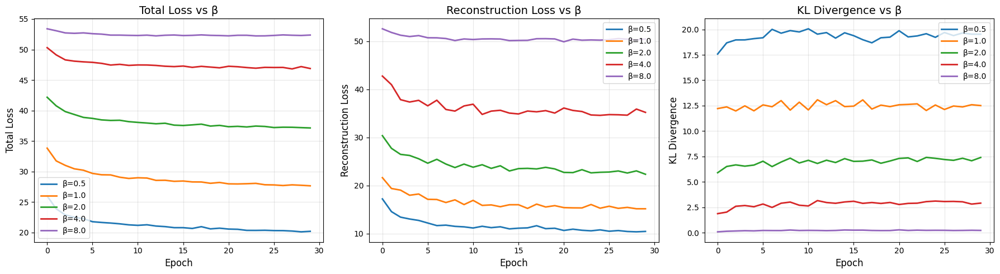

In [95]:
print("Training Dynamics Across β Values")
print("-"*70)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# total loss
for beta in beta_values:
  history = beta_vae_results[beta]['history']['val']['total_loss']
  axes[0].plot(history, label=f'β={beta}', linewidth=2)

axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Total Loss', fontsize=12)
axes[0].set_title('Total Loss vs β', fontsize=14)
axes[0].legend()
axes[0].grid(alpha=0.3)

# reconstruction loss
for beta in beta_values:
  history = beta_vae_results[beta]['history']['val']['recon_loss']
  axes[1].plot(history, label=f'β={beta}', linewidth=2)

axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Reconstruction Loss', fontsize=12)
axes[1].set_title('Reconstruction Loss vs β', fontsize=14)
axes[1].legend()
axes[1].grid(alpha=0.3)

# KL divergence
for beta in beta_values:
  history = beta_vae_results[beta]['history']['val']['kl_loss']
  axes[2].plot(history, label=f'β={beta}', linewidth=2)

axes[2].set_xlabel('Epoch', fontsize=12)
axes[2].set_ylabel('KL Divergence', fontsize=12)
axes[2].set_title('KL Divergence vs β', fontsize=14)
axes[2].legend()
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

Latent Space Disentanglement
----------------------------------------------------------------------
Disentanglement analysis: β-VAE (β=0.5)
----------------------------------------------------------------------
Disentanglement metric: 0.9925 (higher is better, max=1.0)
Mean dimension variance: 0.8516
Std dimension variance:  0.1695
Active dimensions (var > 0.01): 16/16


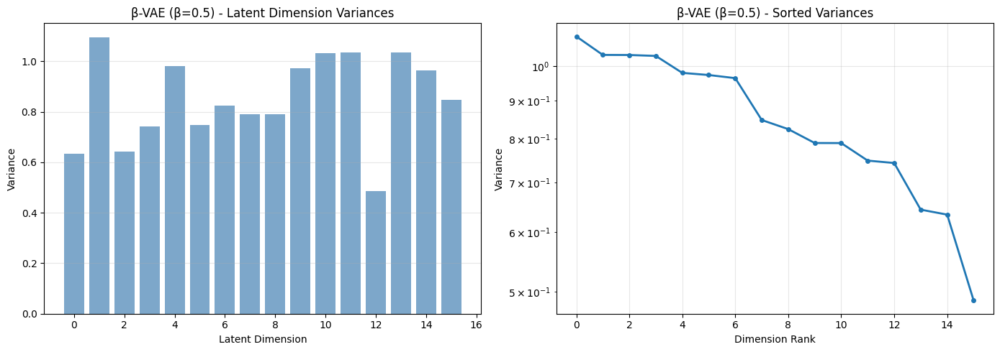

Disentanglement analysis: β-VAE (β=1.0)
----------------------------------------------------------------------
Disentanglement metric: 0.9261 (higher is better, max=1.0)
Mean dimension variance: 0.6127
Std dimension variance:  0.3358
Active dimensions (var > 0.01): 16/16


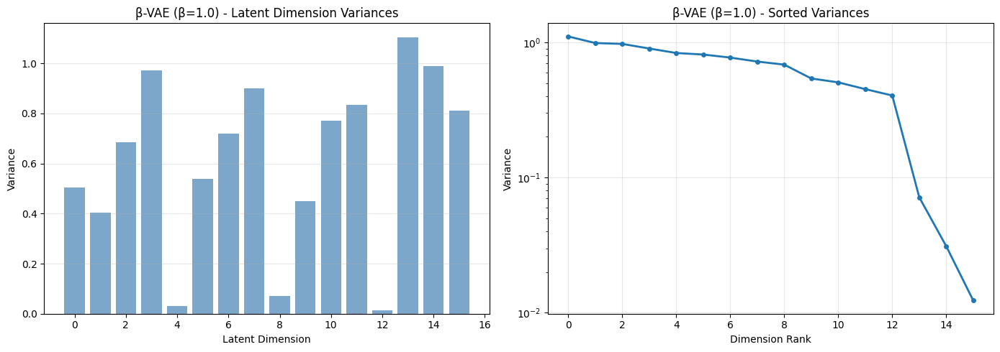

Disentanglement analysis: β-VAE (β=2.0)
----------------------------------------------------------------------
Disentanglement metric: 0.7966 (higher is better, max=1.0)
Mean dimension variance: 0.4075
Std dimension variance:  0.3856
Active dimensions (var > 0.01): 10/16


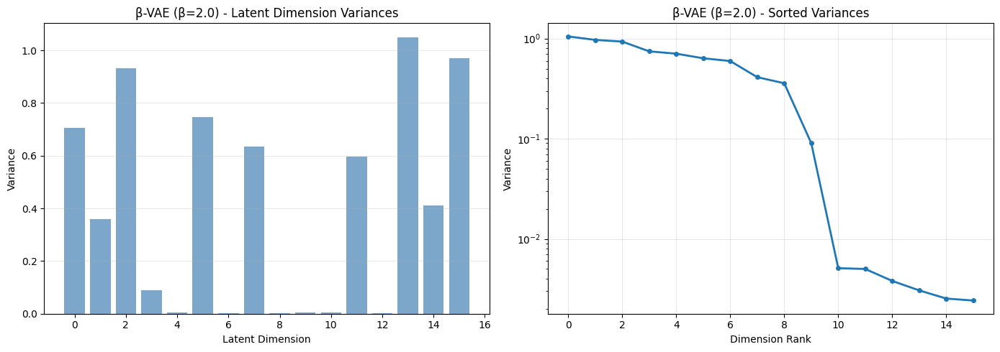

Disentanglement analysis: β-VAE (β=4.0)
----------------------------------------------------------------------
Disentanglement metric: 0.6159 (higher is better, max=1.0)
Mean dimension variance: 0.1972
Std dimension variance:  0.2927
Active dimensions (var > 0.01): 6/16


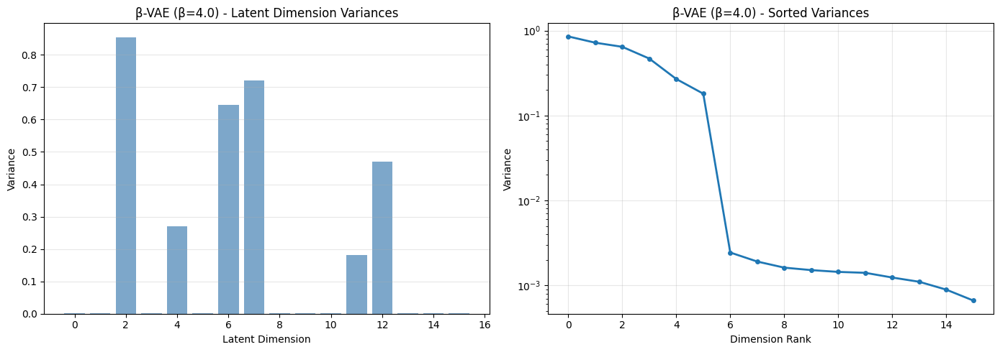

Disentanglement analysis: β-VAE (β=8.0)
----------------------------------------------------------------------
Disentanglement metric: 0.0452 (higher is better, max=1.0)
Mean dimension variance: 0.0237
Std dimension variance:  0.0902
Active dimensions (var > 0.01): 1/16


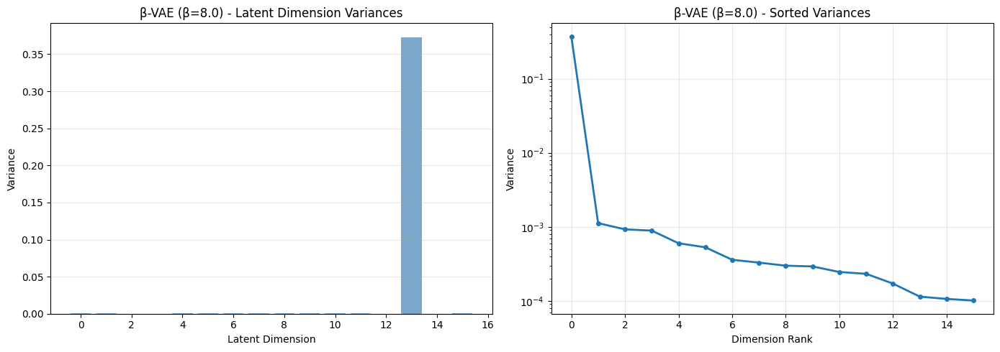

β-VAE Disentanglement Comparison
----------------------------------------------------------------------

Summary:
Beta       Disentanglement      Active Dims     Mean Var       
----------------------------------------------------------------------
0.5        0.9925               16              0.8516         
1.0        0.9261               16              0.6127         
2.0        0.7966               10              0.4075         
4.0        0.6159               6               0.1972         
8.0        0.0452               1               0.0237         


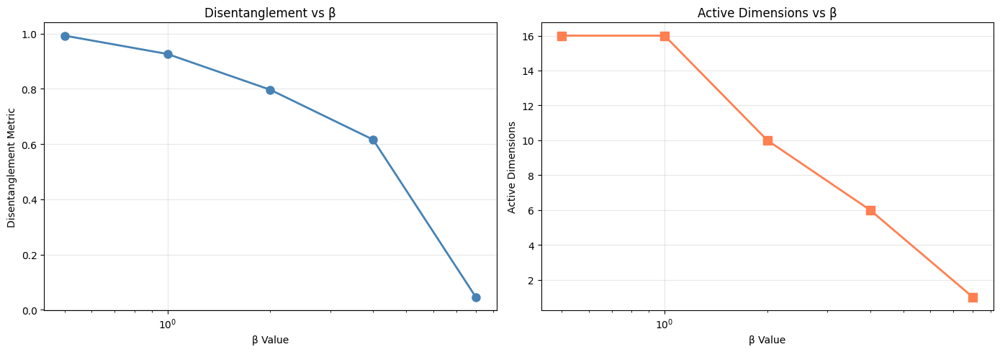

{0.5: {'metric': np.float64(0.9925307962208636),
  'variances': array([0.633725  , 1.0964631 , 0.64350194, 0.74279636, 0.9801504 ,
         0.7482837 , 0.82440037, 0.7897768 , 0.7899334 , 0.973726  ,
         1.0326585 , 1.0358224 , 0.48653328, 1.0355692 , 0.96437013,
         0.8478068 ], dtype=float32),
  'active_dims': np.int64(16)},
 1.0: {'metric': np.float64(0.9260641451939613),
  'variances': array([0.50561255, 0.40415266, 0.68386865, 0.97339845, 0.03102688,
         0.54014236, 0.72064704, 0.8998056 , 0.07140795, 0.45065925,
         0.7709881 , 0.8336074 , 0.01231254, 1.105342  , 0.9879606 ,
         0.8121468 ], dtype=float32),
  'active_dims': np.int64(16)},
 2.0: {'metric': np.float64(0.796555533666788),
  'variances': array([0.70670295, 0.35801136, 0.93314177, 0.09037971, 0.00509693,
         0.74550676, 0.00253585, 0.63593805, 0.00305917, 0.00380013,
         0.0050071 , 0.5967077 , 0.0024238 , 1.050527  , 0.4117507 ,
         0.9700476 ], dtype=float32),
  'active_dims':

In [101]:
print("Latent Space Disentanglement")
print("-"*70)

disentanglement_results = {}

for beta in beta_values:
  metric, variances = analyze_disentanglement(beta_vae_results[beta]['model'], val_digits, device,
                                              n_samples=1000, model_name=f"β-VAE (β={beta})")
  disentanglement_results[beta] = {'metric': metric, 'variances': variances}

models_dict = {beta: beta_vae_results[beta]['model'] for beta in beta_values}
compare_beta_effects(models_dict, val_digits, device)


β = 0.5:


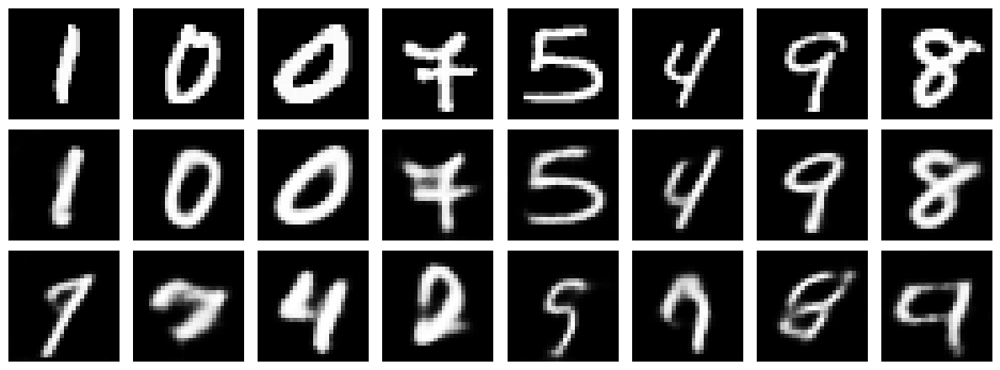


β = 1.0:


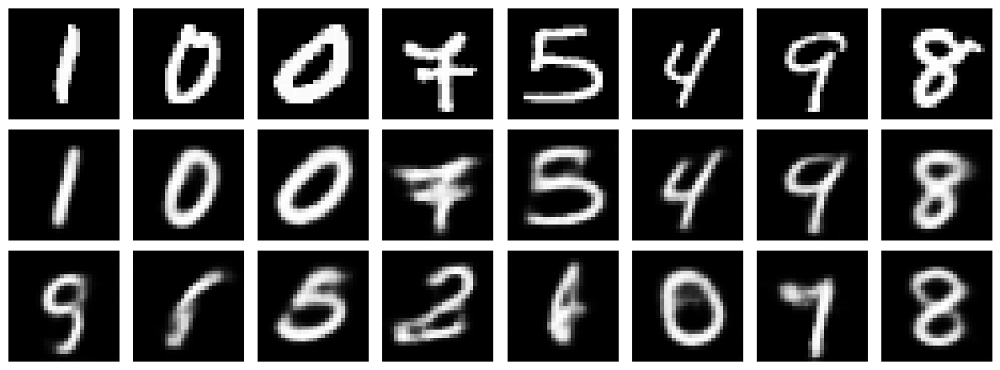


β = 2.0:


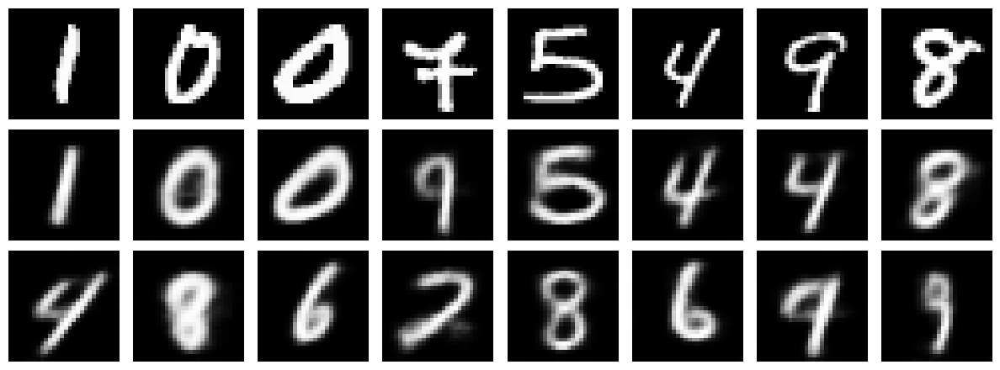


β = 4.0:


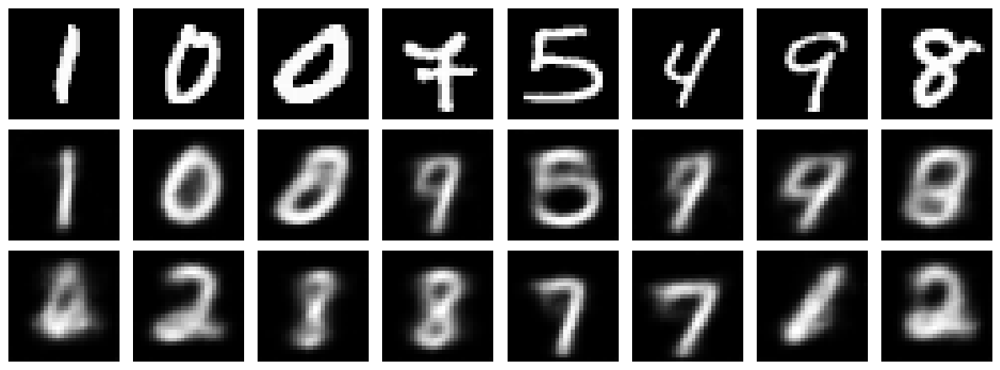


β = 8.0:


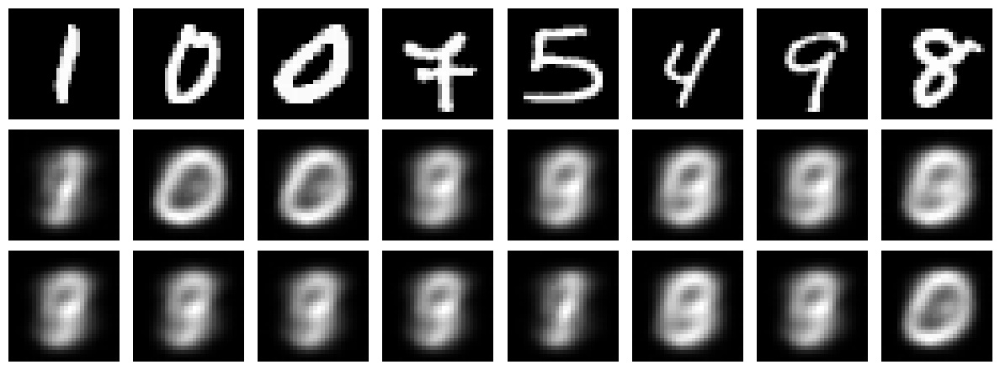

Reconstrcution Quality & Generation Diversity
----------------------------------------------------------------------

Results:
Beta       Recon MSE            Gen Diversity       
--------------------------------------------------
0.5        0.013733             8.2920              
1.0        0.019445             8.0397              
2.0        0.028658             7.1704              
4.0        0.045138             5.5145              
8.0        0.065418             1.6661              


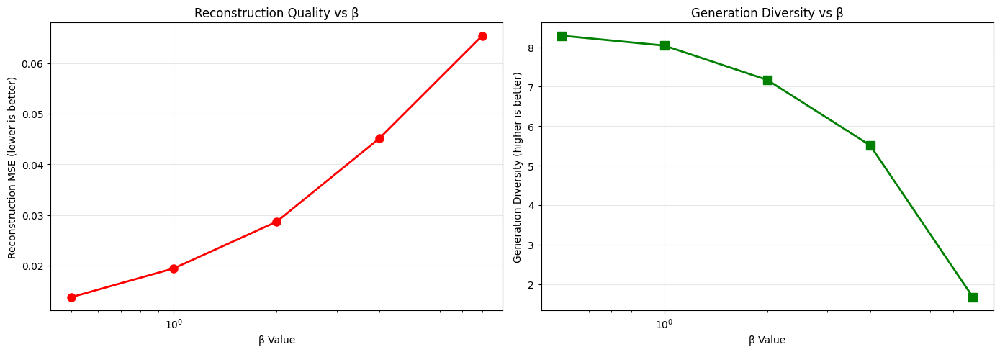

{0.5: {'reconstruction_mse': 0.01373309874907136,
  'generation_diversity': np.float64(8.292007349014282)},
 1.0: {'reconstruction_mse': 0.019444677978754044,
  'generation_diversity': np.float64(8.039735397815704)},
 2.0: {'reconstruction_mse': 0.02865809854120016,
  'generation_diversity': np.float64(7.170414100408554)},
 4.0: {'reconstruction_mse': 0.04513842985033989,
  'generation_diversity': np.float64(5.5144639045000075)},
 8.0: {'reconstruction_mse': 0.0654180757701397,
  'generation_diversity': np.float64(1.6660919082313776)}}

In [106]:
for beta in beta_values:
  print(f"\nβ = {beta}:")
  compare_reconstruction_and_samples(beta_vae_results[beta]['model'], val_digits, device, n_recon=8, n_samples=8)

compare_beta_reconstruction_diversity(models_dict, val_digits, device)

Generation Divrsity
----------------------------------------------------------------------

β = 0.5:


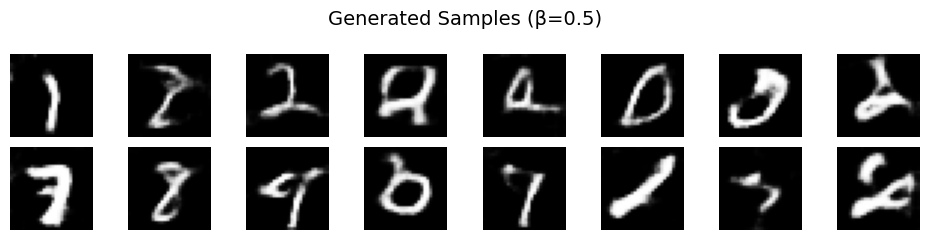


β = 1.0:


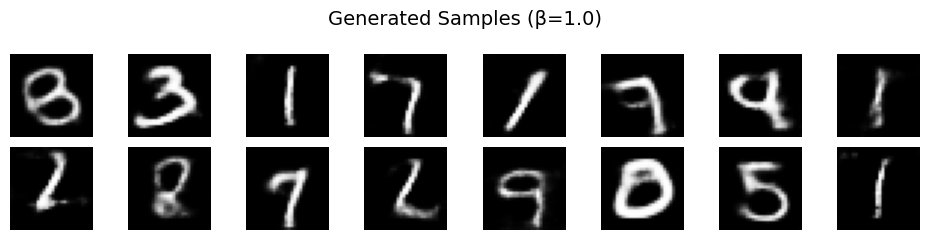


β = 2.0:


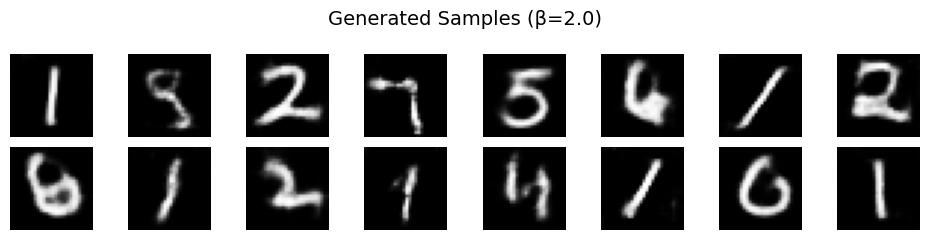


β = 4.0:


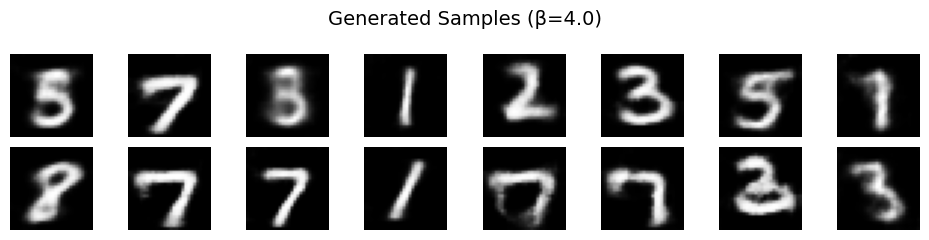


β = 8.0:


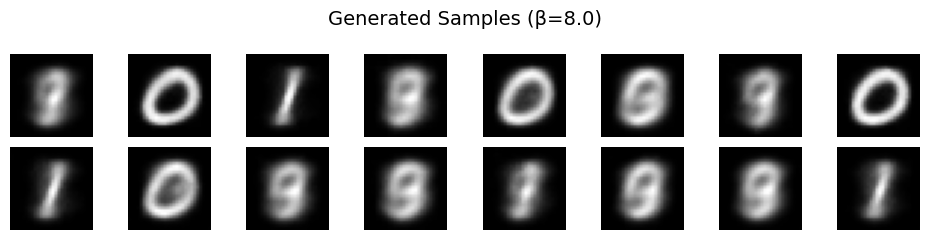

In [107]:
print("Generation Divrsity")
print("-"*70)

for beta in beta_values:
  print(f"\nβ = {beta}:")
  visualize_vae_samples(beta_vae_results[beta]['model'], device, n_samples=16, latent_range=2.0, title=f"Generated Samples (β={beta})")

Individual Latent Dimension Effects
----------------------------------------------------------------------

β = 0.5:
Showing first 10 latent dimensions:


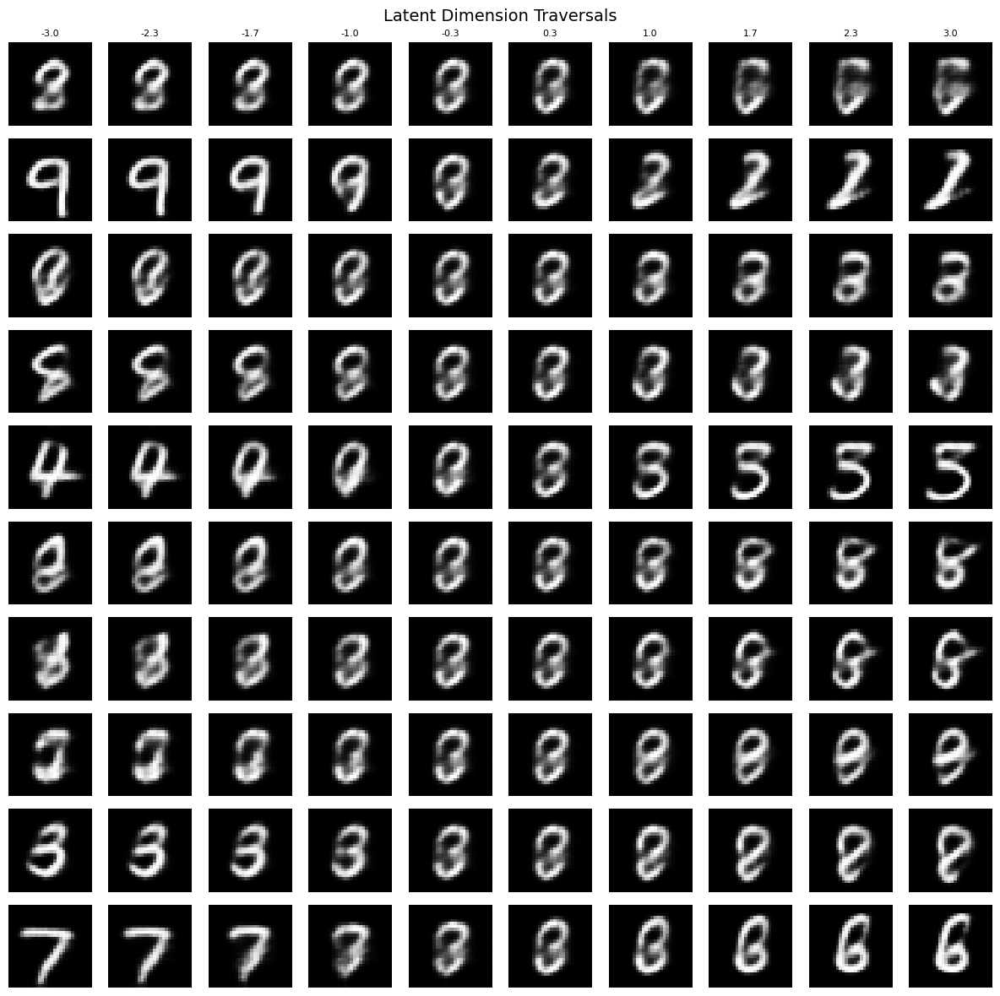


β = 1.0:
Showing first 10 latent dimensions:


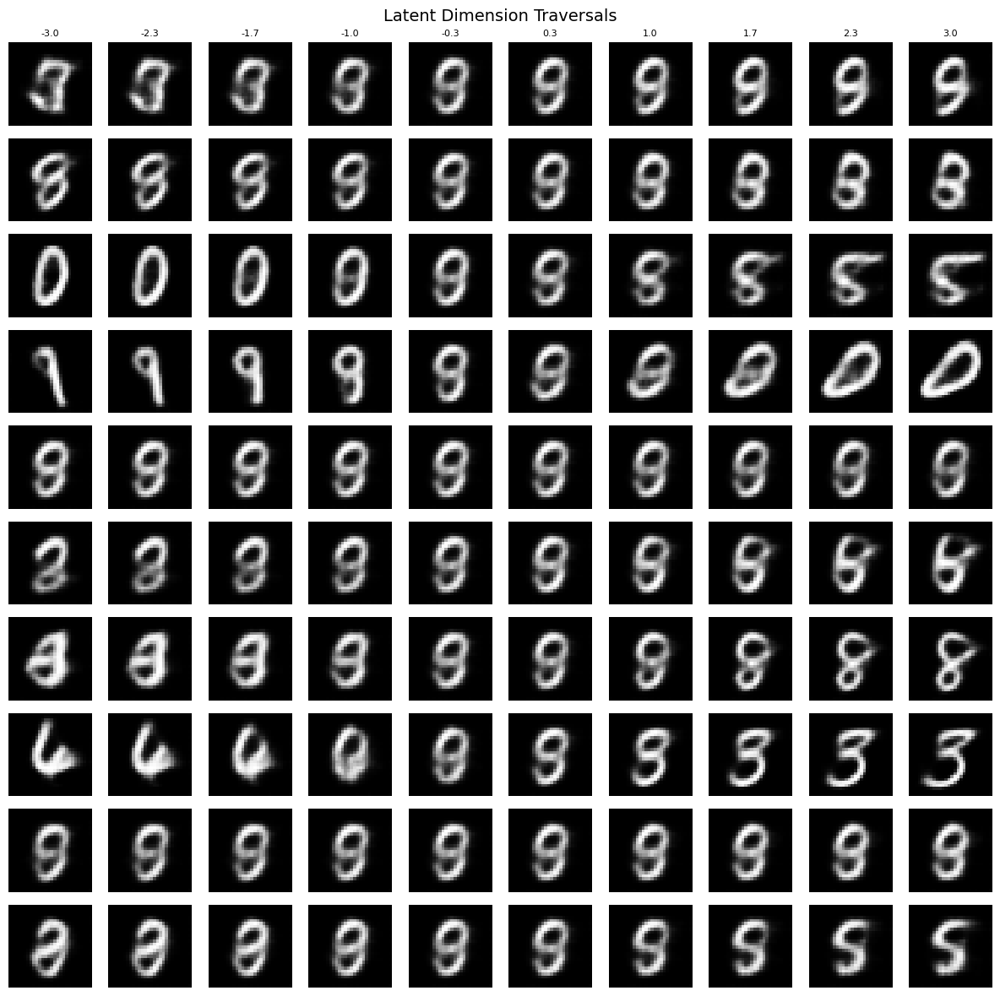


β = 2.0:
Showing first 10 latent dimensions:


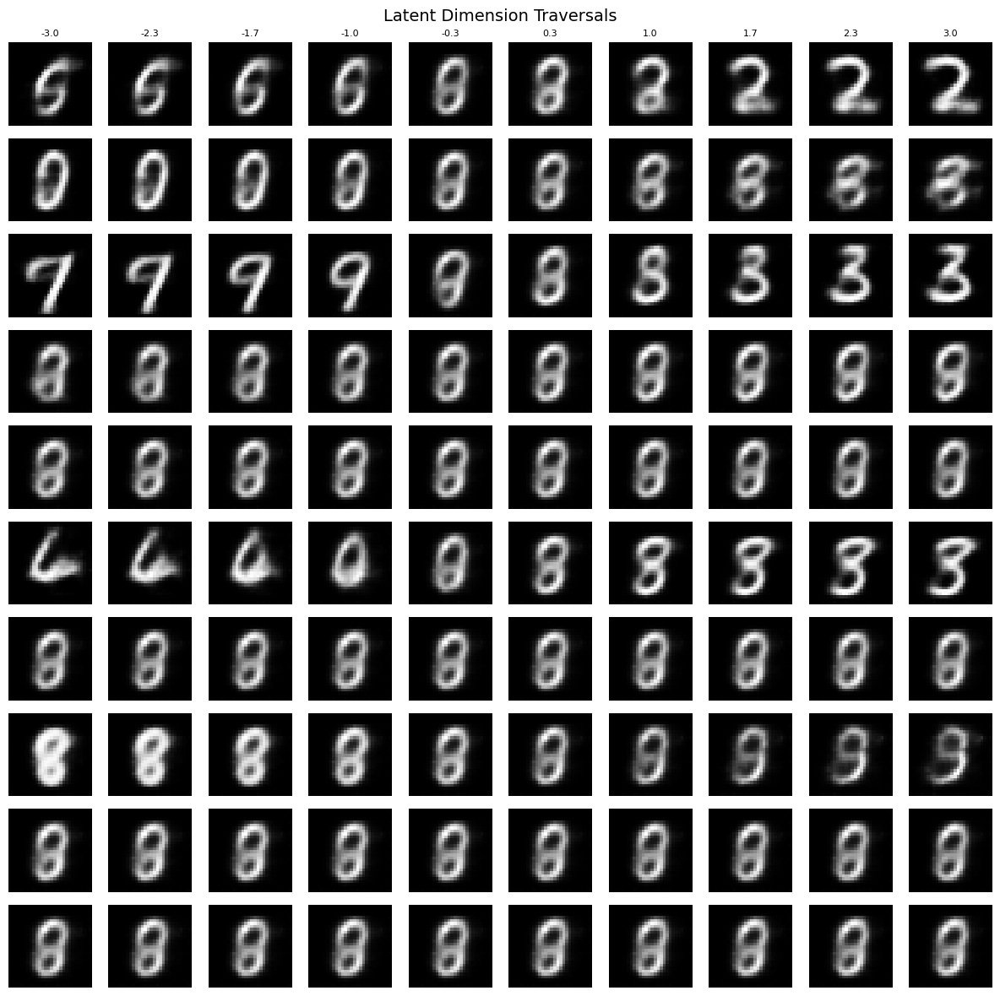


β = 4.0:
Showing first 10 latent dimensions:


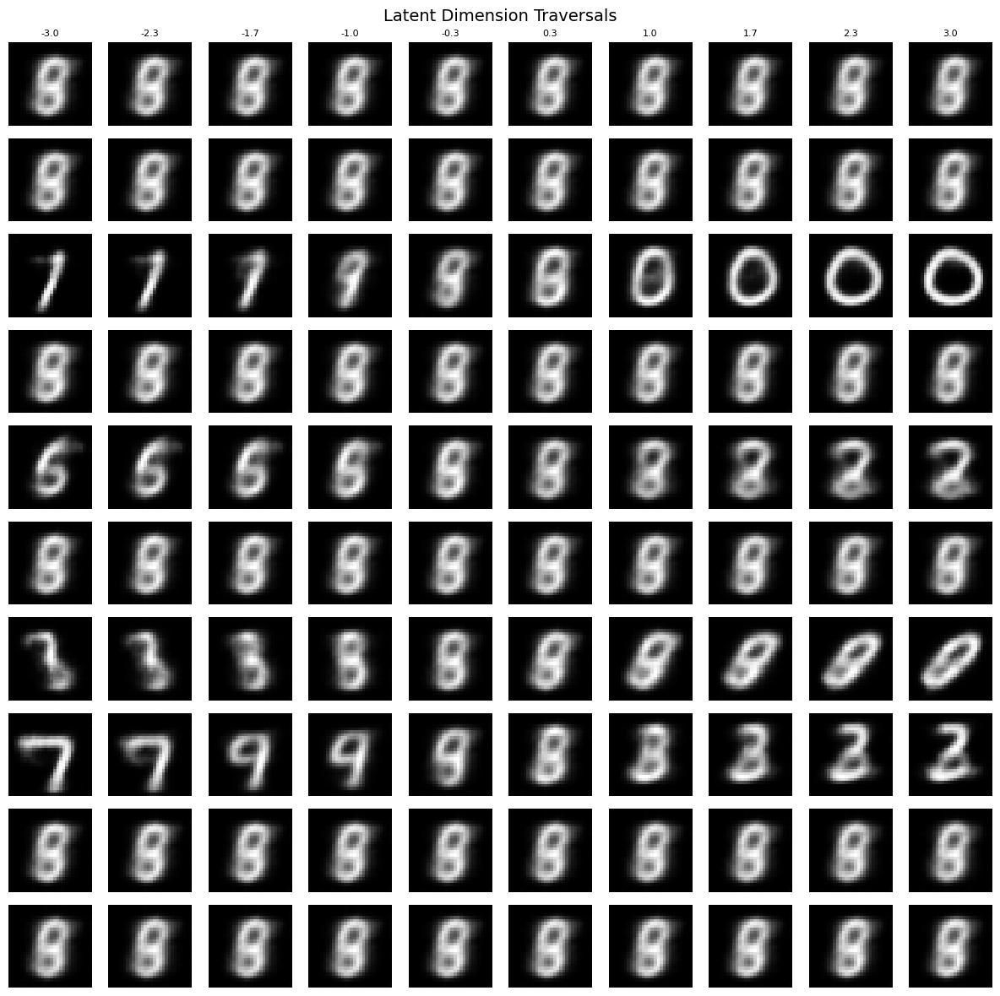


β = 8.0:
Showing first 10 latent dimensions:


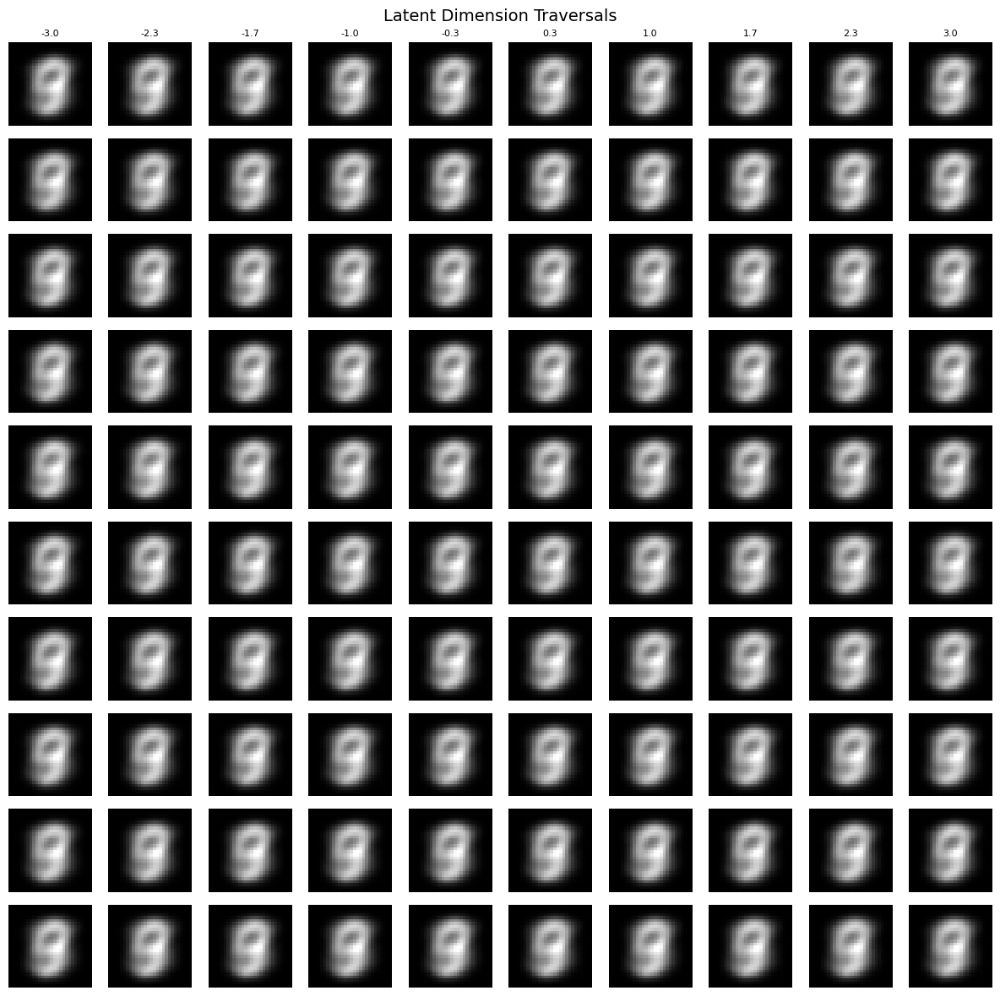

In [109]:
# Latent traversals show what each dimension controls
# Better disentanglement = each dimension controls one factor

print("Individual Latent Dimension Effects")
print("-"*70)

for beta in beta_values:
  print(f"\nβ = {beta}:")
  print("Showing first 10 latent dimensions:")

  visualize_all_latent_traversals(beta_vae_results[beta]['model'], device, n_dims_to_show=10, n_steps=10, traverse_range=(-3, 3))

Latent Traversal Comparison
----------------------------------------------------------------------

Dimension 0 across different β


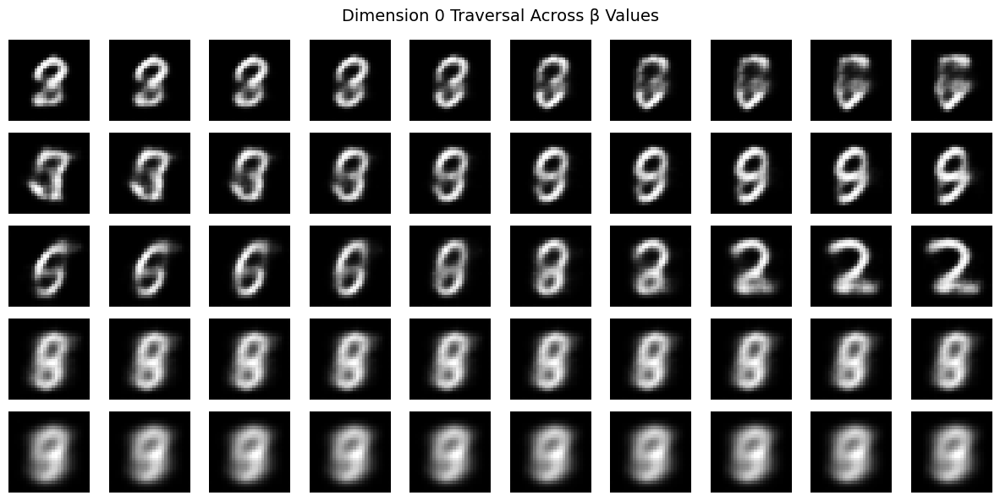


Dimension 3 across different β


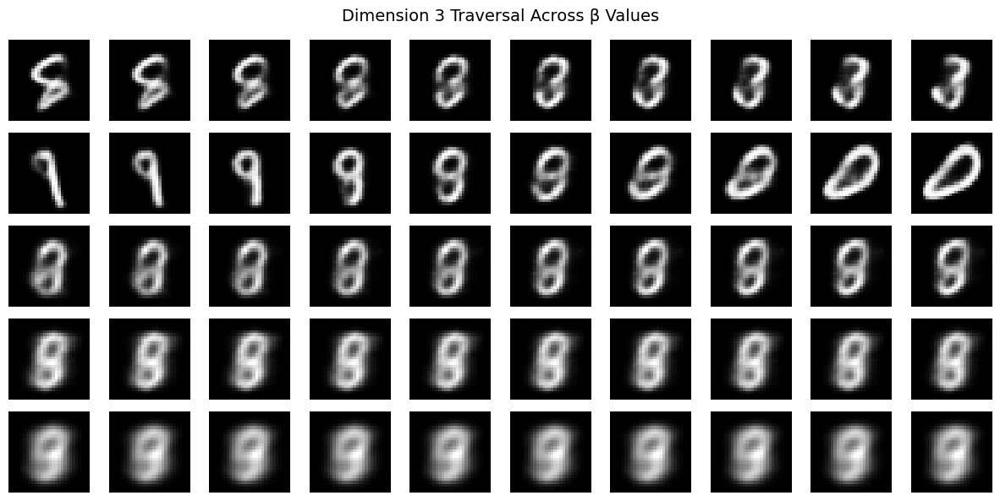


Dimension 7 across different β


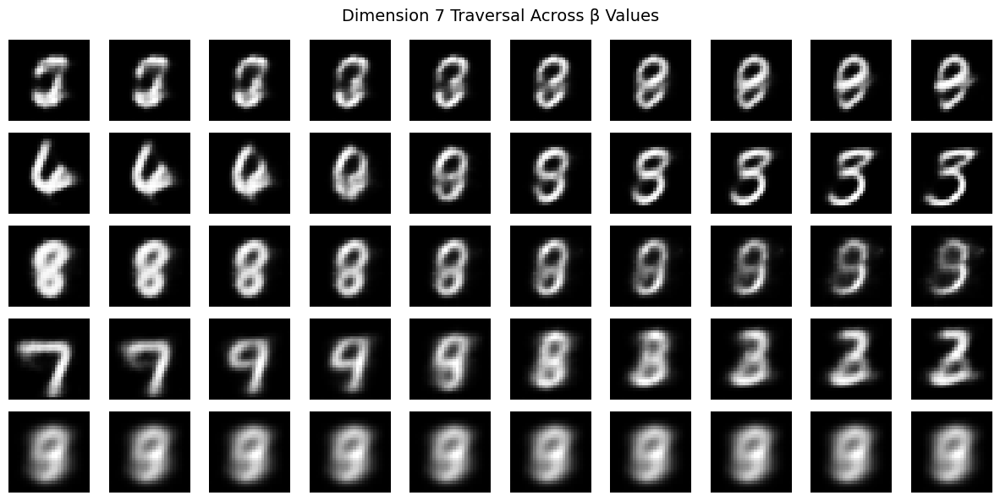

In [110]:
# Compare how the same dimension behaves across different β values

print("Latent Traversal Comparison")
print("-"*70)


for dim_idx in [0, 3, 7]:
  print(f"\nDimension {dim_idx} across different β")
  fig, axes = plt.subplots(len(beta_values), 10, figsize=(12, len(beta_values) * 1.2))

  for beta_idx, beta in enumerate(beta_values):
    model = beta_vae_results[beta]['model']
    model.eval()

    base_latent = torch.zeros(1, latent_dim, device=device)
    traverse_values = torch.linspace(-3, 3, 10, device=device)

    with torch.no_grad():
      for step_idx, val in enumerate(traverse_values):
        z = base_latent.clone()
        z[0, dim_idx] = val
        x = model.decoder(z)

        img = x.cpu().numpy().squeeze()
        axes[beta_idx, step_idx].imshow(img, cmap='gray')
        axes[beta_idx, step_idx].axis('off')

        if step_idx == 0:
          axes[beta_idx, step_idx].set_ylabel(f'β={beta}', fontsize=10)

  plt.suptitle(f'Dimension {dim_idx} Traversal Across β Values', fontsize=14)
  plt.tight_layout()
  plt.show()

Final Summary for β-VAE
----------------------------------------------------------------------

Quantitative Results:
β          Recon Loss      KL Loss         Total Loss      Disentangle    
---------------------------------------------------------------------------
0.5        10.4329         19.5243         20.1951         0.9925         
1.0        15.1470         12.5091         27.6561         0.9261         
2.0        22.3205         7.4089          37.1383         0.7966         
4.0        35.1961         2.9218          46.8834         0.6159         
8.0        50.4541         0.2394          52.3694         0.0452         


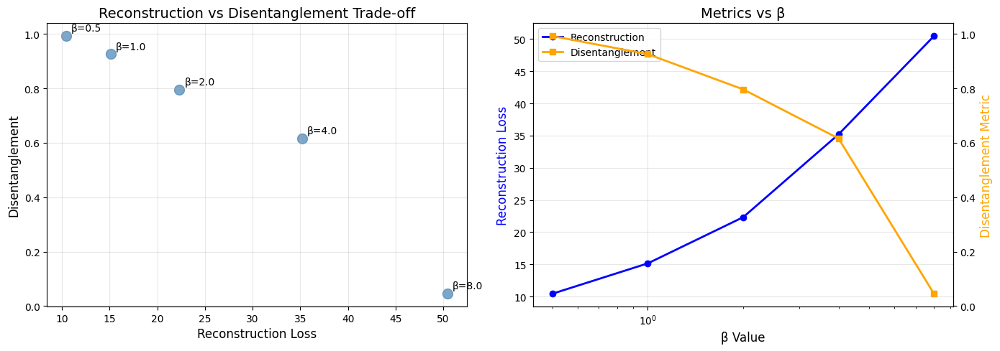

In [113]:
print("Final Summary for β-VAE")
print("-"*70)

summary_data = []

for beta in beta_values:
  recon_loss = beta_vae_results[beta]['history']['val']['recon_loss'][-1]
  kl_loss = beta_vae_results[beta]['history']['val']['kl_loss'][-1]
  total_loss = beta_vae_results[beta]['history']['val']['total_loss'][-1]
  disentangle = disentanglement_results[beta]['metric']

  summary_data.append({
      'beta': beta,
      'recon': recon_loss,
      'kl': kl_loss,
      'total': total_loss,
      'disentangle': disentangle})

print("\nQuantitative Results:")
print(f"{'β':<10} {'Recon Loss':<15} {'KL Loss':<15} {'Total Loss':<15} {'Disentangle':<15}")
print("-" * 75)

for data in summary_data:
  print(f"{data['beta']:<10} {data['recon']:<15.4f} {data['kl']:<15.4f} {data['total']:<15.4f} {data['disentangle']:<15.4f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

betas = [d['beta'] for d in summary_data]
recons = [d['recon'] for d in summary_data]
disentangles = [d['disentangle'] for d in summary_data]

axes[0].scatter(recons, disentangles, s=100, alpha=0.7, c='steelblue')
for i, beta in enumerate(betas):
    axes[0].annotate(f'β={beta}', (recons[i], disentangles[i]),
                     xytext=(5, 5), textcoords='offset points', fontsize=10)
axes[0].set_xlabel('Reconstruction Loss', fontsize=12)
axes[0].set_ylabel('Disentanglement', fontsize=12)
axes[0].set_title('Reconstruction vs Disentanglement Trade-off', fontsize=14)
axes[0].grid(alpha=0.3)

ax1_twin = axes[1].twinx()

line1 = axes[1].plot(betas, [d['recon'] for d in summary_data],
                     marker='o', label='Reconstruction', linewidth=2, color='blue')
line2 = ax1_twin.plot(betas, [d['disentangle'] for d in summary_data],
                      marker='s', label='Disentanglement', linewidth=2, color='orange')

axes[1].set_xlabel('β Value', fontsize=12)
axes[1].set_ylabel('Reconstruction Loss', fontsize=12, color='blue')
ax1_twin.set_ylabel('Disentanglement Metric', fontsize=12, color='orange')
axes[1].set_title('Metrics vs β', fontsize=14)
axes[1].grid(alpha=0.3)
axes[1].set_xscale('log')

lines = line1 + line2
labels = [l.get_label() for l in lines]
axes[1].legend(lines, labels, loc='upper left')

plt.tight_layout()
plt.show()